# PRACTICA EVALUACIÓN FINAL - PARTE I #

Esta practica final tiene por objetivo evaluar los conocimientos que se han adquirido por parte del alumno a lo largo de los distintos temas del módulo. La práctica se divide en 2 partes: ésta primera parte que permite evaluar los temas de Data Understanding, Data Preparation, Regresión Lineal, Regresión Logística, Selección de variables, Análisis de componentes principales (PCA), Análisis Factorial y técnicas de clustering.

Supone por tanto un 75% de la calificación correspondiente a la Prática de Evaluación Final completa incluyendo ambas partes. Por tanto la parte 2, incluirá ejercicios de evaluación de los temas de series temporales y por ello supondrá un 25%.

En conjunto, toda la Práctica de Evaluación Final (ambas partes) tiene un peso del 60% de la nota final (el test de evaluación sería el 40% restante).

Es importante tener presente que, dado que se va a utilizar el mismo conjunto de datos para evaluar distintos temas del módulo, se perseguirán objetivos distintos en distintas partes de esta práctica parte I. Por ejemplo, para el modelo de regresión lineal, se tomará como variable objetivo ***Salary***, mientras que para la regresión logística, la variable objetivo será ***Gender***. Se deberá tener presente esto especialmente a la hora de llevar a cabo toda la fase de entendimiento y preparación de los datos ya que habrá transformaciones y analisis que serán comunes para ambos modelos y otras que serán específicas de cada modelo. en este sentido, el alumno deberá organizarse como mejor considere para llevar a cabo la práctica siguiendo el guión establecido pero con cierta flexibilidad para incluir todo aquello que considere oportuno en el momento que considere oportuno.

Por la misma razón, la parte de clustering no tiene variable objetivo como tal pero el analisis exploratorio y la preparación de los datos puede llevar a que haya particularidades para sus ejercicios además de las comunes.

Comenzando con esta primera parte de la práctica, en el primer bloque de código, conviene cargar las librerías que se van a utilizar a lo largo del notebook.

In [241]:
# importar librerias
import numpy as np
import pandas as pd #usado
import seaborn as sns
from matplotlib import pyplot as plt

#sklearn
from sklearn.decomposition import PCA, FactorAnalysis
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, KFold
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder, OneHotEncoder
from sklearn.utils import resample
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score, roc_auc_score,
    roc_curve, confusion_matrix, classification_report, mean_squared_error, r2_score, make_scorer, ConfusionMatrixDisplay, silhouette_score)

#statsmodels y scipy
import statsmodels.api as sm
from statsmodels.tools import add_constant
from statsmodels.stats.outliers_influence import variance_inflation_factor
from scipy import stats
from scipy.stats import boxcox, shapiro, chi2_contingency, zscore
import scipy.cluster.hierarchy as sch
import scipy.spatial.distance as ssd

#Otras librerias
from factor_analyzer import calculate_kmo, calculate_bartlett_sphericity, FactorAnalyzer
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
from imblearn.over_sampling import SMOTE, SMOTENC
import geopandas as gpd
from itertools import combinations
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
from relativeImp import relativeImp

En el siguiente paso vamos a proceder a cargar el fichero Salary_MD.csv que servirá como conjunto de datos para llevar a cabo toda la evaluación de esta parte I. Se trata de un fichero en el que cada registro es un empleado y sobre él, cada campo aporta información laboral y de formación.

In [243]:
# Cargar el fichero de datos en un DataFrame
data_parte1 = pd.read_csv('Salary_MD.csv')

En los siguientes bloques de código el alumno debe programar las sentencias de código que considere oportunas para hacerse una idea general de los datos y de las variables. Visualización de datos, gráficos, etc. Los bloques son orientativos, el alumno puede añadir cuantos considere y codificarlos según su criterio.

In [245]:
# Mostrar los 10 primeros registros
data_parte1.head(10)

,Age,Gender,Education Level,Job Title,Years of Experience,Salary,Country,Race,Senior
0,32,Male,1.0,Software Engineer,5.0,90000,UK,White,0
1,28,Female,2.0,Data Analyst,3.0,65000,USA,NaN,0
2,45,Male,3.0,Manager,15.0,150000,Canada,White,1
3,36,Female,1.0,Sales Associate,7.0,60000,USA,Hispanic,0
4,52,Male,2.0,Director,20.0,200000,USA,Asian,0
5,29,Male,1.0,Marketing Analyst,2.0,55000,USA,Hispanic,0
6,42,Female,2.0,Product Manager,12.0,120000,USA,Asian,0
7,31,Male,1.0,Sales Manager,4.0,80000,China,Korean,0
8,26,Female,1.0,Marketing Coordinator,1.0,45000,China,Chinese,0
9,38,Male,3.0,Scientist,10.0,110000,Australia,Australian,1


In [246]:
# Describir el DataFrame
data_parte1.describe()

,Age,Education Level,Years of Experience,Salary,Senior
count,6684.000000,6661.000000,6684.000000,6.684000e+03,6684.000000
mean,33.147816,1.623480,8.161655,1.164338e+05,0.143477
std,8.619754,0.880016,7.356860,6.738536e+04,0.350585
min,0.000000,0.000000,0.000000,0.000000e+00,0.000000
25%,28.000000,1.000000,3.000000,7.000000e+04,0.000000
50%,32.000000,1.000000,7.000000,1.150000e+05,0.000000
75%,38.000000,2.000000,12.000000,1.600000e+05,0.000000
max,110.000000,3.000000,200.000000,2.159320e+06,1.000000


In [247]:
# Mostrar las columnas y tipos de datos
data_parte1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6684 entries, 0 to 6683
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Age                  6684 non-null   int64  
 1   Gender               6613 non-null   object 
 2   Education Level      6661 non-null   float64
 3   Job Title            6644 non-null   object 
 4   Years of Experience  6684 non-null   float64
 5   Salary               6684 non-null   int64  
 6   Country              6660 non-null   object 
 7   Race                 6521 non-null   object 
 8   Senior               6684 non-null   int64  
dtypes: float64(2), int64(3), object(4)
memory usage: 470.1+ KB


Variables númericas:  ['Age' 'Education Level' 'Years of Experience' 'Salary' 'Senior']


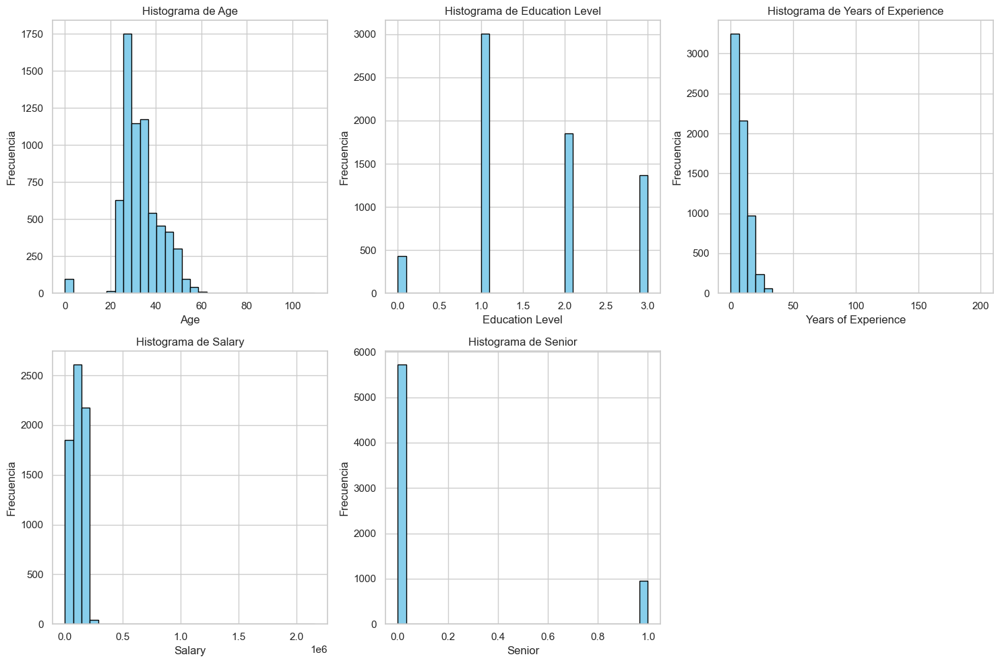

In [248]:
# subplots
columnas_numericas = data_parte1.select_dtypes(include = [np.number]).columns
print('Variables númericas: ', columnas_numericas.values)

num_vars = len(columnas_numericas)
fig, axes = plt.subplots(nrows=(num_vars // 3) + 1, ncols=3, figsize=(15, 5 * ((num_vars // 3) + 1)))
axes = axes.flatten()

for i, col in enumerate(columnas_numericas):
    axes[i].hist(data_parte1[col], bins=30, color='skyblue', edgecolor='black')
    axes[i].set_title(f'Histograma de {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frecuencia')

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [249]:
# cantidad de valores únicos en las columnas
data_parte1.nunique()

Age                     47
Gender                   2
Education Level          4
Job Title              129
Years of Experience     44
Salary                 445
Country                  5
Race                    10
Senior                   2
dtype: int64

In [250]:
columna_categorica = data_parte1.select_dtypes(include=['object', 'category']).columns
print('Valores categoricos', columna_categorica.values)

cardinalidad = data_parte1[columna_categorica].nunique()
print('\n',cardinalidad.sort_values(ascending=False))

Valores categoricos ['Gender' 'Job Title' 'Country' 'Race']

 Job Title    129
Race          10
Country        5
Gender         2
dtype: int64


### Pregunta 1 ###
De este primer vistazo general, ¿qué conclusiones sacamos acerca de las variables ***Salary*** y ***Years of Experience***? ¿Qué características tiene la variable ***Job Title***?

***Respuesta:***

Salary:
*   Tiene Valores minimos de 0
*   Tiene un salario bastante elevado
*   Es tipo Interger cuando deberia ser tipo float


Years of Experience:


*   Existe alguien con 200 años de experiencia, dato que se considera imposible
*   El 50% de los datos tiene 7 años de experiencia un poco por debajo de la media de 8.16
* Es tipo float cuando deberia ser tipo interger

Job title:
* Existen 129 titulos únicos
* Tiene 40 Valores Nulos

Pasamos ahora a profundizar aún más en las variables a través de las relaciones entre ellas. El alumno debe analizar correlaciones y las relaciones entre categóricas o categoricas y númericas.

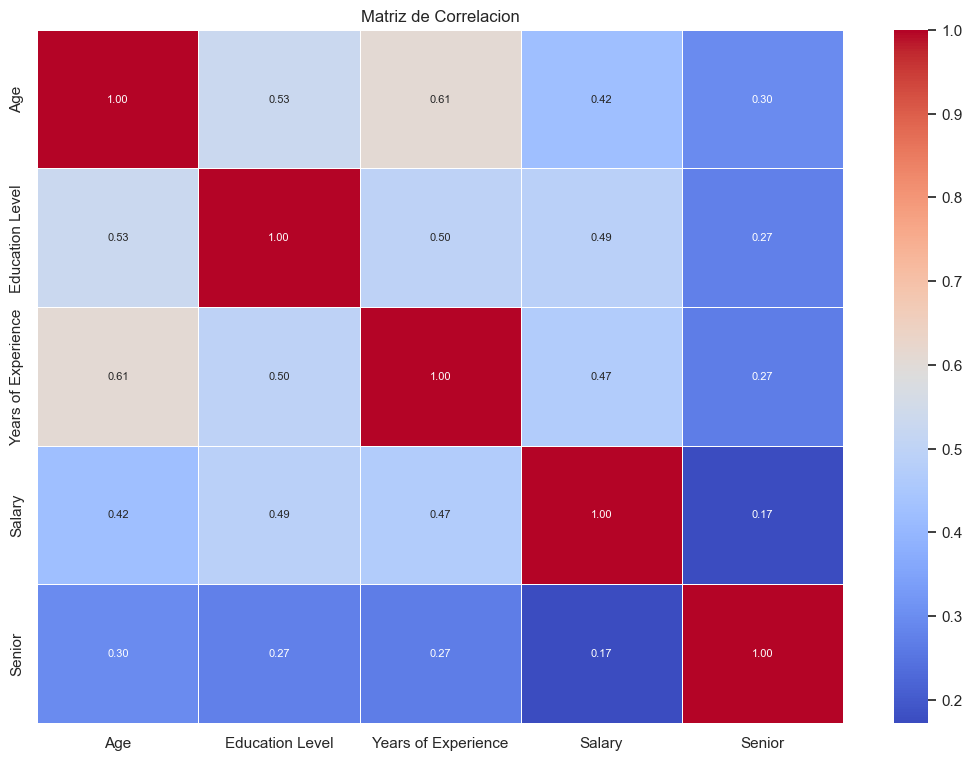

In [255]:
# Calcular la matriz de correlación
df_num = data_parte1.drop(['Gender','Job Title', 'Country', 'Race'], axis = 1)
correlacion = df_num.corr()
plt.figure(figsize=(13, 9))
sns.heatmap(correlacion, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, annot_kws={"size": 8})
plt.title("Matriz de Correlacion")
plt.show()

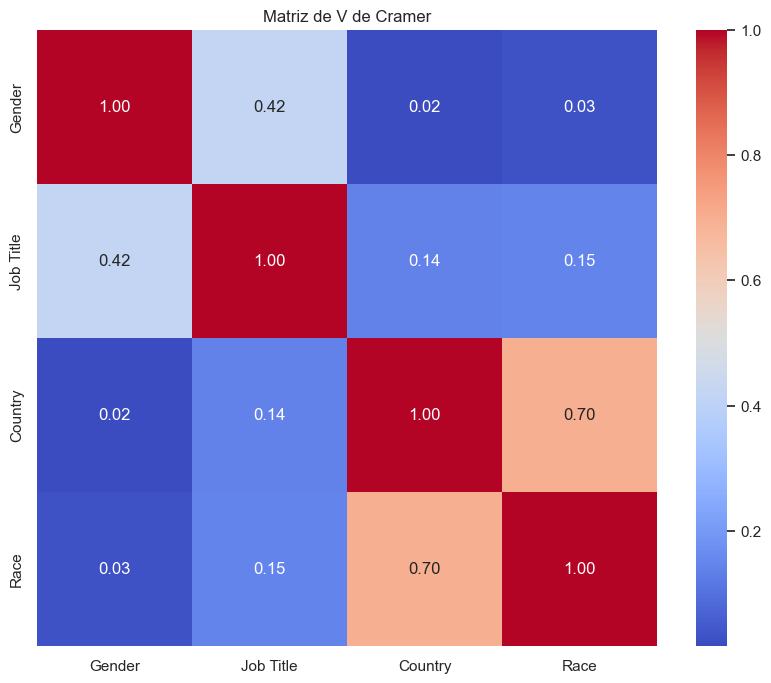

In [256]:
# Calcular la matriz de coeficientes V de Cramér
def cramers_v(confusion_matrix):
    chi2, p, dof, expected = chi2_contingency(confusion_matrix)
    n = confusion_matrix.sum().sum()
    k = min(confusion_matrix.shape)
    return np.sqrt(chi2 / (n * (k - 1)))

categorical_cols = cardinalidad.index

matrix = pd.DataFrame(index= categorical_cols, columns= categorical_cols)

for var1, var2 in combinations(categorical_cols, 2):
    contingency_table = pd.crosstab(data_parte1[var1], data_parte1[var2])
    value = cramers_v(contingency_table)
    matrix.loc[var1, var2] = value
    matrix.loc[var2, var1] = value

np.fill_diagonal(matrix.values, 1)

matrix = matrix.astype(float)

plt.figure(figsize=(10, 8))
sns.heatmap(matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matriz de V de Cramer")
plt.show()

In [257]:
# ...

### Pregunta 2 ###
¿Cualés son las relaciones más destacadas entre variables? Describe estas relaciones e interpretalas brevemente.

***Respuesta:***

Correlación alta entre la edad y los años de experiencia. Tiene sentido ya que mientras mayores sean más experiencia tendrán en el área

Correlación alta entre el país y la raza. Tiene sentido su correlación ya que cada país cuenta con diferentes mix de razas

Nos centramos ahora en la calidad del dato. Arrancamos con el analisis de valores nulos donde el alumno debe programar código para determinar las variables que tienen valores nulos, el número de registros de cada variable con valores nulos, etc.

In [262]:
# Tabla de porcentaje de registros con Missing Values por cada variable
missing_data = data_parte1.isnull().sum()
missing_data_percentage = (missing_data / len(data_parte1)) * 100

missing_summary = pd.DataFrame({'Missing Values': missing_data,'Percentage': missing_data_percentage})

print("\nPorcentaje de valores faltantes por columna:")
missing_summary.sort_values(by='Percentage', ascending=False)


Porcentaje de valores faltantes por columna:


,Missing Values,Percentage
Race,163,2.438659
Gender,71,1.062238
Job Title,40,0.598444
Country,24,0.359066
Education Level,23,0.344105
Age,0,0.000000
Years of Experience,0,0.000000
Salary,0,0.000000
Senior,0,0.000000


In [263]:
# Cuenta de valores nulos por registro
null_counts = data_parte1.isnull().sum(axis=1)

summary = null_counts.value_counts().reset_index()
summary.columns = ['num_nulls', 'count']
summary = summary.sort_values('num_nulls').reset_index(drop=True)

def highlight_rows(s):
    color = 'background-color: red; color: white;' if s['num_nulls'] >= 3 else ''
    return [color] * len(s)

summary_styled = summary.style.apply(highlight_rows, axis=1)

summary_styled

,num_nulls,count
0,0,6461
1,1,161
2,2,32
3,3,24
4,4,6


200000.0


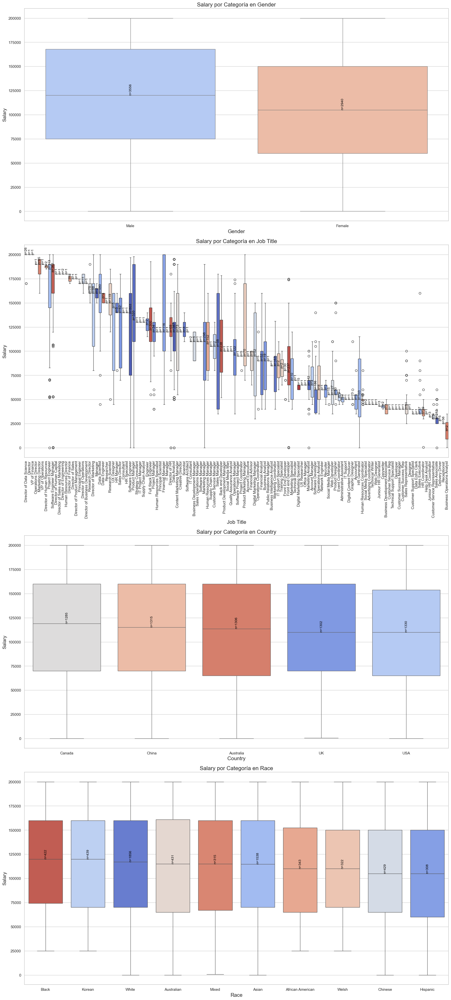

In [264]:
target_var = 'Salary'
percentil = 98

percent = np.percentile(data_parte1[target_var].dropna(), percentil)
print(percent)

filtered_data = data_parte1[data_parte1[target_var] <= percent]

n_cats = len(columna_categorica)
fig, axes = plt.subplots(n_cats, 1, figsize=(18, 10 * n_cats), constrained_layout=True)

for ax, cat in zip(axes, columna_categorica):
    
    medians = filtered_data.groupby(cat)[target_var].median().sort_values(ascending=False)
    ordered_categories = medians.index
    
    sns.boxplot(x=cat, y=target_var, hue=cat, data=filtered_data, order=ordered_categories, palette='coolwarm', legend=False, ax=ax)
    ax.set_title(f'{target_var} por Categoría en {cat}', fontsize=16)
    ax.set_xlabel(cat, fontsize=15)
    ax.set_ylabel(target_var, fontsize=14)
    
    for i, category in enumerate(ordered_categories):
        
        category_data = filtered_data[filtered_data[cat] == category][target_var]
        num_records = len(category_data)
        
        median_value = category_data.median()

        if np.isfinite(median_value):
            
            ax.text(
                i, median_value,  
                f'n={num_records}', 
                ha='center', va='bottom', fontsize=10, color='black', rotation=90  
            )
    
    num_categories = filtered_data[cat].nunique()
    if num_categories > 10:
        ax.tick_params(axis='x', labelrotation=90)
    else:
        ax.tick_params(axis='x', labelrotation=0) 

plt.show()

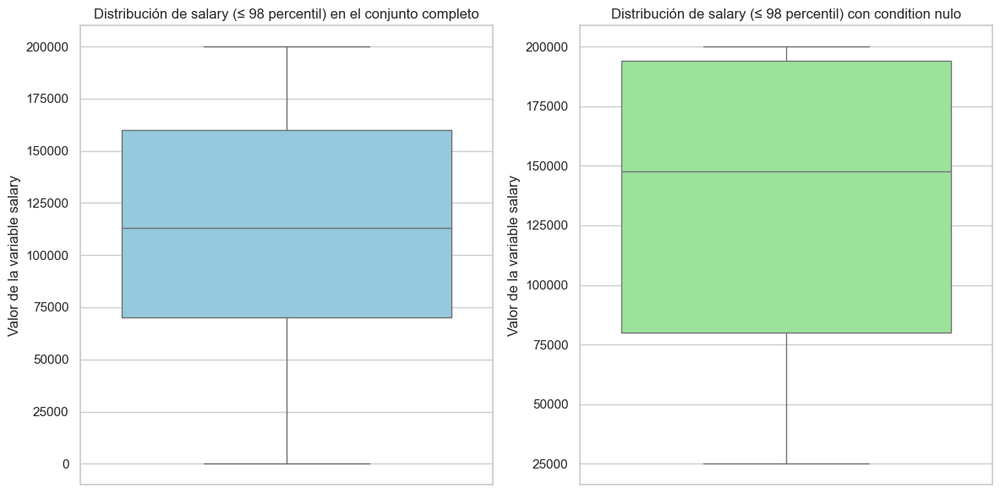

In [265]:
# Configuración para gráficos
sns.set(style="whitegrid")

p = 98
percentil = data_parte1['Salary'].quantile(p/100)

df_percentil = data_parte1[data_parte1['Salary'] <= percentil]

df_null_X = df_percentil[df_percentil['Gender'].isnull()]

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.boxplot(y='Salary', data=df_percentil, color="skyblue")
plt.title(f"Distribución de salary (≤ {p} percentil) en el conjunto completo")
plt.ylabel("Valor de la variable salary")

plt.subplot(1, 2, 2)
sns.boxplot(y='Salary', data=df_null_X, color="lightgreen")
plt.title(f"Distribución de salary (≤ {p} percentil) con condition nulo")
plt.ylabel("Valor de la variable salary")

plt.tight_layout()
plt.show()

In [266]:
tabla_contingencia = pd.crosstab(data_parte1['Gender'].isnull(), data_parte1['Salary'].isnull(),
                                rownames=['Gender_is_null'], colnames=['Salary_is_null'])

tabla_contingencia

Salary_is_null,False
Gender_is_null,
False,6613
True,71


In [267]:
value = cramers_v(tabla_contingencia)
value

C:\Users\swart\AppData\Local\Temp\ipykernel_8512\1092099106.py:6: RuntimeWarning: invalid value encountered in divide
  return np.sqrt(chi2 / (n * (k - 1)))


nan

### Pregunta 3 ###
¿Éxiste algún tipo de relación entre los valores nulos de la variable ***Gender*** y ***Salary***? Los nulos de ***Gender***, para esta práctica, hay que llevar a cabo algún tipo de imputación para no perder esos registros. ¿Cómo se realizará está imputación y cuales son las razones que llevan a hacerlo así?

***Respuesta:***

No existe una relacion entre los valores nulos de Gender y Salary, ya que Salary no cuenta con valores nulos. Para evitar que se pierda la data de gender se hara una imputación por medio de moda, ya que su cantidad de missing values es menor a 5% y no hay una correlacion lo suficientemente fuerte para rellenar los datos faltantes.

Antes de pasar a ejecutar las acciones que hayamos decidido realizar para corregir los problemas de valores nulos, analizamos los valores atípicos de las variables. Utilizaremos 2 métodos para identificarlos: Z-Score y rango intercuartil (IQR)

Umbral inferior: 7.290488287188829
Umbral superior: 59.00514307127916


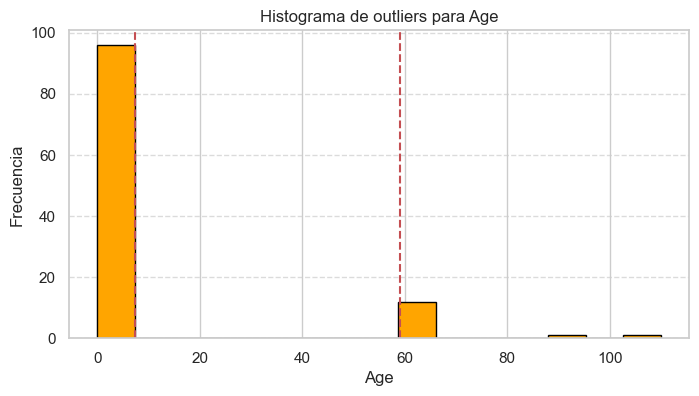

Umbral inferior: -13.90727341629892
Umbral superior: 30.230582811870434


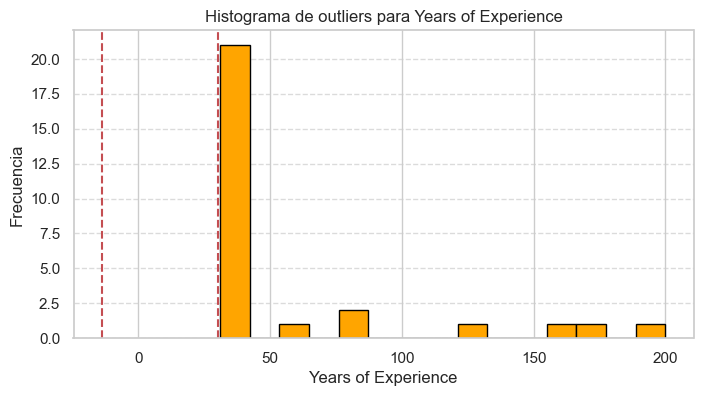

Umbral inferior: -85707.11109767927
Umbral superior: 318574.7735752376


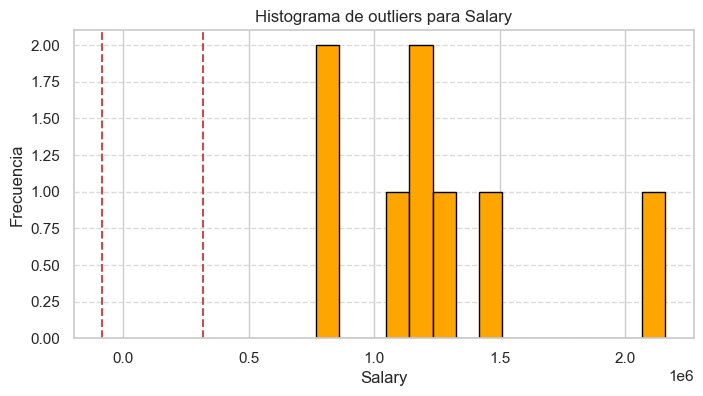


Outliers identificados:
              Variable Outliers
0                  Age      110
1  Years of Experience       28
2               Salary        8


In [272]:
# Identificación de outliers (Z-score)
outliers_zscore = pd.DataFrame(columns=['Variable', 'Outliers'])
for i, column in enumerate(columnas_numericas):
    z_scores = np.abs(stats.zscore(data_parte1[column], nan_policy='omit'))
    outlier_indices = np.where(z_scores > 3)[0]
    mu = np.mean(data_parte1[column])
    sigma = np.std(data_parte1[column])

    upper_bound = 3 * sigma + mu
    lower_bound = -3 * sigma + mu
    

    if len(outlier_indices) > 0:
        print(f"Umbral inferior: {lower_bound}")
        print(f"Umbral superior: {upper_bound}")
        outliers_zscore = pd.concat([outliers_zscore, pd.DataFrame({'Variable': [column], 'Outliers': [len(outlier_indices)]})], ignore_index=True)

        plt.figure(figsize=(8, 4))
        plt.hist(data_parte1[column].iloc[outlier_indices], bins=15, color='orange', edgecolor='black')
        plt.title(f'Histograma de outliers para {column}')
        plt.axvline(lower_bound, color='r', linestyle='--', label='Límite Inferior')
        plt.axvline(upper_bound, color='r', linestyle='--', label='Límite Superior')
        plt.xlabel(column)
        plt.ylabel('Frecuencia')
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        plt.show()

print("\nOutliers identificados:")
print(outliers_zscore)


Q1 (25 percentil) de Age: 28.0
Q3 (75 percentil) de Age: 38.0
Rango IQR de Age: 10.0
Umbral inferior de Age: 13.0
Umbral superior de Age: 53.0


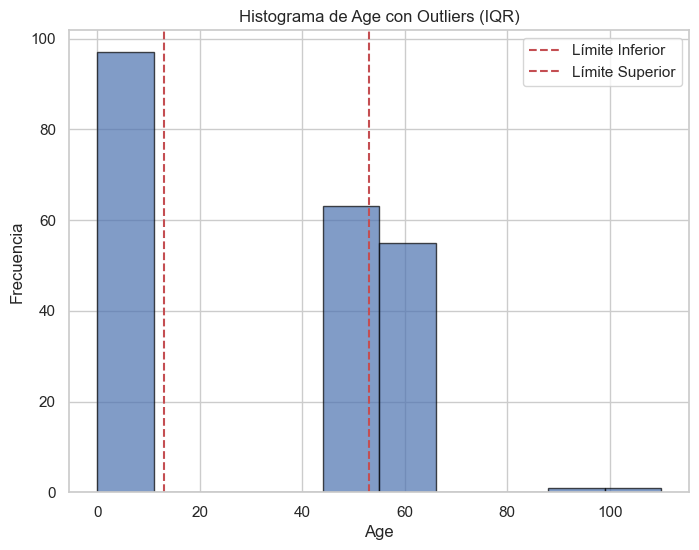

Q1 (25 percentil) de Years of Experience: 3.0
Q3 (75 percentil) de Years of Experience: 12.0
Rango IQR de Years of Experience: 9.0
Umbral inferior de Years of Experience: -10.5
Umbral superior de Years of Experience: 25.5


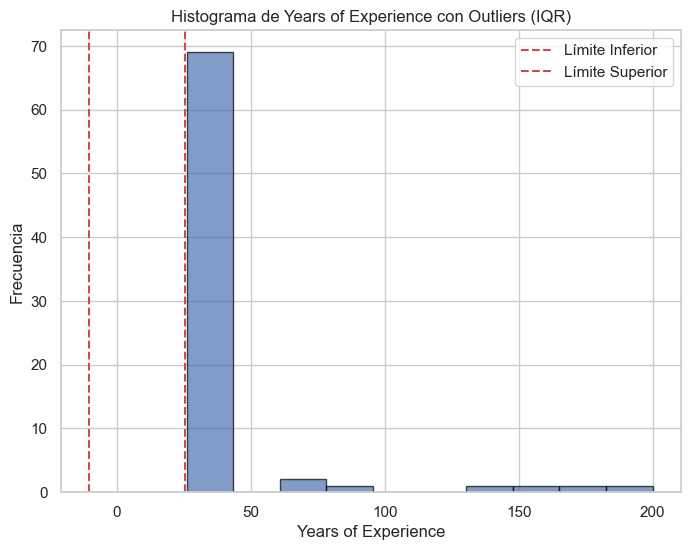

Q1 (25 percentil) de Salary: 70000.0
Q3 (75 percentil) de Salary: 160000.0
Rango IQR de Salary: 90000.0
Umbral inferior de Salary: -65000.0
Umbral superior de Salary: 295000.0


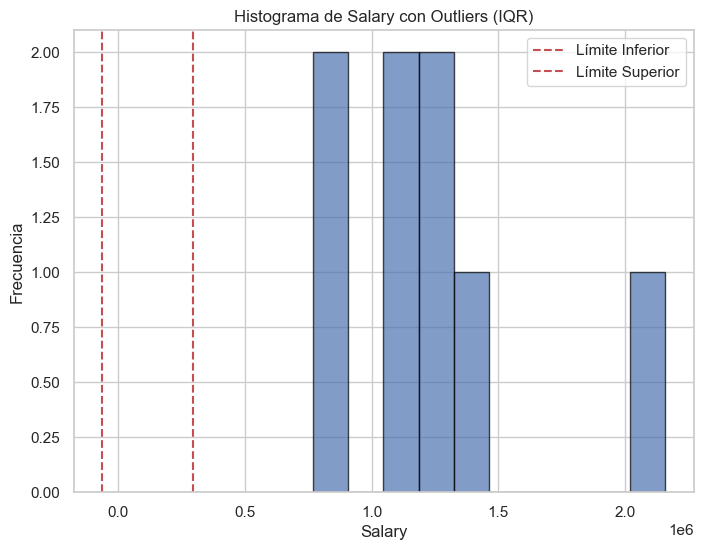


Outliers identificados mediante IQR:
              Variable Outliers
0                  Age      217
1  Years of Experience       76
2               Salary        8


In [273]:
# Identificación de outliers (IQR)
outliers_iqr = pd.DataFrame(columns=['Variable', 'Outliers'])
for i, column in enumerate(columnas_numericas):
    if column == 'Senior':
        continue

    df_dropna = data_parte1[column].dropna()

    if df_dropna.empty:
        print(f"La columna {column} está vacía después de dropna.")
        continue
    Q1 = df_dropna.quantile(0.25)
    Q3 = df_dropna.quantile(0.75)
    IQR = Q3 - Q1


    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR


    outliers_values = df_dropna[(df_dropna < lower_bound) | (df_dropna > upper_bound)]

    if len(outliers_values) > 0:
        outliers_iqr = pd.concat([outliers_iqr, pd.DataFrame({'Variable': [column], 'Outliers': [len(outliers_values)]})], ignore_index=True)

        print(f"Q1 (25 percentil) de {column}: {Q1}")
        print(f"Q3 (75 percentil) de {column}: {Q3}")
        print(f"Rango IQR de {column}: {IQR}")
        print(f"Umbral inferior de {column}: {lower_bound}")
        print(f"Umbral superior de {column}: {upper_bound}")

        plt.figure(figsize=(8, 6))
        plt.hist(outliers_values, bins=10, edgecolor='black', alpha=0.7)
        plt.axvline(lower_bound, color='r', linestyle='--', label='Límite Inferior')
        plt.axvline(upper_bound, color='r', linestyle='--', label='Límite Superior')
        plt.title(f"Histograma de {column} con Outliers (IQR)")
        plt.xlabel(column)
        plt.ylabel('Frecuencia')
        plt.legend()
        plt.show()



print("\nOutliers identificados mediante IQR:")
print(outliers_iqr)

In [274]:
# ...

### Pregunta 4 ###
¿Qué variables tienen outliers? en ocasiones, dependiendo de los outliers de una variable, es más apropiado identificarlos mediante un método u otro. En tu opinión y en base al estudio de los outliers de cada variable numérica, ¿cuál es el más apropiado para cada una y por qué?

***Respuesta:***

Age, Years of Experience and Salary. Para Age tiene mas sentido el IQR ya que el limite inferior es 13. Years of experience es mejor usar el Z-score ya que el limite superior es mejor. Salary puede usar cualquiera de los 2 debido a sus outliers

Ahora procedemos a trabajar los datos seleccionando registros, variables y solventando los problemas de outliers y valores nulos para dejar preparado el conjunto de datos para la fase de modelado posterior. En este sentido, las siguientes líneas de código, deben programarse para realizar estas transformaciones.

In [279]:
# Seleccion/Eliminación de registros y variables
# Senior, Country, Race
data_salary = data_parte1.drop(columns=['Senior','Country','Race'])

data_salary.head()

,Age,Gender,Education Level,Job Title,Years of Experience,Salary
0,32,Male,1.0,Software Engineer,5.0,90000
1,28,Female,2.0,Data Analyst,3.0,65000
2,45,Male,3.0,Manager,15.0,150000
3,36,Female,1.0,Sales Associate,7.0,60000
4,52,Male,2.0,Director,20.0,200000


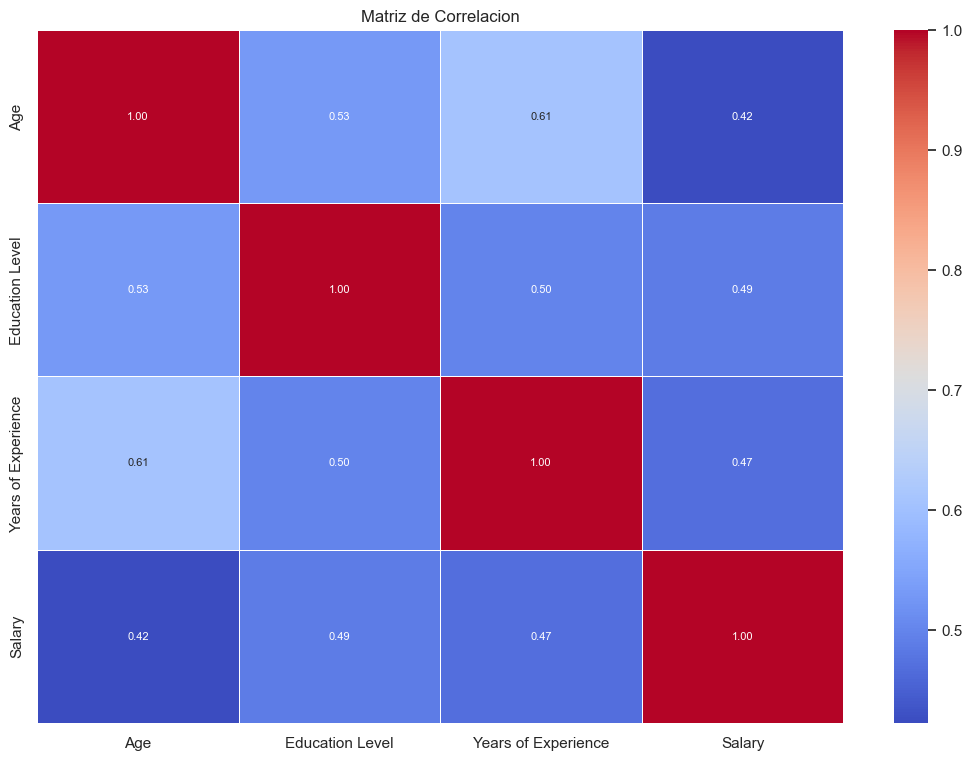

In [280]:
filtro_1 = data_salary.drop(['Gender','Job Title'], axis = 1)
correlacion_2 = filtro_1.corr()
plt.figure(figsize=(13, 9))
sns.heatmap(correlacion_2, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, annot_kws={"size": 8})
plt.title("Matriz de Correlacion")
plt.show()

In [281]:
# Imputación o acciones para tratar valores nulos
null_counts1 = data_salary.isnull().sum(axis=1)

summary1 = null_counts1.value_counts().reset_index()
summary1.columns = ['num_nulls', 'count']
summary1 = summary1.sort_values('num_nulls').reset_index(drop=True)

summary_styled2 = summary1.style.apply(highlight_rows, axis=1)

summary_styled2

,num_nulls,count
0,0,6594
1,1,55
2,2,26
3,3,9


In [282]:
missing_data_salary = data_salary.isnull().sum()
missing_salary_percentage = (missing_data_salary / len(data_salary)) * 100

missing_salary_summary = pd.DataFrame({'Missing Values': missing_data_salary,'Percentage': missing_salary_percentage})

print("\nPorcentaje de valores faltantes por columna:")
missing_salary_summary.sort_values(by='Percentage', ascending=False)


Porcentaje de valores faltantes por columna:


,Missing Values,Percentage
Gender,71,1.062238
Job Title,40,0.598444
Education Level,23,0.344105
Age,0,0.000000
Years of Experience,0,0.000000
Salary,0,0.000000


In [283]:
data_salary.dropna(thresh=data_salary.shape[1] - 2, inplace=True)

In [284]:
null_counts2 = data_salary.isnull().sum(axis=1)

summary2 = null_counts2.value_counts().reset_index()
summary2.columns = ['num_nulls', 'count']
summary2 = summary2.sort_values('num_nulls').reset_index(drop=True)

summary_styled3 = summary2.style.apply(highlight_rows, axis=1)

summary_styled3

,num_nulls,count
0,0,6594
1,1,55
2,2,26


In [285]:
#Eliminar Job Titles con valores nulos
data_salary = data_salary[~(data_salary['Job Title'].isnull())]

#Moda de genero
moda_genero = data_salary['Gender'].mode()[0]

data_salary['Gender'] = data_salary['Gender'].fillna(moda_genero)

#Media de Education Level
media_education = data_salary['Education Level'].mean().round()

data_salary['Education Level'] = data_salary['Education Level'].fillna(media_education)

In [286]:
missing_data_salary2 = data_salary.isnull().sum()
missing_salary_percentage2 = (missing_data_salary2 / len(data_salary)) * 100

missing_salary_summary2 = pd.DataFrame({'Missing Values': missing_data_salary2,'Percentage': missing_salary_percentage2})

print("\nPorcentaje de valores faltantes por columna:")
missing_salary_summary2.sort_values(by='Percentage', ascending=False)


Porcentaje de valores faltantes por columna:


,Missing Values,Percentage
Age,0,0.0
Gender,0,0.0
Education Level,0,0.0
Job Title,0,0.0
Years of Experience,0,0.0
Salary,0,0.0


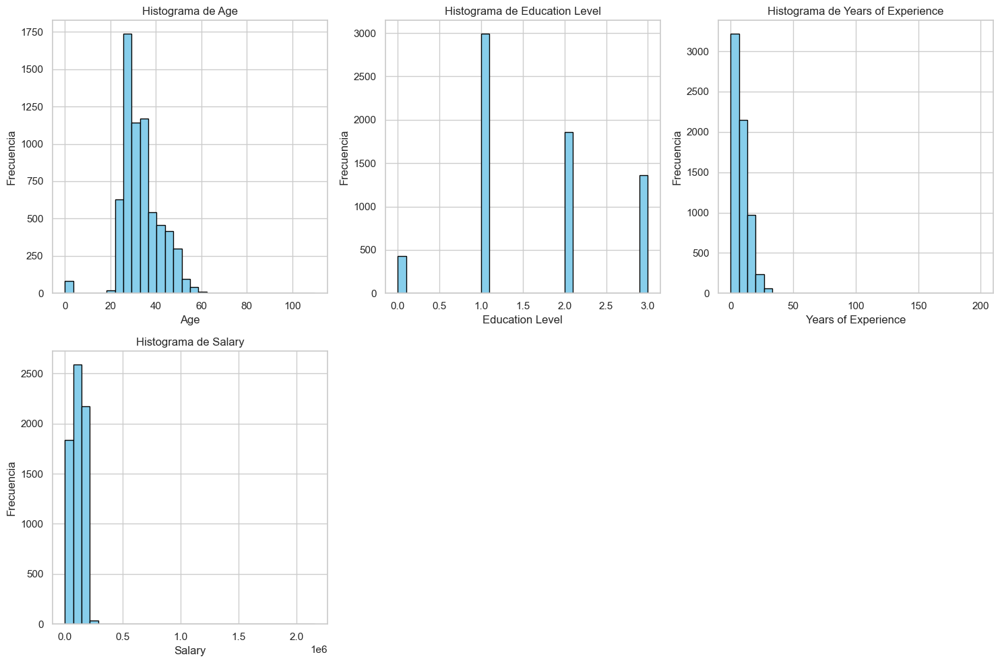

In [287]:
# Imputación o transformación de valores atípicos
numeric_columns = data_salary.select_dtypes(include = [np.number]).columns
num_vars = len(numeric_columns)
fig, axes = plt.subplots(nrows=(num_vars // 3) + 1, ncols=3, figsize=(15, 5 * ((num_vars // 3) + 1)))
axes = axes.flatten()

for i, col in enumerate(numeric_columns):
    axes[i].hist(data_salary[col], bins=30, color='skyblue', edgecolor='black')
    axes[i].set_title(f'Histograma de {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frecuencia')

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])
    
plt.tight_layout()
plt.show()

In [288]:
#Buscando que datos existen y las cantidades de los mismos

data_salary['Education Level'].value_counts()

Education Level
1.0    2995
2.0    1856
3.0    1361
0.0     432
Name: count, dtype: int64

In [289]:
#Nadie menor a 18 puede tener previa experiencia

under_18 = data_salary['Age'] < 18

data_salary[under_18]

,Age,Gender,Education Level,Job Title,Years of Experience,Salary
31,0,Female,1.0,Accountant,4.0,55000
243,0,Female,1.0,Marketing Analyst,6.0,70000
311,0,Male,1.0,Business Analyst,0.0,1437376
377,0,Male,3.0,Data Scientist,5.0,180000
422,0,Female,1.0,Data Analyst,132.0,0
...,...,...,...,...,...,...
6337,0,Female,2.0,Content Marketing Manager,15.0,150000
6343,0,Female,0.0,Sales Associate,174.0,0
6399,0,Female,0.0,Sales Executive,0.0,2159320
6437,0,Female,2.0,Sales Representative,0.0,40000


In [290]:
data_salary['Age'].value_counts()

Age
27     505
30     440
29     429
28     422
33     393
26     383
31     357
32     343
34     302
25     276
36     275
24     235
35     199
42     174
43     158
39     156
37     150
38     144
45     144
41     126
44     124
23     102
46     100
48      98
40      92
50      87
49      86
0       81
54      63
47      47
51      29
52      28
21      17
55      16
22      15
56      11
57       9
58       7
62       5
60       5
53       4
61       2
5        1
8        1
110      1
95       1
3        1
Name: count, dtype: int64

In [291]:
#La maxima Edad es 110 tomando en cuenta que empiezan a trabajar a los 18 lo maximo de experiencia es 92 años
#algo arriba de esto es atipico.

above_92 = data_salary['Years of Experience'] > 92

data_salary[above_92]

,Age,Gender,Education Level,Job Title,Years of Experience,Salary
422,0,Female,1.0,Data Analyst,132.0,0
3388,0,Female,2.0,Director of HR,164.0,0
3402,0,Male,2.0,HR Generalist,200.0,0
6343,0,Female,0.0,Sales Associate,174.0,0


In [292]:
#No puede haber mayores años de experiencia que edad

above_age = data_salary['Years of Experience'] > data_salary['Age']

data_salary[above_age]

,Age,Gender,Education Level,Job Title,Years of Experience,Salary
31,0,Female,1.0,Accountant,4.0,55000
243,0,Female,1.0,Marketing Analyst,6.0,70000
377,0,Male,3.0,Data Scientist,5.0,180000
422,0,Female,1.0,Data Analyst,132.0,0
784,0,Female,1.0,Data Analyst,2.0,110000
...,...,...,...,...,...,...
5713,0,Male,1.0,Product Designer,2.0,55000
5718,0,Female,3.0,Research Scientist,12.0,170000
5965,0,Male,1.0,Product Manager,1.0,60000
6337,0,Female,2.0,Content Marketing Manager,15.0,150000


In [293]:
low = data_salary['Salary'] < 25000

data_salary[low]

,Age,Gender,Education Level,Job Title,Years of Experience,Salary
258,29,Male,1.0,Business Operations Analyst,1.5,350
422,0,Female,1.0,Data Analyst,132.0,0
951,33,Male,1.0,Data Analyst,7.0,0
1888,25,Female,1.0,Front end Developer,1.0,550
1903,42,Male,2.0,Software Engineer Manager,13.0,0
2295,0,Female,1.0,Software Engineer,63.0,0
2402,95,Male,3.0,Software Engineer Manager,0.0,0
2640,23,Male,3.0,Software Engineer Manager,1.0,579
2692,42,Male,2.0,Product Manager,14.0,0
2772,0,Male,2.0,Software Engineer,84.0,0


In [294]:
high = data_salary['Salary'] > 250000

data_salary[high]

,Age,Gender,Education Level,Job Title,Years of Experience,Salary
311,0,Male,1.0,Business Analyst,0.0,1437376
2170,0,Male,2.0,Back end Developer,0.0,1229795
2488,0,Female,1.0,Front end Developer,0.0,1105681
2498,0,Female,0.0,Project Engineer,0.0,1147100
2887,0,Male,2.0,Full Stack Engineer,0.0,768434
5840,0,Female,1.0,Marketing Analyst,0.0,805612
6034,0,Male,1.0,Software Engineer,0.0,1320000
6399,0,Female,0.0,Sales Executive,0.0,2159320


In [295]:
media_salarios = data_salary.groupby('Job Title')['Salary'].mean().round()

In [296]:
for index, row in data_salary.iterrows():
    if row['Salary'] < 25000:
        data_salary.at[index, 'Salary'] = media_salarios[row['Job Title']]

In [297]:
data_salary[low]

,Age,Gender,Education Level,Job Title,Years of Experience,Salary
258,29,Male,1.0,Business Operations Analyst,1.5,17675
422,0,Female,1.0,Data Analyst,132.0,119930
951,33,Male,1.0,Data Analyst,7.0,119930
1888,25,Female,1.0,Front end Developer,1.0,88608
1903,42,Male,2.0,Software Engineer Manager,13.0,171567
2295,0,Female,1.0,Software Engineer,63.0,122037
2402,95,Male,3.0,Software Engineer Manager,0.0,171567
2640,23,Male,3.0,Software Engineer Manager,1.0,171567
2692,42,Male,2.0,Product Manager,14.0,140922
2772,0,Male,2.0,Software Engineer,84.0,122037


In [298]:
data_salary.drop(data_salary[data_salary['Age'] < 18].index, inplace = True)

In [299]:
data_salary.drop(data_salary[data_salary['Age'] > 61].index, inplace = True)

In [300]:
data_salary.describe()

,Age,Education Level,Years of Experience,Salary
count,6553.000000,6553.000000,6553.000000,6553.000000
mean,33.606135,1.623226,8.067374,115452.381047
std,7.563169,0.879729,6.037587,52757.177075
min,21.000000,0.000000,0.000000,17675.000000
25%,28.000000,1.000000,3.000000,70000.000000
50%,32.000000,1.000000,7.000000,115000.000000
75%,38.000000,2.000000,12.000000,160000.000000
max,61.000000,3.000000,34.000000,250000.000000


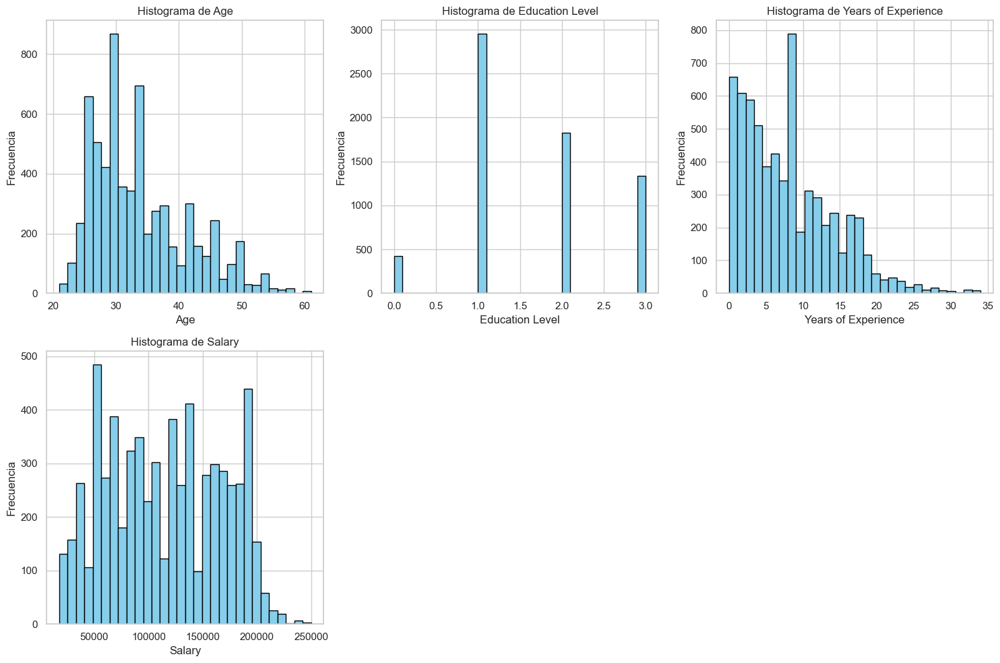

In [301]:
fig, axes = plt.subplots(nrows=(num_vars // 3) + 1, ncols=3, figsize=(15, 5 * ((num_vars // 3) + 1)))
axes = axes.flatten()

for i, col in enumerate(numeric_columns):
    axes[i].hist(data_salary[col], bins=30, color='skyblue', edgecolor='black')
    axes[i].set_title(f'Histograma de {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frecuencia')

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])
    
plt.tight_layout()
plt.show()

### Pregunta 5 ###
¿cómo han sido tratados los valores átipicos de la variable ***Salary*** y por qué se ha tomado esta decisión?

***Respuesta:***

Salary tiene valores átipicos con salarios muy altos y salarios muy bajos. Analizando la data los salarios altos se encuentran con que sus filas tienen otros 2 datos con valores átipicos por lo que estas filas serian eliminadas por estas 3 razones de valores atipicos donde no existe suficiente correlacion para imputar la data. Para los salarios bajos se utilizo la media con respecto a sus titulos de trabajo ya que estos tienen alta correlación con salario

A continuación en los siguientes bloques de código, se han de llevar a cabo ciertas transformaciones que conviene realizar sobre los datos para dejarlos depurados y preparados para la fase de modelado. En este sentido, transformaciones de variables númericas para buscar mayor relación con la variable objetivo, recategorización de variables categóricas, estandarización, homogeneización de formatos y unidades, etc.

In [306]:
data_salary['Job Title'].value_counts()

Job Title
Software Engineer                 796
Data Scientist                    507
Data Analyst                      384
Software Engineer Manager         362
Product Manager                   317
                                 ... 
Customer Support Specialist         1
VP of Finance                       1
Director of Product Management      1
CEO                                 1
Human Resources Director            1
Name: count, Length: 129, dtype: int64

In [307]:
# Recategorizacion Job Title

cuenta_trabajo = data_salary['Job Title'].value_counts()
filtro_trabajo = cuenta_trabajo.loc[cuenta_trabajo < 5]

print(filtro_trabajo)

Job Title
Accountant                        4
Data Engineer                     4
Account Manager                   4
Juniour HR Coordinator            3
Juniour HR Generalist             3
                                 ..
Customer Support Specialist       1
VP of Finance                     1
Director of Product Management    1
CEO                               1
Human Resources Director          1
Name: count, Length: 74, dtype: int64


In [308]:
salary_limpio = data_salary.copy()

In [309]:
salary_limpio['Job Title'] = salary_limpio['Job Title'].apply(lambda x: x if cuenta_trabajo[x] > 60 else 'Otros')

salary_limpio['Job Title'].value_counts()

Job Title
Software Engineer            796
Otros                        704
Data Scientist               507
Data Analyst                 384
Software Engineer Manager    362
Product Manager              317
Project Engineer             312
Marketing Manager            310
Full Stack Engineer          294
Front end Developer          236
Back end Developer           234
Sales Associate              209
Software Developer           184
Marketing Coordinator        162
Human Resources Manager      152
Marketing Analyst            139
Financial Manager            138
Web Developer                127
Operations Manager           119
Research Scientist           118
HR Generalist                 97
Director of Marketing         87
Sales Representative          79
Product Designer              78
Research Director             75
Content Marketing Manager     71
Product Marketing Manager     70
Director of HR                66
Marketing Director            64
Sales Director                62


200000.0


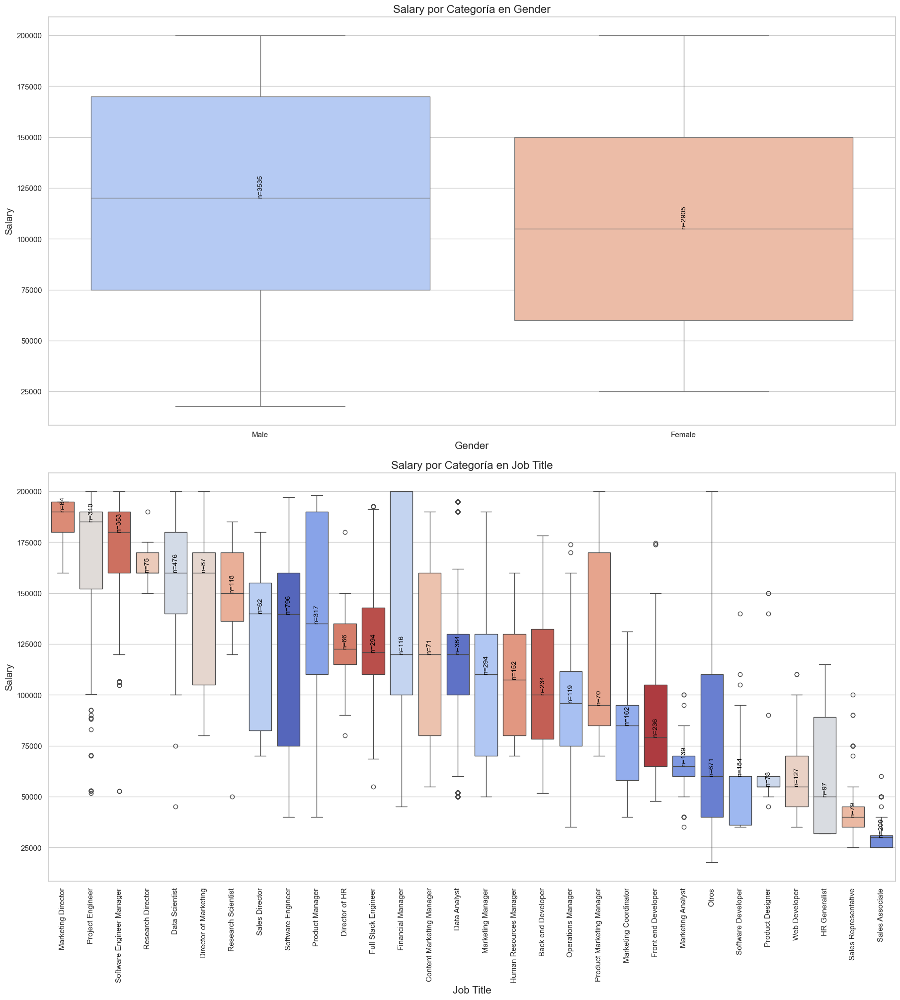

In [310]:
target_var = 'Salary'
percentil = 98
categoric_columns = salary_limpio.select_dtypes(include=['object', 'category']).columns
percent = np.percentile(salary_limpio[target_var].dropna(), percentil)
print(percent)

filtered_data = salary_limpio[salary_limpio[target_var] <= percent]

n_cats = len(categoric_columns)
fig, axes = plt.subplots(n_cats, 1, figsize=(18, 10 * n_cats), constrained_layout=True)

for ax, cat in zip(axes, categoric_columns):
    
    medians = filtered_data.groupby(cat)[target_var].median().sort_values(ascending=False)
    ordered_categories = medians.index
    
    sns.boxplot(x=cat, y=target_var, hue=cat, data=filtered_data, order=ordered_categories, palette='coolwarm', legend=False, ax=ax)
    ax.set_title(f'{target_var} por Categoría en {cat}', fontsize=16)
    ax.set_xlabel(cat, fontsize=15)
    ax.set_ylabel(target_var, fontsize=14)
    
    for i, category in enumerate(ordered_categories):
        
        category_data = filtered_data[filtered_data[cat] == category][target_var]
        num_records = len(category_data)
        
        median_value = category_data.median()

        if np.isfinite(median_value):
            
            ax.text(
                i, median_value,  
                f'n={num_records}', 
                ha='center', va='bottom', fontsize=10, color='black', rotation=90  
            )
    
    num_categories = filtered_data[cat].nunique()
    if num_categories > 10:
        ax.tick_params(axis='x', labelrotation=90)
    else:
        ax.tick_params(axis='x', labelrotation=0) 

plt.show()

In [311]:
# Estandarización todo a float
numerical_cols = salary_limpio.select_dtypes(include=['number']).columns
scaler = StandardScaler()

salary_limpio[numerical_cols] = scaler.fit_transform(salary_limpio[numerical_cols])

In [312]:
# Tipos de valores... .info
salary_limpio.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6553 entries, 0 to 6683
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Age                  6553 non-null   float64
 1   Gender               6553 non-null   object 
 2   Education Level      6553 non-null   float64
 3   Job Title            6553 non-null   object 
 4   Years of Experience  6553 non-null   float64
 5   Salary               6553 non-null   float64
dtypes: float64(4), object(2)
memory usage: 358.4+ KB


In [313]:
# Codificación de Genero y Job Title
categorical_cols = salary_limpio.select_dtypes(include=['object', 'category']).columns
salary_limpio = pd.get_dummies(salary_limpio, columns=categorical_cols, drop_first=True)

In [314]:
salary_limpio.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6553 entries, 0 to 6683
Data columns (total 34 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Age                                  6553 non-null   float64
 1   Education Level                      6553 non-null   float64
 2   Years of Experience                  6553 non-null   float64
 3   Salary                               6553 non-null   float64
 4   Gender_Male                          6553 non-null   bool   
 5   Job Title_Content Marketing Manager  6553 non-null   bool   
 6   Job Title_Data Analyst               6553 non-null   bool   
 7   Job Title_Data Scientist             6553 non-null   bool   
 8   Job Title_Director of HR             6553 non-null   bool   
 9   Job Title_Director of Marketing      6553 non-null   bool   
 10  Job Title_Financial Manager          6553 non-null   bool   
 11  Job Title_Front end Developer      

### Pregunta 6 ###
En caso de que se haya llevado a cabo algún tratamiento sobre las variables categóricas, ¿qué acciones se han tomado y sobre qué variables? En el caso de la variable ***Education Level***, ¿Se ha llevado a cabo sobre ella alguna transformación o se ha dejado tal cual?¿Por qué?

***Respuesta:***

Se decidio recategorizar los datos de Job Title que aparezcan menos de 80 veces. Se estandarizaron todas las columnas a float.64 y se codificaron Genero y Job Title con One Hot Encoding. Education Level se ha dejado como esta debido a que es un dato ordinal que ya recibio un Label Encoding.

Procedemos ahora con el primer modelo que vamos a definir con este conjunto de datos. Se trata de un modelo de regresión lineal que tratará de predecir los valores de la variable ***Salary*** en función de las demás variables.

Hasta aquí se habrán realizado diversas transformaciones y preparaciones de los datos comunes para todos los ejercicios de esta práctica. En los siguientes bloques, añadir transformaciones específicas para este modelo de regresión lineal.

In [320]:
# Transformaciones varias para adaptar al modelo de regresión lineal

booleano = salary_limpio.select_dtypes(include='bool').columns
salary_limpio[booleano] = salary_limpio[booleano].astype(int)

salary_limpio = salary_limpio.apply(pd.to_numeric, errors='coerce')

In [321]:
salary_limpio

,Age,Education Level,Years of Experience,Salary,Gender_Male,Job Title_Content Marketing Manager,Job Title_Data Analyst,Job Title_Data Scientist,Job Title_Director of HR,Job Title_Director of Marketing,Job Title_Financial Manager,Job Title_Front end Developer,Job Title_Full Stack Engineer,Job Title_HR Generalist,Job Title_Human Resources Manager,Job Title_Marketing Analyst,Job Title_Marketing Coordinator,Job Title_Marketing Director,Job Title_Marketing Manager,Job Title_Operations Manager,Job Title_Otros,Job Title_Product Designer,Job Title_Product Manager,Job Title_Product Marketing Manager,Job Title_Project Engineer,Job Title_Research Director,Job Title_Research Scientist,Job Title_Sales Associate,Job Title_Sales Director,Job Title_Sales Representative,Job Title_Software Developer,Job Title_Software Engineer,Job Title_Software Engineer Manager,Job Title_Web Developer
0,-0.212379,-0.708484,-0.508085,-0.482481,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,-0.741298,0.428317,-0.839368,-0.956386,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1.506608,1.565117,1.148332,0.654892,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0.316540,-0.708484,-0.176802,-1.051167,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,2.432217,0.428317,1.976541,1.602703,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6679,2.035528,1.565117,1.976541,1.602703,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6680,-0.212379,-1.845284,-0.839368,-1.240729,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
6681,-0.476838,-0.708484,-0.673727,-1.145948,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6682,1.638838,0.428317,0.982690,0.465330,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


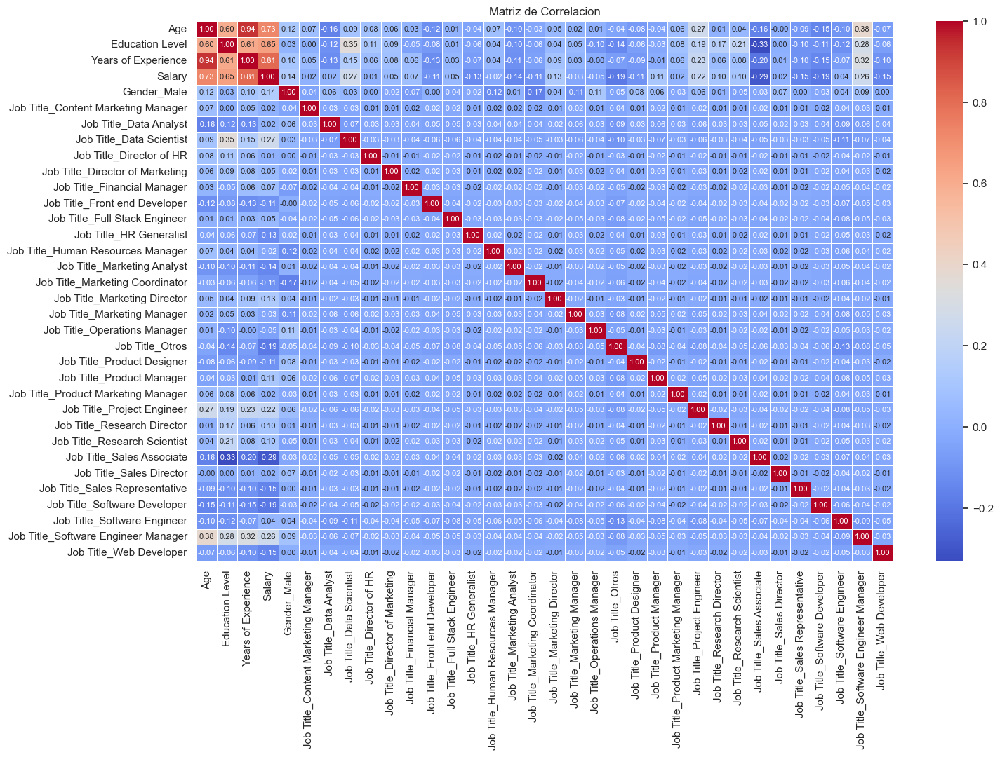

In [322]:
filtro_2 = salary_limpio
correlacion_3 = filtro_2.corr()
plt.figure(figsize=(16, 10))
sns.heatmap(correlacion_3, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, annot_kws={"size": 8})
plt.title("Matriz de Correlacion")
plt.show()

Ahora procedemos a realizar la separación del conjunto de datos en 2 conjuntos: uno con las variables predictoras y otro con la variable objetivo. También separamos en conjuntos de entrenamiento y test para poder llevar a cabo el entrenamiento del modelo y la validación en conjuntos distintos. Escoged el porcentaje de datos para entrenamiento que se considere adecuado. Por último, entrenar un modelo de regresión lineal mostrando un resumen de los parametros, coeficientes y demás información útil para valorar la bondad del modelo entrenado.

In [324]:
# Definir la variable objetivo (y) y las predictoras (X)
X = salary_limpio.drop('Salary', axis=1)
y = salary_limpio['Salary']

In [325]:
# Dividir los datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [326]:
# Crear y ajustar el modelo
X_train = sm.add_constant(X_train)

model = sm.OLS(y_train, X_train).fit(cov_type ='HC3')

coef = model.params

In [327]:
# Mostrar el resumen detallado del modelo
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                 Salary   R-squared:                       0.805
Model:                            OLS   Adj. R-squared:                  0.804
Method:                 Least Squares   F-statistic:                     2905.
Date:                Tue, 25 Feb 2025   Prob (F-statistic):               0.00
Time:                        22:06:49   Log-Likelihood:                -3162.4
No. Observations:                5242   AIC:                             6393.
Df Residuals:                    5208   BIC:                             6616.
Df Model:                          33                                         
Covariance Type:                  HC3                                         
                                          coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

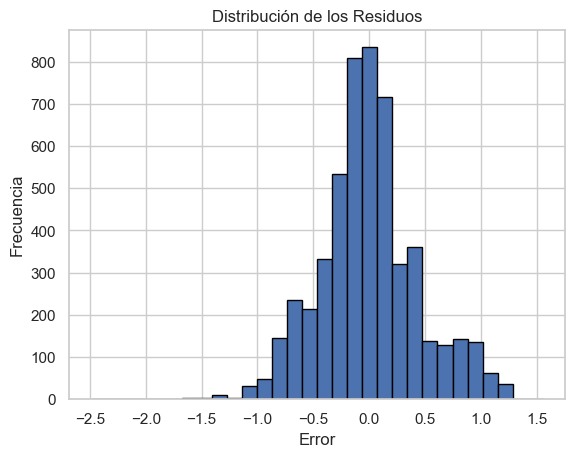

In [328]:
plt.hist(model.resid, bins=30, edgecolor='black')
plt.title("Distribución de los Residuos")
plt.xlabel("Error")
plt.ylabel("Frecuencia")
plt.show()

In [329]:
stat, p_value = shapiro(model.resid)
print("Shapiro-Wilk Test:")
print("Statistic:", stat)
print("P-value:", p_value)

Shapiro-Wilk Test:
Statistic: 0.9852385520935059
P-value: 5.434034266823834e-23


C:\Users\swart\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


In [330]:
y_train_pred = model.predict(X_train)

mse_train = mean_squared_error(y_train, y_train_pred)

print(mse_train)

0.19567165992858734


In [331]:
X_test = sm.add_constant(X_test)

y_test_pred = model.predict(X_test)

mse = mean_squared_error(y_test, y_test_pred)
r2 = r2_score(y_test, y_test_pred)

print(f"Error Cuadrático Medio (MSE): {mse}")
print(f"Coeficiente de Determinación (R²): {r2}")

Error Cuadrático Medio (MSE): 0.1945029361702565
Coeficiente de Determinación (R²): 0.8003688859119326


In [332]:
variables = salary_limpio.copy()
variables = sm.add_constant(X)

vif_data = pd.DataFrame()
vif_data["Variable"] = variables.columns
vif_data["VIF"] = [variance_inflation_factor(variables.values, i) for i in range(len(variables.columns))]
print(vif_data)

                               Variable        VIF
0                                 const  31.007077
1                                   Age  10.780698
2                       Education Level   2.746188
3                   Years of Experience  10.129355
4                           Gender_Male   1.167078
5   Job Title_Content Marketing Manager   1.318955
6                Job Title_Data Analyst   2.497391
7              Job Title_Data Scientist   3.351007
8              Job Title_Director of HR   1.326366
9       Job Title_Director of Marketing   1.405751
10          Job Title_Financial Manager   1.603511
11        Job Title_Front end Developer   1.945705
12        Job Title_Full Stack Engineer   2.197331
13              Job Title_HR Generalist   1.410387
14    Job Title_Human Resources Manager   1.692788
15          Job Title_Marketing Analyst   1.570832
16      Job Title_Marketing Coordinator   1.718464
17         Job Title_Marketing Director   1.301695
18          Job Title_Marketing

### Pregunta 7 ###
A la vista de los resultados del modelo, ¿Presenta sesgo el modelo? ¿Se cumplen las condiciones/supuestos que deben cumplirse en una regresión lineal para que el modelo sea estadisticamente válido? Detalla la respuesta haciendo interpretacion de los resultados obtenidos.

***Respuesta:***

El R^2 explica el 80.5% de la variabilidad, por lo que el modelo captura una buena relación entre las variables y el salario, pero existe todavia 19.5% que no explica.

La prueba de Omnibus nos indica que los residuos no son perfectamente normales ya que tiene p=0.000. Debido a esto podría haber errores sistemáticos que reflejan sesgo en las predicciones.

Skew es 0.229 por lo que se encuentra cercano a 0 y se clasifica como asímetria.

Kurtosis esta en 3.578, como se encuentra cerca de 3 es una distribución casi normal, esto es apoyado por prueba de Omnibus y el histograma con la distribución de residuos que tiene unas colas ligeramente largas.

Gracias al test de Shapiro-Wilk podemos concluir que los residuos no son perfectamente normales.

Muchas variables tienen p-valores < 0.05 lo que indica que son significativar, las siguientes variables son las únicas que son insignificativas:
    -Age
    -Job Title_Sales Director 
    -Job Title_Director of Marketing
    -Job Title_Software Engineer Manager

Parece haber multicolinealidad debido a que su Cond. No. es de 48.7, superando 30 por lo que podria haber variables demasiado correlacionadas y el modelo podria tener un posible sesgo.

El modelo no presenta un sesgo extremo pero hay una no normalidad leve en los residuos y existe varias multicolinealidades que pueden generar problema con la interpretación de los coeficientes.

El F-statistic tiene un p < 0.05 por lo que el modelo es globalmente significativo, en otras palabras que al menos una variable influye en el salario.

El VIF nos muestra que const esta extremadamente alto por lo que o existe un sobreajuste o existen problemas con la constante. Age y Years of Experience estan fuertemente correlacionadas, para solucionar el problema se debe eliminar una de las variables o hacer una transformación.

El modelo es estadisticamente válido, pero la multicolinealidad puede afectar la precisión y la normalidad de los residuos no es perfecta.

Adicionalmente utilizando MSE con la data que no se entreno el modelo podemos ver que la prediccion tiene un porcentaje similar de error que  el MSE entrenado con los datos.

A continuación, se ha de aplicar validación cruzada sobre los datos para el modelo de regresión lineal. Con esto veremos la generalización del modelo a datos no conocidos. Generar los bloques de código necesarios para llevar a cabo esta validación. La validación ha de ser en base a 2 métricas de vuestra elección sobre conjuntos de test y han de mostrarse los resultados en diagramas de tipo de boxplot o que permitan entender cómo generaliza el modelo.

In [337]:
# Aplicación de validación cruzada

# Definir un envoltorio para el modelo de statsmodels
class StatsmodelsOLS(BaseEstimator, RegressorMixin):
    def __init__(self):
        self.model = None

    def fit(self, X, y):
        
        X = sm.add_constant(X)
        self.model = sm.OLS(y, X).fit()
        return self

    def predict(self, X):
        
        X = sm.add_constant(X)
        return self.model.predict(X)


modelo_cruzado = StatsmodelsOLS()

In [338]:
folds = KFold(n_splits = 10, shuffle = True, random_state = 420)

scores_r2 = cross_val_score(modelo_cruzado, X, y, cv=folds, scoring='r2')


print("R^2 promedio:", scores_r2.mean())
print("R^2 std:", scores_r2.std())
print("R^2 por fold:", scores_r2)

R^2 promedio: 0.8028176225418479
R^2 std: 0.014930610671246944
R^2 por fold: [0.82231237 0.77591184 0.78870083 0.80729593 0.79053585 0.80382686
 0.82408361 0.79443963 0.81803555 0.80303375]


In [339]:
scores_mse = cross_val_score(modelo_cruzado, X, y, cv=folds, scoring=make_scorer(mean_squared_error, greater_is_better=False))

# Estadisticas de los mse
print("mse promedio:", scores_mse.mean())
print("mse std:", scores_mse.std())
print("mse por fold:", scores_mse)

mse promedio: -0.19653990462678805
mse std: 0.013770359719357661
mse por fold: [-0.18490913 -0.21980093 -0.21052887 -0.18686267 -0.21884894 -0.18852506
 -0.18316698 -0.19377295 -0.1830589  -0.19592461]


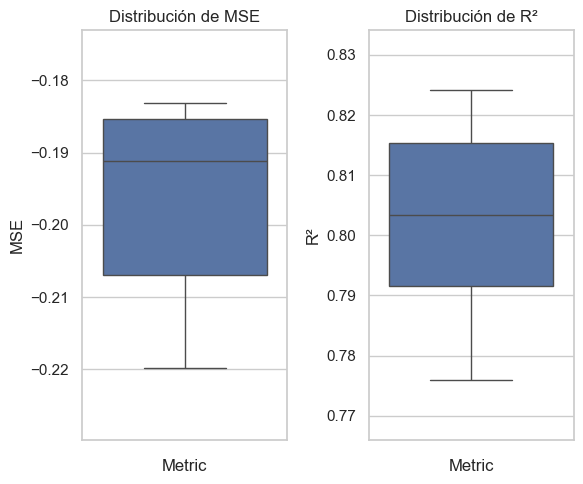

In [340]:
# Apoyo gráfico para interpretar la validación
grafico_validacion = pd.DataFrame({
    "Fold": np.arange(1, folds.get_n_splits()+1),
    "MSE": scores_mse,
    "R²": scores_r2,
    "Modelo": "Original"
})

# Boxplots para las métricas
plt.figure(figsize=(6, 5))

# MSE
plt.subplot(1, 2, 1)
sns.boxplot(data=grafico_validacion, y="MSE")
plt.title("Distribución de MSE")
plt.ylabel("MSE")
plt.xlabel("Metric")
plt.ylim(min(scores_mse)-0.01, max(scores_mse)+0.01)

# R²
plt.subplot(1, 2, 2)
sns.boxplot(data=grafico_validacion, y="R²")
plt.title("Distribución de R²")
plt.ylabel("R²")
plt.xlabel("Metric")
plt.ylim(min(scores_r2)-0.01, max(scores_r2)+0.01)

plt.tight_layout()
plt.show()

### Pregunta 8 ###
A la vista de los resultados de validación, ¿Existen problemas de varianza en los modelos entrenados?¿Por qué? 

***Respuesta:***

Ambos modelos presentan outliers negativos y como están su dispersión significa que hay cierta varianza y que no tiene un buen desempeño en todos los conjuntos de datos podría deberse a un sobre ajuste o un modelo demasiado complejo. 
El razonamiento detrás de esta conclusión empieza con MSE ya que no debería ser negativo, y tiene una moderada dispersión, por lo que se puede concluir que tiene alta variabilidad y el modelo no predice de forma estable además de ser sensible a los datos de entrenamiento.
En cambio R^2 tiene una iteración donde el modelo es peor que utilizar la media. Debido a esta iteración el modelo tiene una alta varianza con ciertos subconjuntos de datos.

Como siguiente paso, vamos a aplicar selección de variables a nuestro conjunto de datos para ver si somos capaces de encontrar un modelo que, a través de un conjunto menor de variables, sea capaz de predecir muy parecido o mejor incluso que el modelo de regresión lineal que acabamos de obtener en primera instancia.

Para ello vamos a proceder de dos formas. La primera consiste en llevar a cabo un metodo automatico de selección de variables hacía adelante (Forward). En los siguientes bloques de código, se ha de programar las instrucciones necesarias para llevar a cabo esta selección de variables. Se valorará mostrar el gráfico secuencial que muestra el perfomance de cada iteración. 

In [345]:
# Selección Forward de variables
modelo = LinearRegression()

# Selección hacia adelante
sfs = SFS(modelo,
          k_features='best',  # Número de características a seleccionar ('best' selecciona automáticamente)
          forward=True,
          floating=False,
          scoring='r2',       # Métrica de evaluación: neg_log_loss, accuracy
          cv=5)               # Validación cruzada

sfs.fit(X_train, y_train)

# Resultados
print(f'Mejor {r2} obtenido:', sfs.k_score_)
print('Número de variables seleccionadas: ', len(sfs.k_feature_names_))
print(f"Variables seleccionadas: {sfs.k_feature_names_}")

# Variables seleccionadas
features_seleccionadas = list(sfs.k_feature_names_)

Mejor 0.8003688859119326 obtenido: 0.8032360581095708
Número de variables seleccionadas:  31
Variables seleccionadas: ('Education Level', 'Years of Experience', 'Gender_Male', 'Job Title_Content Marketing Manager', 'Job Title_Data Analyst', 'Job Title_Data Scientist', 'Job Title_Director of HR', 'Job Title_Director of Marketing', 'Job Title_Financial Manager', 'Job Title_Front end Developer', 'Job Title_Full Stack Engineer', 'Job Title_HR Generalist', 'Job Title_Human Resources Manager', 'Job Title_Marketing Analyst', 'Job Title_Marketing Coordinator', 'Job Title_Marketing Director', 'Job Title_Marketing Manager', 'Job Title_Operations Manager', 'Job Title_Otros', 'Job Title_Product Designer', 'Job Title_Product Manager', 'Job Title_Product Marketing Manager', 'Job Title_Project Engineer', 'Job Title_Research Director', 'Job Title_Research Scientist', 'Job Title_Sales Associate', 'Job Title_Sales Representative', 'Job Title_Software Developer', 'Job Title_Software Engineer', 'Job Title

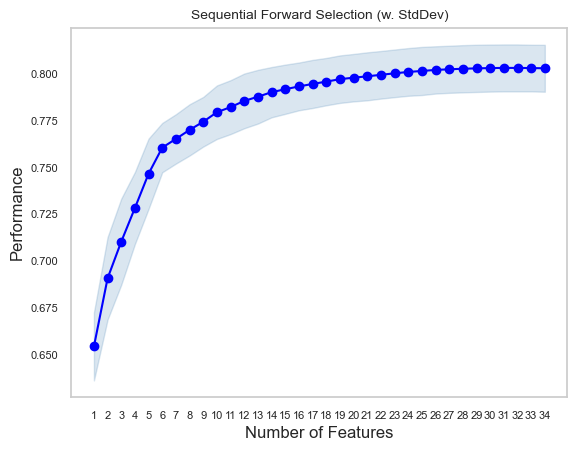

In [346]:
# Gráfico de perfomance de la selección en cada iteración.
fig1 = plot_sfs(sfs.get_metric_dict(), kind='std_dev')

#plt.ylim([0.8, 1])
plt.title('Sequential Forward Selection (w. StdDev)', fontsize=10)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.grid()
plt.show()

### Pregunta 9 ###
¿Cuál es el número de variables seleccionadas por el método aplicado? ¿cuál es el valor de la métrica escogida para la selección de las variables, en la iteración correspondiente al número de variables seleccionadas?

***Respuesta:***

El modelo aplica 31 variables de las 33 usadas. El valor de la métrica utilizada para la selección de variables (R²) en la iteración final es 0.8003

Una vez realizada la selección de variables, se ha de entrenar un modelo de regresión lineal con dichas variables y mostrar el resumen del modelo entrenado. Una vez entrenado, aplicar validación cruzada para evaluar el modelo en todo el conjunto de datos para validar la generalización del modelo. De nuevo, la validación ha de ser en base a las 2 métricas escogidas en puntos anteriores, sobre conjuntos de test y han de mostrarse los resultados en diagramas de tipo de boxplot o que permitan entender cómo generaliza el modelo.

In [351]:
# Ajustar modelo regresión lineal para variables seleccionadas
Xv2 = salary_limpio.drop('Salary', axis=1)
yv2 = salary_limpio['Salary']

columns_to_keep = [col for col in Xv2.columns if col in features_seleccionadas]

Xv2 = Xv2[columns_to_keep]

Xv2_train, Xv2_test, yv2_train, yv2_test = train_test_split(Xv2, yv2, test_size=0.2, random_state=42)

Xv2_train = sm.add_constant(Xv2_train)

model2 = sm.OLS(yv2_train, Xv2_train).fit(cov_type ='HC3')

coef2 = model2.params

In [352]:
# Mostrar principales atributos, coeficientes, etc. del modelo entrenado
print(model2.summary())

yv2_train_pred = model2.predict(Xv2_train)

mse_train2 = mean_squared_error(yv2_train, yv2_train_pred)

print(f"mse: {mse_train2}")

                            OLS Regression Results                            
Dep. Variable:                 Salary   R-squared:                       0.805
Model:                            OLS   Adj. R-squared:                  0.804
Method:                 Least Squares   F-statistic:                     3016.
Date:                Tue, 25 Feb 2025   Prob (F-statistic):               0.00
Time:                        22:06:58   Log-Likelihood:                -3162.7
No. Observations:                5242   AIC:                             6389.
Df Residuals:                    5210   BIC:                             6599.
Df Model:                          31                                         
Covariance Type:                  HC3                                         
                                          coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

In [353]:

# Aplicar validación cruzada

scores_r2v2 = cross_val_score(modelo, Xv2, yv2, cv=folds, scoring='r2')

print("R^2 promedio:", scores_r2v2.mean())
print("R^2 std:", scores_r2v2.std())
print("R^2 por fold:", scores_r2v2)

R^2 promedio: 0.8029203893671873
R^2 std: 0.01489325704025352
R^2 por fold: [0.82237404 0.77605012 0.78855333 0.80722454 0.7907093  0.80438545
 0.8240279  0.79467732 0.81801657 0.80318535]


In [354]:
scores_msev2 = cross_val_score(modelo, Xv2, yv2, cv=folds, scoring=make_scorer(mean_squared_error, greater_is_better=False))

# Estadisticas de los mse
print("mse promedio:", scores_msev2.mean())
print("mse std:", scores_msev2.std())
print("mse por fold:", scores_msev2)

mse promedio: -0.19643996638461494
mse std: 0.013763747685126013
mse por fold: [-0.18484497 -0.2196653  -0.21067583 -0.1869319  -0.21866772 -0.18798825
 -0.18322499 -0.19354889 -0.183078   -0.19577382]


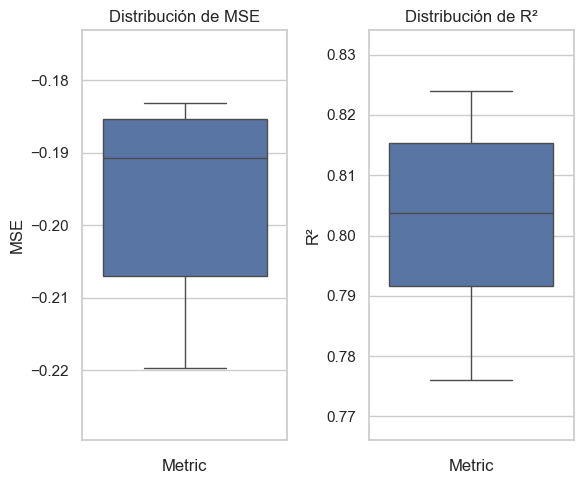

In [355]:
# Apoyo gráfico para interpretar la validación
grafico_validacion2 = pd.DataFrame({
    "Fold": np.arange(1, folds.get_n_splits()+1),
    "MSE": scores_msev2,
    "R²": scores_r2v2,
    "Modelo": "Original"
})

# Boxplots para las métricas
plt.figure(figsize=(6, 5))

# MSE
plt.subplot(1, 2, 1)
sns.boxplot(data=grafico_validacion2, y="MSE")
plt.title("Distribución de MSE")
plt.ylabel("MSE")
plt.xlabel("Metric")
plt.ylim(min(scores_msev2)-0.01, max(scores_msev2)+0.01)

# R²
plt.subplot(1, 2, 2)
sns.boxplot(data=grafico_validacion2, y="R²")
plt.title("Distribución de R²")
plt.ylabel("R²")
plt.xlabel("Metric")
plt.ylim(min(scores_r2v2)-0.01, max(scores_r2v2)+0.01)

plt.tight_layout()
plt.show()

### Pregunta 10 ###
En base a los resultados obtenidos, comparar con los resultados obtenidos para el modelo de regresión lineal y explicar las conclusiones sobre cuál de los 2 modelos parece aportar más beneficios para el objetivo del proyecto.

***Respuesta:***

El cambio entreo los 2 modelos es extremadamente mínimo pero el modelo obtenido por selección de variables es mejor. Principalmente por que el Cond.No se ha reducido presentando una menor multicolinealidad y reducción en AIC y BIC, por último existe una ligera reducción en el mse

Ahora se ha de entrenar un nuevo modelo de regresión lineal pero esta vez, en lugar de aplicar una selección de variables como se acaba de realizar, el alumno debe llevar a cabo un analisis de compoenentes principales que reduzca la dimensionalidad del conjunto original de datos. Y a partir de dichas componentes, entrenar y evaluar el modelo de regresión lineal.

En primer lugar, se han escribir los bloques de código que permiten realizar el analisis de componentes principales.

In [360]:
# Crear el analisis de PCA a partir del conjunto de variables predictoras
pca = PCA()
pca.fit(Xv2)

explained_var = pca.explained_variance_
explained_var_ratio = pca.explained_variance_ratio_
autovectores = pca.components_

resultados_pca = pd.DataFrame({
    'Componente':np.array(range(pca.n_components_)) + 1, 
    'Explained Variance':explained_var, 
    'Explained Variance Ratio':explained_var_ratio
})

# Agregar la columna con la suma acumulada del ratio
resultados_pca['Cumulative Explained Variance Ratio (%)'] = 100*resultados_pca['Explained Variance Ratio'].cumsum()
resultados_pca

,Componente,Explained Variance,Explained Variance Ratio,Cumulative Explained Variance Ratio (%)
0,1,1.636475,0.519947,51.994670
1,2,0.402021,0.127732,64.767839
2,3,0.245054,0.077859,72.553772
3,4,0.115404,0.036666,76.220420
4,5,0.091890,0.029196,79.139989
5,6,0.067150,0.021335,81.273511
6,7,0.055077,0.017499,83.023425
7,8,0.051186,0.016263,84.649731
8,9,0.047035,0.014944,86.144130
9,10,0.046251,0.014695,87.613626


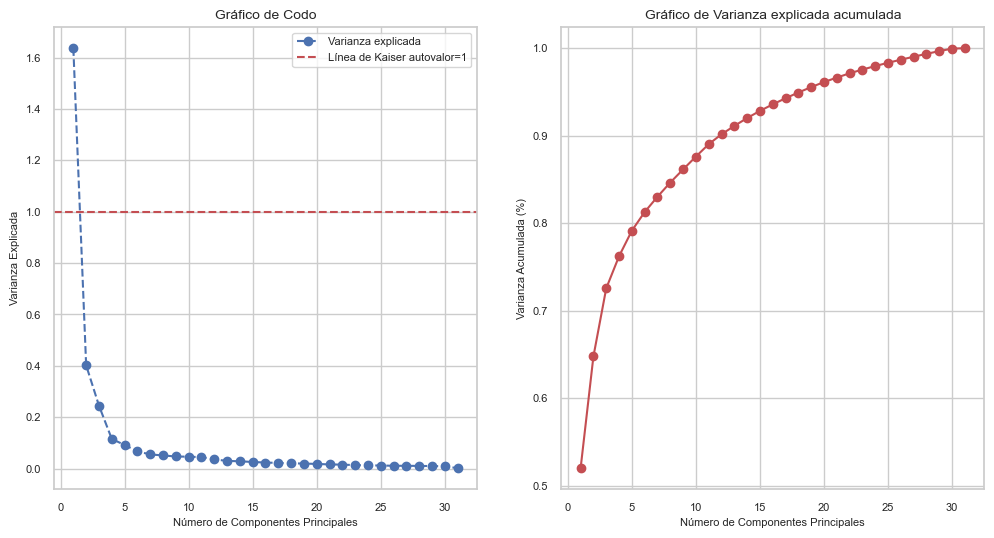

In [361]:
# Graficar la varianza explicada acumulada (scree-plot)

plt.figure(figsize=(12, 6))


plt.subplot(1, 2, 1)
plt.plot(range(1, len(explained_var) + 1), explained_var, marker='o', linestyle='--', color='b', label='Varianza explicada')
plt.axhline(y=1, color='r', linestyle='--', label='Línea de Kaiser autovalor=1')
plt.title('Gráfico de Codo', fontsize=10)
plt.xlabel('Número de Componentes Principales', fontsize=8)
plt.ylabel('Varianza Explicada', fontsize=8)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.legend(fontsize=8)


plt.subplot(1, 2, 2)
cumulative_var_ratio = np.cumsum(explained_var_ratio)
plt.plot(range(1, len(cumulative_var_ratio) + 1), cumulative_var_ratio, marker='o', linestyle='-', color='r', label='Varianza explicada acumulada')
plt.title('Gráfico de Varianza explicada acumulada', fontsize=10)
plt.xlabel('Número de Componentes Principales', fontsize=8)
plt.ylabel('Varianza Acumulada (%)', fontsize=8)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)


plt.grid(True)
plt.show()

### Pregunta 11 ###
Para un porcentaje de varianza explicada del 95%, ¿cuál es el número de componentes principales que consiguen explicar dicho porcentaje de varianza?

***Respuesta:***

Se necesitan 19 componentes para explicar una varianza del 95%

A continuación, con las nuevas componentes principales como variables predictoras y los datos proyectados sobre ellas, entrenar un modelo de regresión lineal y mostrar los resultados del entrenamiento. Una vez entrenado, aplicar validación cruzada para evaluar el modelo en todo el conjunto de datos validando así la generalización del modelo. De nuevo, la validación ha de ser en base a las 2 métricas escogidas en puntos anteriores, sobre conjuntos de test y han de mostrarse los resultados en diagramas de tipo de boxplot o que permitan entender cómo generaliza el modelo.

In [366]:
# Ajustar modelo regresión lineal para variables seleccionadas proyectadas
Xv3 = salary_limpio.drop('Salary', axis=1)
yv3 = salary_limpio['Salary']

n_components = (resultados_pca['Cumulative Explained Variance Ratio (%)'] < 96).sum()

columns_to_keepv2 = Xv3.columns[:n_components]

Xv3 = Xv3[columns_to_keepv2]

Xv3_train, Xv3_test, yv3_train, yv3_test = train_test_split(Xv3, yv3, test_size=0.2, random_state=42)

Xv3_train = sm.add_constant(Xv3_train)

model3 = sm.OLS(yv3_train, Xv3_train).fit(cov_type ='HC3')

coef3 = model3.params

In [367]:
# Mostrar principales atributos, coeficientes, etc. del modelo entrenado
print(model3.summary())

yv3_train_pred = model3.predict(Xv3_train)

mse_train3 = mean_squared_error(yv3_train, yv3_train_pred)

print(f"mse: {mse_train3}")

                            OLS Regression Results                            
Dep. Variable:                 Salary   R-squared:                       0.747
Model:                            OLS   Adj. R-squared:                  0.746
Method:                 Least Squares   F-statistic:                     1199.
Date:                Tue, 25 Feb 2025   Prob (F-statistic):               0.00
Time:                        22:06:59   Log-Likelihood:                -3847.1
No. Observations:                5242   AIC:                             7734.
Df Residuals:                    5222   BIC:                             7865.
Df Model:                          19                                         
Covariance Type:                  HC3                                         
                                          coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

In [368]:
# Aplicar validación cruzada

scores_r2v3 = cross_val_score(modelo_cruzado, Xv3, yv3, cv=folds, scoring='r2')

print("R^2 promedio:", scores_r2v3.mean())
print("R^2 std:", scores_r2v3.std())
print("R^2 por fold:", scores_r2v3)

R^2 promedio: 0.7432947405197664
R^2 std: 0.018462677260330723
R^2 por fold: [0.75286658 0.72314693 0.73384285 0.74752502 0.70673984 0.75573678
 0.77237854 0.7437548  0.76284882 0.73410724]


In [369]:
scores_msev3 = cross_val_score(modelo_cruzado, Xv3, yv3, cv=folds, scoring=make_scorer(mean_squared_error, greater_is_better=False))

# Estadisticas de los mse
print("mse promedio:", scores_msev3.mean())
print("mse std:", scores_msev3.std())
print("mse por fold:", scores_msev3)

mse promedio: -0.2561500557596384
mse std: 0.020951819767756612
mse por fold: [-0.25717731 -0.27155634 -0.26518687 -0.24482175 -0.30639932 -0.23474028
 -0.23700314 -0.24155137 -0.23857756 -0.26448661]


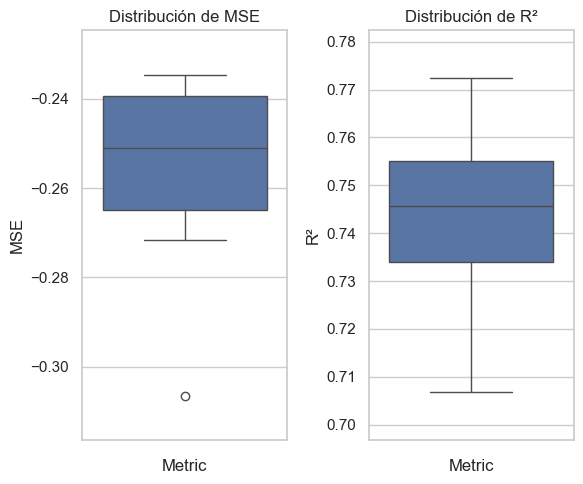

In [370]:
# Apoyo gráfico para interpretar la validación
grafico_validacion3 = pd.DataFrame({
    "Fold": np.arange(1, folds.get_n_splits()+1),
    "MSE": scores_msev3,
    "R²": scores_r2v3,
    "Modelo": "Original"
})

# Boxplots para las métricas
plt.figure(figsize=(6, 5))

# MSE
plt.subplot(1, 2, 1)
sns.boxplot(data=grafico_validacion3, y="MSE")
plt.title("Distribución de MSE")
plt.ylabel("MSE")
plt.xlabel("Metric")
plt.ylim(min(scores_msev3)-0.01, max(scores_msev3)+0.01)

# R²
plt.subplot(1, 2, 2)
sns.boxplot(data=grafico_validacion3, y="R²")
plt.title("Distribución de R²")
plt.ylabel("R²")
plt.xlabel("Metric")
plt.ylim(min(scores_r2v3)-0.01, max(scores_r2v3)+0.01)

plt.tight_layout()
plt.show()

In [371]:
print(model.summary())
print(model2.summary())
print(model3.summary())

                            OLS Regression Results                            
Dep. Variable:                 Salary   R-squared:                       0.805
Model:                            OLS   Adj. R-squared:                  0.804
Method:                 Least Squares   F-statistic:                     2905.
Date:                Tue, 25 Feb 2025   Prob (F-statistic):               0.00
Time:                        22:07:00   Log-Likelihood:                -3162.4
No. Observations:                5242   AIC:                             6393.
Df Residuals:                    5208   BIC:                             6616.
Df Model:                          33                                         
Covariance Type:                  HC3                                         
                                          coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

### Pregunta 12 ###
En vista de los resultados, comparar con los anteriores 2 modelos entrenados (el original de regresión lineal y aquel al que aplicamos selección de variables con método forward). ¿Qué modelo de entre los 3 tiene el atributo *Condition Number* más bajo y por qué? En general y a modo de conclusión, ¿Qué modelo de los 3 parece más apropiado para el caso de uso y por qué?

***Respuesta:***

El análisis de componentes principales tiene el Condition number más bajo con 17.2 esto se debe a que ya no existe tanta multicolinealidad.

El mejor es la selección de variables con modelo forward ya que tiene un mejor R^2 para explicar la variabilidad, tiene menores AIC y BIC por lo que hay mejor ajuste y menos variables, log likelihood tiene mejor probabilidad en el modelo, F-statistic tiene una buena significancia global y por último su condition number está cerca de 30 por lo que todavía esta algo acepable.

Pasamos ahora a cambiar el objetivo del proyecto pero haciendo uso del mismo conjunto de datos. Todas las transformaciones y preparaciones comunes que hayamos establecido, seguirán siendo válidas y tan solo quedarán aquellas específicas para este nuevo caso de uso.

La nueva variable objetivo será ***Gender***. El modelo debe ser capaz de determinar para cada registro si se trata de hombre o mujer según esta variable de genero. Las variables predictoras serán todas las demás (incluyendo en esta ocasión la variable ***Salary*** como una predictora más. El modelo que vamos a tratar de modelar para clasificar nuestros datos será de regresión logística.

En primer lugar, se debe transformar la variable categórica ***Gender*** codificándola con 0 cuando el registro sea *Female* o 1 cuando es *Male*. Una vez realizada esta transformación, ya tenemos preparada nuestra variable objetivo. En este caso, mantenemos y asumimos como valores correctos la imputación de valores nulos que se llevó a cabo en anteriores ejercicios correspondientes a la fase de preparación de los datos.

In [376]:
# Binarizar la variable objetivo
data_gender = pd.concat([data_salary, data_parte1[['Senior','Country','Race']]], axis=1)
data_gender.dropna(inplace=True)

data_gender

,Age,Gender,Education Level,Job Title,Years of Experience,Salary,Senior,Country,Race
0,32.0,Male,1.0,Software Engineer,5.0,90000.0,0,UK,White
2,45.0,Male,3.0,Manager,15.0,150000.0,1,Canada,White
3,36.0,Female,1.0,Sales Associate,7.0,60000.0,0,USA,Hispanic
4,52.0,Male,2.0,Director,20.0,200000.0,0,USA,Asian
5,29.0,Male,1.0,Marketing Analyst,2.0,55000.0,0,USA,Hispanic
...,...,...,...,...,...,...,...,...,...
6679,49.0,Female,3.0,Director of Marketing,20.0,200000.0,0,UK,Mixed
6680,32.0,Male,0.0,Sales Associate,3.0,50000.0,0,Australia,Australian
6681,30.0,Female,1.0,Financial Manager,4.0,55000.0,0,China,Chinese
6682,46.0,Male,2.0,Marketing Manager,14.0,140000.0,0,China,Korean


In [377]:
cuenta_trabajo2 = data_gender['Job Title'].value_counts()
filtro_trabajo2 = cuenta_trabajo2.loc[cuenta_trabajo2 < 5]

data_gender['Job Title'] = data_gender['Job Title'].apply(lambda x: x if cuenta_trabajo2[x] > 20 else 'Otros')

data_gender['Job Title'].value_counts()

Job Title
Software Engineer              786
Data Scientist                 498
Data Analyst                   377
Software Engineer Manager      355
Product Manager                307
Marketing Manager              305
Project Engineer               304
Full Stack Engineer            290
Front end Developer            233
Back end Developer             230
Otros                          228
Sales Associate                190
Software Developer             181
Marketing Coordinator          160
Human Resources Manager        147
Financial Manager              138
Marketing Analyst              137
Web Developer                  126
Operations Manager             117
Research Scientist             116
HR Generalist                   93
Director of Marketing           87
Research Director               75
Product Designer                75
Sales Representative            75
Content Marketing Manager       69
Product Marketing Manager       69
Director of HR                  65
Marketing 

In [378]:
data_gender.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6416 entries, 0 to 6683
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Age                  6416 non-null   float64
 1   Gender               6416 non-null   object 
 2   Education Level      6416 non-null   float64
 3   Job Title            6416 non-null   object 
 4   Years of Experience  6416 non-null   float64
 5   Salary               6416 non-null   float64
 6   Senior               6416 non-null   int64  
 7   Country              6416 non-null   object 
 8   Race                 6416 non-null   object 
dtypes: float64(4), int64(1), object(4)
memory usage: 501.2+ KB


In [379]:
numerical_cols_gender = data_gender.select_dtypes(include=['number']).columns
scaler_gender = StandardScaler()

data_gender[numerical_cols_gender] = scaler_gender.fit_transform(data_gender[numerical_cols_gender])

categorical_cols_gender = data_gender.select_dtypes(include=['object', 'category']).columns
data_gender = pd.get_dummies(data_gender, columns=categorical_cols_gender, drop_first=True)

booleano_gender = data_gender.select_dtypes(include='bool').columns
data_gender[booleano_gender] = data_gender[booleano_gender].astype(int)

data_gender = data_gender.apply(pd.to_numeric, errors='coerce')

In [380]:
data_gender

,Age,Education Level,Years of Experience,Salary,Senior,Gender_Male,Job Title_Content Marketing Manager,Job Title_Data Analyst,Job Title_Data Scientist,Job Title_Digital Marketing Manager,Job Title_Director of Data Science,Job Title_Director of HR,Job Title_Director of Marketing,Job Title_Financial Analyst,Job Title_Financial Manager,Job Title_Front End Developer,Job Title_Front end Developer,Job Title_Full Stack Engineer,Job Title_Graphic Designer,Job Title_HR Coordinator,Job Title_HR Generalist,Job Title_Human Resources Coordinator,Job Title_Human Resources Manager,Job Title_Marketing Analyst,Job Title_Marketing Coordinator,Job Title_Marketing Director,Job Title_Marketing Manager,Job Title_Operations Manager,Job Title_Otros,Job Title_Product Designer,Job Title_Product Manager,Job Title_Product Marketing Manager,Job Title_Project Engineer,Job Title_Project Manager,Job Title_Receptionist,Job Title_Research Director,Job Title_Research Scientist,Job Title_Sales Associate,Job Title_Sales Director,Job Title_Sales Executive,Job Title_Sales Manager,Job Title_Sales Representative,Job Title_Software Developer,Job Title_Software Engineer,Job Title_Software Engineer Manager,Job Title_Web Developer,Country_Canada,Country_China,Country_UK,Country_USA,Race_Asian,Race_Australian,Race_Black,Race_Chinese,Race_Hispanic,Race_Korean,Race_Mixed,Race_Welsh,Race_White
0,-0.216788,-0.719144,-0.517172,-0.492297,-0.411213,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1
2,1.507595,1.567293,1.145740,0.651724,2.431829,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1
3,0.313791,-0.719144,-0.184589,-1.064308,-0.411213,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0
4,2.436109,0.424074,1.977196,1.605075,-0.411213,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0
5,-0.614723,-0.719144,-1.016045,-1.159643,-0.411213,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6679,2.038174,1.567293,1.977196,1.605075,-0.411213,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
6680,-0.216788,-1.862363,-0.849754,-1.254978,-0.411213,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
6681,-0.482078,-0.719144,-0.683463,-1.159643,-0.411213,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0
6682,1.640240,0.424074,0.979449,0.461054,-0.411213,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0


In [381]:
X_gender =data_gender.drop(columns=['Gender_Male'])
y_gender = data_gender['Gender_Male']

A continuación, podríamos tratar de modelar la regresión logística con el dataset actual, tomando como variable objetivo ***Gender*** que acabamos de transformar. Lo más normal es que al hacerlo, el modelo de un error al entrenarlo por no llegar a converger o directamente porque la matriz a invertir para calcular los coeficientes, sea singular y no pueda invertirse. Esto se debe a colinealidad entre las variables predictoras. Queda a criterio del alumno, hacer él mismo la prueba de tratar de entrenar la regresión y verificar si efectivamente da problemas y no se consigue un modelo válido.

Por evitar esta situación, vamos a realizar un paso previo que consistirá en un analisis factorial, mediante el cual daremos con unos factores que por un lado nos aportarán información potencial subyacente sobre las variables latentes que pueda contener nuestro conjunto de variables predictoras, y por otro lado nos ayudará a reducir la dimensionalidad del conjunto para evitar la multicolinealidad. Esto nos permitirá llevar a cabo el entrenamiento del modelo de regresión lineal.

Los siguientes bloques de código deben ajustar un analisis de componentes principales a partir de nuestro conjunto de variables predictoras recién definido. Después se debe mostrar en una tabla cada uno de los autovectores, su correspondiente autovalor, el porcentaje de varianza explicada y el porcentaje de varianza acumulada estando las componentes ordenadas de mayor a menor porcentaje de varianza explicada. Por último, se debe mostrar en un gráfico de tipo scree-plot (gráfico de codo), la varianza explicada en función del número de componentes principales.

In [383]:
X_scaled_gender2 = scaler.fit_transform(X_gender)

pca_gender = PCA()
X_pca_gender = pca_gender.fit_transform(X_scaled_gender2)

explained_var_gender = pca_gender.explained_variance_
explained_var_ratio_gender = pca_gender.explained_variance_ratio_
cumulative_variance_ratio_gender = np.cumsum(explained_var_ratio_gender)
autovectores_gender = pca_gender.components_

resultados_pca_gender = pd.DataFrame({
    'Componente':np.array(range(pca_gender.n_components_))+1,
    'Autovalor': explained_var_gender,
    'Varianza Explicada (%)': explained_var_ratio_gender * 100,
    'Varianza Acumulada (%)': cumulative_variance_ratio_gender * 100
})

resultados_pca_gender



,Componente,Autovalor,Varianza Explicada (%),Varianza Acumulada (%)
0,1,3.962400,6.830660,6.830660
1,2,2.139112,3.687549,10.518209
2,3,1.934103,3.334140,13.852349
3,4,1.774906,3.059706,16.912055
4,5,1.629439,2.808940,19.720995
5,6,1.373792,2.368238,22.089233
6,7,1.249093,2.153273,24.242507
7,8,1.224640,2.111119,26.353626
8,9,1.198379,2.065849,28.419475
9,10,1.183200,2.039683,30.459157


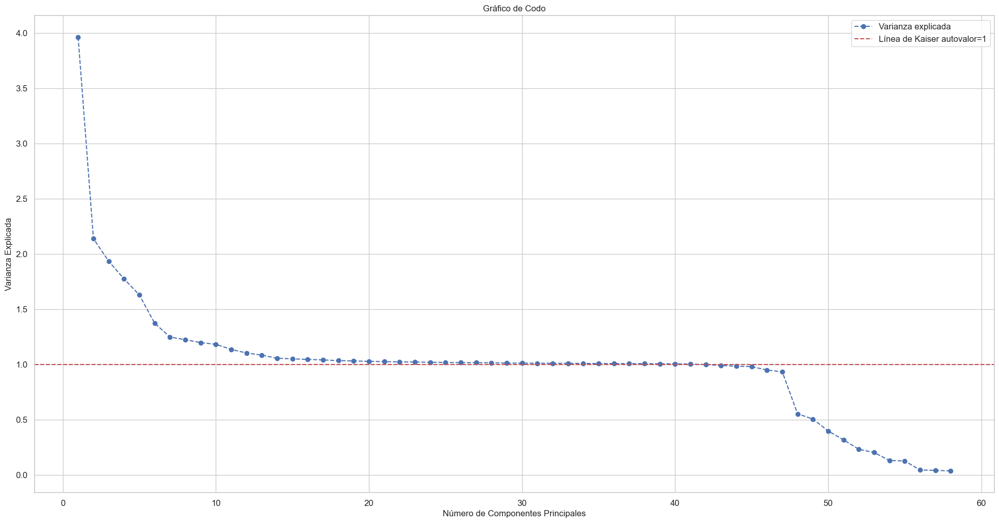

In [384]:
plt.figure(figsize=(24, 12))

plt.plot(range(1, len(explained_var_gender) + 1), explained_var_gender, marker='o', linestyle='--', color='b', label='Varianza explicada')
plt.axhline(y=1, color='r', linestyle='--', label='Línea de Kaiser autovalor=1')
plt.title('Gráfico de Codo', fontsize=12)
plt.xlabel('Número de Componentes Principales', fontsize=12)
plt.ylabel('Varianza Explicada', fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)

plt.grid(True)
plt.show()

In [385]:
kmo_all, kmo_model = calculate_kmo(data_gender)

# Mostrar el índice KMO general
print(f"Índice KMO (global): {kmo_model:.4f}")

# Mostrar el índice KMO por variable
print("Índices KMO por variable:")
print(kmo_all)
print(data_gender.columns)

Índice KMO (global): 0.0900
Índices KMO por variable:
[0.72383264 0.73619545 0.73104138 0.7844647  0.63249161 0.46244776
 0.00757813 0.01832748 0.03959838 0.00583451 0.03631055 0.01284237
 0.01115358 0.0074879  0.01003153 0.01502152 0.01542681 0.00889468
 0.01789262 0.02192938 0.01399824 0.01738015 0.01092476 0.01785008
 0.01579908 0.01660146 0.01002081 0.01167911 0.00945157 0.01696628
 0.01110648 0.02897526 0.08412532 0.00676831 0.04386072 0.01858067
 0.02260946 0.05609775 0.00785612 0.02506521 0.00932327 0.02127862
 0.02415325 0.01994988 0.0656529  0.01541709 0.43840726 0.51004791
 0.4641321  0.22387101 0.08629927 0.04849238 0.1308433  0.12781742
 0.16303654 0.13066761 0.10480889 0.1053334  0.07307799]
Index(['Age', 'Education Level', 'Years of Experience', 'Salary', 'Senior',
       'Gender_Male', 'Job Title_Content Marketing Manager',
       'Job Title_Data Analyst', 'Job Title_Data Scientist',
       'Job Title_Digital Marketing Manager',
       'Job Title_Director of Data Science

C:\Users\swart\anaconda3\Lib\site-packages\factor_analyzer\utils.py:244: UserWarning: The inverse of the variance-covariance matrix was calculated using the Moore-Penrose generalized matrix inversion, due to its determinant being at or very close to zero.
  warnings.warn(


### Pregunta 13 ###
De acuerdo a los resultados de la tabla, ¿Qué número de componentes consiguen explicar el 95% de la varianza conjunta de nuestro dataset?
Por otor lado, viendo también la gráfica obtenida, ¿Cuántos factores debemos escoger según el criterio de Kaiser?

***Respuesta:***

47 componentes logran explicar el 95% de la varianza. Según el criterio de Kaiser se deben elegir 41 factores.

Muestra en una tabla las cargas factoriales para el listado de variables. Cada columna debe hacer referencia a cada factor seleccionado mediante el criterio de Kaiser.

In [390]:
# Ajuste de Analisis Factorial para numero de factores según Kaiser
n_factores = 41  # Decidido tras el análisis PCA
fa = FactorAnalysis(n_components=n_factores, random_state=42, max_iter=5000)

# Ajustar el modelo a los datos originales
fa.fit(X_gender)

# Obtener los factores (componentes) o cargas factoriales de cada variable
cargas_factoriales = fa.components_

# Crear un DataFrame con las cargas factoriales
# Las filas corresponden a los factores, las columnas a las variables originales
cargasFact1 = pd.DataFrame(cargas_factoriales.T, columns=[f'Comp_{i+1}' for i in range(n_factores)], index=X_gender.columns)

cargasFact2 =cargasFact1.copy()
# Calcular la suma absoluta de cada columna (componente)
sumas_absolutas = cargasFact2.abs().sum()

# Calcular la suma normal (con signos) de cada columna
sumas_normales = cargasFact2.sum()

# Añadir ambas filas al final del DataFrame
cargasFact2.loc['Suma_Absoluta'] = sumas_absolutas
cargasFact2.loc['Suma_Normal'] = sumas_normales

# Mostrar los factores extraídos
pd.options.display.max_columns = None
cargasFact2


,Comp_1,Comp_2,Comp_3,Comp_4,Comp_5,Comp_6,Comp_7,Comp_8,Comp_9,Comp_10,Comp_11,Comp_12,Comp_13,Comp_14,Comp_15,Comp_16,Comp_17,Comp_18,Comp_19,Comp_20,Comp_21,Comp_22,Comp_23,Comp_24,Comp_25,Comp_26,Comp_27,Comp_28,Comp_29,Comp_30,Comp_31,Comp_32,Comp_33,Comp_34,Comp_35,Comp_36,Comp_37,Comp_38,Comp_39,Comp_40,Comp_41
Age,0.936471,0.094141,0.009470,0.003142,0.025437,-0.005795,0.018589,0.000912,-0.000483,-0.187359,-0.096890,0.006979,0.132327,-0.037930,-0.013046,-0.037924,-0.006262,-0.036814,0.011929,0.000024,0.000648,-0.020684,0.007434,0.026280,-0.049353,0.015891,0.001553,0.017340,-0.023827,0.010041,0.016865,-0.008990,-0.005076,-0.017668,-0.016808,-0.013240,-0.019207,0.016681,0.000965,0.005185,0.000308
Education Level,0.728442,0.083594,-0.003973,-0.006798,-0.026909,-0.011279,-0.039852,0.018423,-0.045144,0.363191,0.014882,0.074195,-0.115102,0.417043,-0.059122,0.003369,0.028516,0.102662,0.072635,0.021350,-0.038244,0.066847,0.027016,0.036548,-0.077185,0.063657,0.064085,-0.006354,0.025044,0.011859,-0.016051,0.027076,0.028844,-0.034688,-0.001242,-0.007697,-0.059765,0.032078,0.026987,0.001211,0.004372
Years of Experience,0.953087,0.098289,0.004111,0.009151,0.012163,-0.003559,0.011154,0.005410,0.009833,-0.106926,-0.018912,-0.024473,0.051988,-0.105344,-0.059990,-0.039598,-0.000897,-0.006520,0.017062,-0.012396,0.021715,-0.022068,0.018556,-0.003490,0.016662,0.000940,-0.028458,0.004146,-0.017083,0.004673,0.003867,0.004750,0.017617,0.001675,0.001593,-0.002235,0.015740,0.019495,-0.004958,-0.016752,-0.008136
Salary,0.862461,0.091958,-0.011285,0.012778,-0.019307,0.005418,0.000086,0.007665,0.023249,0.151613,0.192020,-0.107752,-0.241868,-0.146526,0.051619,0.066548,0.011034,0.051716,-0.041296,-0.009628,0.027128,0.033186,-0.027516,-0.050403,0.085136,-0.026869,0.014990,-0.022055,0.028543,-0.024436,-0.020310,0.003760,-0.021231,0.025315,0.031915,0.009604,0.024287,-0.068141,0.003894,0.025722,0.019274
Senior,0.348875,0.008600,-0.005765,0.014297,0.006439,0.013470,-0.008965,-0.004672,0.047134,-0.199408,0.288531,0.609314,0.046955,0.133692,0.100635,-0.002129,0.001140,-0.037834,0.121246,0.033423,-0.099693,-0.050950,-0.071346,0.034289,-0.083874,0.074904,-0.158174,-0.054786,0.052662,0.000088,-0.131810,-0.078571,0.036913,-0.003682,0.068497,0.097043,0.082751,-0.068551,0.001555,-0.075039,-0.021370
Job Title_Content Marketing Manager,0.003910,-0.000452,-0.001919,-0.000429,0.002048,-0.000089,-0.001134,-0.001676,-0.002093,-0.003988,-0.004007,-0.001556,0.001880,-0.003672,-0.004475,-0.002435,-0.001194,-0.001541,0.001361,-0.000650,0.004216,-0.002154,0.003650,0.001043,-0.001834,-0.001649,0.001781,0.001013,-0.001774,0.001184,0.004368,0.000064,-0.000225,0.000335,-0.001774,-0.003722,-0.002515,0.006759,-0.010104,0.017611,0.002503
Job Title_Data Analyst,-0.029267,-0.005993,-0.005066,0.005563,0.001712,0.004694,-0.000706,-0.000068,-0.003833,0.013939,-0.008265,-0.022570,-0.123381,-0.060503,0.099663,-0.105178,0.019881,-0.005608,0.027903,0.008771,-0.019949,-0.003612,0.000203,0.007301,-0.032115,0.024372,-0.007813,0.007669,-0.011277,0.003519,0.001549,-0.001264,0.005476,-0.012069,-0.005941,-0.005341,-0.005486,0.008767,0.003720,-0.007179,-0.001977
Job Title_Data Scientist,0.058063,0.011079,-0.009305,-0.006149,-0.003700,0.002464,-0.008415,0.002803,-0.023256,0.222194,0.019692,0.017267,0.086099,-0.039774,0.027604,-0.001412,-0.002027,-0.020883,-0.012455,0.000238,-0.007667,-0.008612,-0.006966,-0.001132,0.000659,-0.002313,-0.009563,0.004027,-0.005681,0.000632,0.003069,-0.003501,-0.003034,-0.000010,-0.004422,-0.000960,0.004319,0.001158,-0.001882,-0.004309,-0.002285
Job Title_Digital Marketing Manager,-0.001846,-0.000018,-0.000537,-0.000123,-0.000729,-0.001439,0.001947,0.000365,0.001316,-0.001099,-0.003079,-0.000210,0.000670,-0.000467,-0.001974,-0.000874,-0.001080,-0.001235,0.000457,-0.000377,0.001865,-0.001029,0.001890,0.001398,-0.000058,-0.002835,0.000592,0.000459,-0.000361,0.002550,0.000921,0.000934,-0.001654,0.001450,0.000288,0.002026,-0.000257,0.006113,-0.004122,0.007805,0.000708
Job 

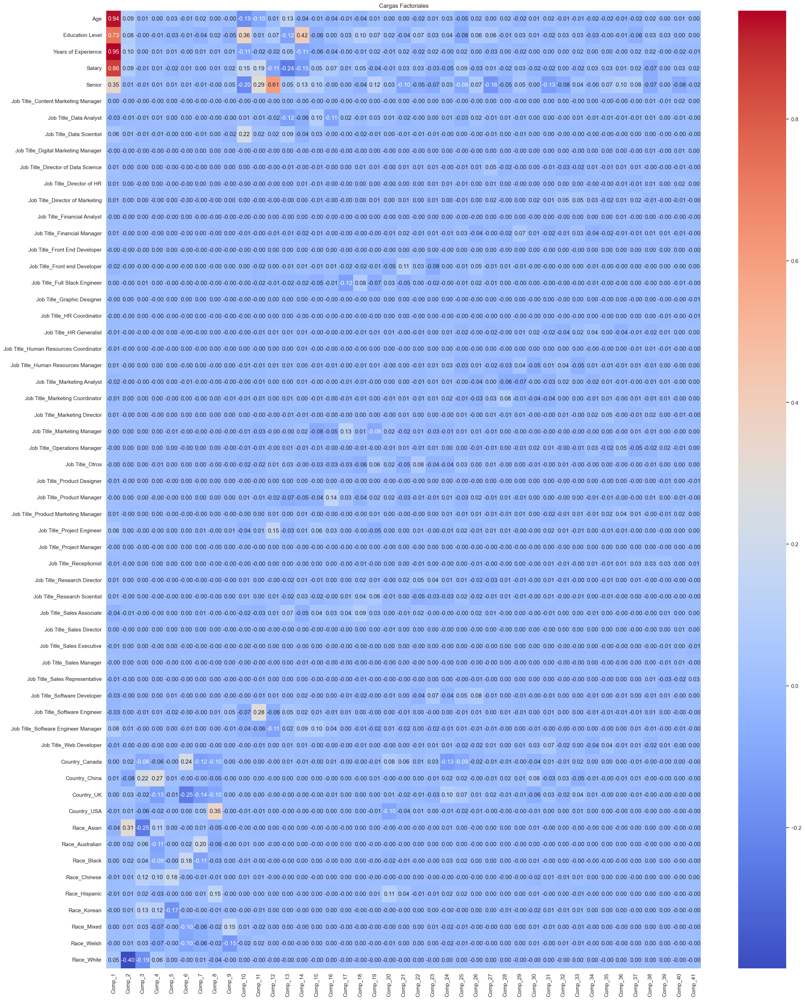

In [391]:
# Matriz de cargas factoriales
plt.figure(figsize=(27, 35))
sns.heatmap(cargasFact1, annot=True, cmap='coolwarm', fmt='.2f', cbar=True)
plt.title('Cargas Factoriales')
plt.savefig('sin_rotacion.png', dpi=300, bbox_inches='tight')
plt.show()

### Pregunta 14 ###
En base a los factores seleccionados mediante el método de Kaiser, haz una interpretación del significado de los factores.

***Respuesta:***

Factor 1 se enfoca en Age (0.936), Years of Experience (0.953) y Salary (0.862) por lo que es una relación entre la experiencia y el salario.

Factor 2 los principales son Race_Asian (0.309) y Education Level (0.083) parece ser una relacion entre la raza y su nivel de educación.

Factor 3 tiene a Country_China (0.223) y Country_Canada (-0.084) donde parece ser que se encuentran encontra del otro.

Los Job Titles se encuentran cercanos a 0 podria significar que afectan a factores bajos

Para continuar con el analisis, vamos a seleccionar los 2 primeros factores. En el siguiente bloque de código se ha de presentar una tabla con las cargas factoriales de cada variable para los 2 factores seleccionados. Aplicar una rotación si se considera oportuno para ayudar a la interpretación de los factores. Después, se ha de mostrar en otra tabla las comunalidades y unicidades (ambas en expresadas como porcentaje). Por último, se ha de mostrar un diagrama biplot que represente, en función de los 2 factores escogidos, las variables que mayor representación según las cargas factoriales. Es decir, aquellas variables que tengan al menos una carga factorial mayor que 0.3. Esto reducirá el número de vectores a representar y hará que la visualización sea más legible.

In [396]:
# Tabla de cargas factoriales para los 2 factores (incluyendo rotación si se elige)

In [397]:
fa_rotado2 = FactorAnalyzer(n_factors=n_factores, rotation="promax")
fa_rotado2.fit(X_gender)

# Obtener las cargas factoriales rotadas
cargas_factoriales_rotadas2 = fa_rotado2.loadings_

# Mostrar las cargas factoriales rotadas en un DataFrame
df_cargas_rotadas3 = pd.DataFrame(cargas_factoriales_rotadas2, columns=[f'Factor {i+1}' for i in range(n_factores)], index=X_gender.columns)

df_cargas_rotadas4 =df_cargas_rotadas3.copy()
# Calcular la suma absoluta de cada columna (componente)
sumas_absolutas3 = df_cargas_rotadas4.abs().sum()

# Calcular la suma normal (con signos) de cada columna
sumas_normales3 = df_cargas_rotadas4.sum()

# Añadir ambas filas al final del DataFrame
df_cargas_rotadas4.loc['Suma_Absoluta'] = sumas_absolutas3
df_cargas_rotadas4.loc['Suma_Normal'] = sumas_normales3

# Mostrar el resultado
df_cargas_rotadas4

C:\Users\swart\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


,Factor 1,Factor 2,Factor 3,Factor 4,Factor 5,Factor 6,Factor 7,Factor 8,Factor 9,Factor 10,Factor 11,Factor 12,Factor 13,Factor 14,Factor 15,Factor 16,Factor 17,Factor 18,Factor 19,Factor 20,Factor 21,Factor 22,Factor 23,Factor 24,Factor 25,Factor 26,Factor 27,Factor 28,Factor 29,Factor 30,Factor 31,Factor 32,Factor 33,Factor 34,Factor 35,Factor 36,Factor 37,Factor 38,Factor 39,Factor 40,Factor 41
Age,1.064372,0.064097,0.175468,0.084645,-0.031253,-0.015966,0.001755,0.047458,0.009732,0.059803,0.070342,0.035431,-0.027108,0.023012,-0.004196,0.009835,0.005397,-0.038226,0.027393,0.017636,-0.001982,-0.038976,0.014633,-0.044345,-0.009948,0.030275,0.031228,0.010157,0.026336,0.034726,-0.018619,0.034472,0.001281,-0.014803,0.001426,-0.010153,-0.005911,-0.010764,0.111951,-0.135278,-0.004311
Education Level,0.449655,-0.222521,0.108590,0.076023,-0.007684,-0.028998,0.008426,0.043722,-0.024539,-0.003945,-0.002793,0.036633,0.171543,0.022640,0.043325,-0.008718,0.017281,0.041832,0.024744,-0.022699,-0.061930,-0.003145,-0.008751,0.113562,-0.034521,-0.063838,0.008641,0.040045,0.051012,0.061483,0.027693,-0.014017,-0.028337,-0.004635,-0.013353,-0.011072,-0.003882,-0.069548,-0.185416,0.448816,-0.376095
Years of Experience,1.045461,0.013351,0.078105,0.060443,-0.023825,-0.021377,-0.012325,0.020078,0.007546,0.049639,0.064452,-0.000967,0.016781,0.033026,-0.015230,0.010564,0.000849,-0.015637,0.023051,-0.009753,0.032200,-0.034371,-0.020625,-0.003897,-0.021558,0.013176,0.004511,0.029887,0.022893,0.011792,-0.014235,0.015927,-0.013507,0.024839,-0.023658,-0.017523,0.003557,-0.008742,0.027098,-0.160621,0.083311
Salary,0.678242,-0.150008,0.071539,-0.084930,-0.000557,0.045048,-0.025624,-0.103138,0.006717,-0.010690,0.008565,0.063059,0.143285,0.046641,-0.012718,-0.022849,-0.002727,0.083871,0.097506,-0.065165,0.046692,-0.007428,-0.085556,0.024301,-0.069494,-0.033289,-0.041673,0.005064,0.060355,-0.027487,-0.021444,-0.008289,-0.077058,0.067321,-0.077843,-0.053114,0.006800,-0.061077,-0.107852,-0.003652,0.229194
Senior,0.233033,0.065728,-0.162312,0.045836,-0.004555,0.056449,0.067784,0.055069,-0.002396,0.021820,0.010676,0.431835,0.004420,0.029714,0.010298,0.020699,-0.003111,-0.042238,0.012040,-0.027043,-0.034509,-0.012413,-0.019681,0.043302,-0.001113,-0.021733,0.032292,-0.042808,-0.050259,-0.040146,0.139983,-0.034050,-0.003614,-0.034595,0.063939,0.000098,-0.025787,0.002166,0.084923,0.069175,-0.081024
Job Title_Content Marketing Manager,0.065921,0.046144,-0.063514,0.033267,-0.000819,0.036711,0.036101,0.033122,0.000589,0.000954,-0.002661,-0.016396,0.026072,0.025380,0.002417,0.002949,0.000374,0.023703,0.020187,-0.023036,-0.023105,-0.001101,-0.018999,-0.009405,-0.017404,-0.021037,-0.017437,-0.019782,-0.017876,-0.017217,0.000565,1.062393,-0.012390,-0.015167,-0.008176,-0.011151,-0.013288,-0.009900,0.019669,0.057036,0.003138
Job Title_Data Analyst,-0.137300,0.102707,-0.053031,-1.212377,-0.013861,0.070140,0.080853,0.100976,-0.003345,0.015069,0.014642,-0.024296,0.075490,0.077495,0.007444,0.001978,0.006039,0.043444,0.064667,-0.052511,-0.052916,-0.026791,-0.045236,-0.025021,-0.052135,-0.042895,-0.028130,-0.028081,-0.019132,-0.018061,-0.005913,-0.027115,-0.036004,-0.033969,-0.026340,-0.035862,-0.032116,-0.036689,0.068540,0.099209,-0.008708
Job Title_Data Scientist,0.008739,-1.291723,-0.175032,0.091175,0.009317,0.087625,0.091454,0.098570,0.000921,-0.009121,-0.015488,-0.097801,-0.016134,0.051060,-0.009636,-0.008713,-0.003876,0.034272,0.026772,-0.034358,-0.049886,0.004665,-0.024998,-0.078152,-0.021323,-0.022910,-0.041542,-0.058873,-0.066569,-0.048697,-0.024153,-0.033239,-0.007434,-0.051814,-0.010036,-0.016928,-0.032801,0.006543,0.141545,0.026430,0.080862
Job Title_Digital Marketing Manager,0.024633,0.003633,-0.008064,0.000370,0.003516,0.002329,0.002152,0.001586,-0.002444,-0.005405,-0.019194,-0.014782,0.000543,0.000610,-0.005872,-0.004129,-0.030634,0.002783,0.000379,0.000483,-0.002488,0.012562,-0.000689,-0.002835,-0.000870,-0.001963,-0.004228,-0.001203,-0.002191,-0.001860,-0.003931,-0.0

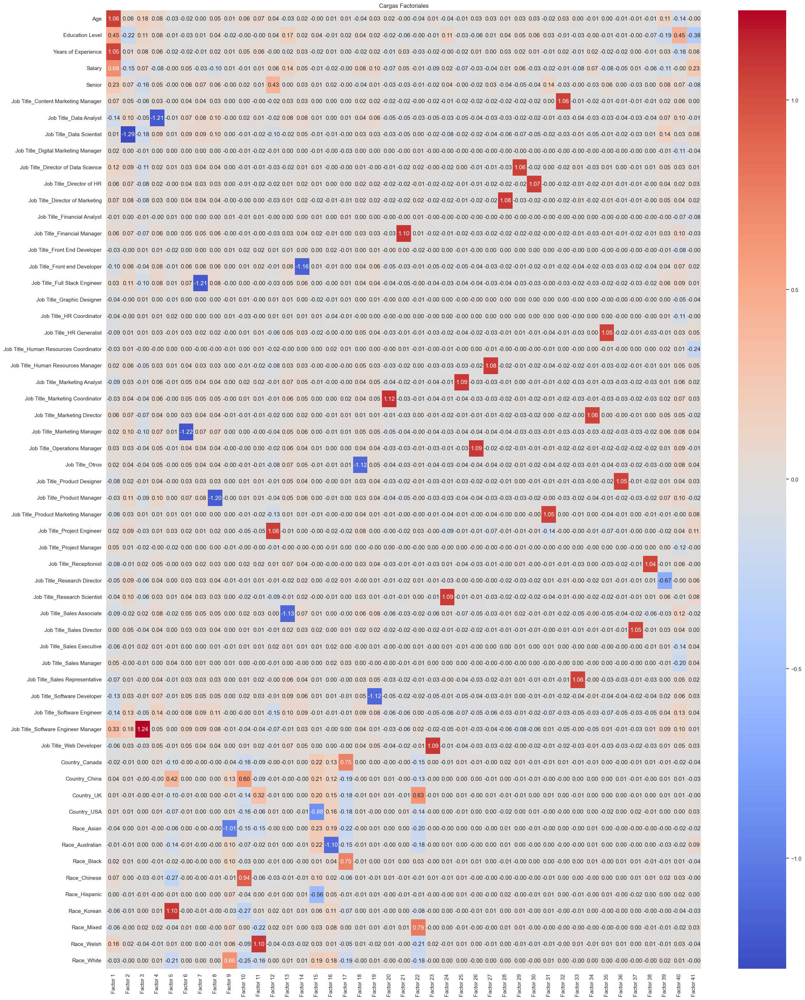

In [398]:
# Visualizar el DataFrame con un heatmap
plt.figure(figsize=(27, 35))
sns.heatmap(df_cargas_rotadas3, annot=True, cmap='coolwarm', fmt='.2f', cbar=True)
plt.title('Cargas Factoriales')
plt.savefig('promax.png', dpi=300, bbox_inches='tight')
plt.show()

In [399]:
factor1_index = 0
factor2_index = 1

cargas_factoriales_rotadas_obli = cargas_factoriales_rotadas2.T

selected_factors_obli = cargas_factoriales_rotadas_obli[[factor1_index, factor2_index]]

table_cargas_obli = pd.DataFrame(selected_factors_obli, columns=X_gender.columns, index =['Comp_1','Comp_2'])

table_cargas_obli

,Age,Education Level,Years of Experience,Salary,Senior,Job Title_Content Marketing Manager,Job Title_Data Analyst,Job Title_Data Scientist,Job Title_Digital Marketing Manager,Job Title_Director of Data Science,Job Title_Director of HR,Job Title_Director of Marketing,Job Title_Financial Analyst,Job Title_Financial Manager,Job Title_Front End Developer,Job Title_Front end Developer,Job Title_Full Stack Engineer,Job Title_Graphic Designer,Job Title_HR Coordinator,Job Title_HR Generalist,Job Title_Human Resources Coordinator,Job Title_Human Resources Manager,Job Title_Marketing Analyst,Job Title_Marketing Coordinator,Job Title_Marketing Director,Job Title_Marketing Manager,Job Title_Operations Manager,Job Title_Otros,Job Title_Product Designer,Job Title_Product Manager,Job Title_Product Marketing Manager,Job Title_Project Engineer,Job Title_Project Manager,Job Title_Receptionist,Job Title_Research Director,Job Title_Research Scientist,Job Title_Sales Associate,Job Title_Sales Director,Job Title_Sales Executive,Job Title_Sales Manager,Job Title_Sales Representative,Job Title_Software Developer,Job Title_Software Engineer,Job Title_Software Engineer Manager,Job Title_Web Developer,Country_Canada,Country_China,Country_UK,Country_USA,Race_Asian,Race_Australian,Race_Black,Race_Chinese,Race_Hispanic,Race_Korean,Race_Mixed,Race_Welsh,Race_White
Comp_1,1.064372,0.449655,1.045461,0.678242,0.233033,0.065921,-0.137300,0.008739,0.024633,0.117513,0.058142,0.066582,-0.006483,0.062294,-0.030511,-0.103976,0.025672,-0.039691,-0.041005,-0.085713,-0.027180,0.024605,-0.093668,-0.033244,0.058950,0.023620,0.031083,0.015508,-0.078313,-0.031607,-0.058474,0.017742,0.054850,-0.080299,-0.049007,-0.036448,-0.090177,0.000643,-0.058369,0.05336,-0.073218,-0.130547,-0.144860,0.328262,-0.064351,-0.019405,0.035291,0.011145,0.014814,-0.043398,-0.013095,0.015462,0.074952,0.003033,-0.057335,-0.062260,0.156153,-0.032627
Comp_2,0.064097,-0.222521,0.013351,-0.150008,0.065728,0.046144,0.102707,-1.291723,0.003633,0.090378,0.066486,0.079169,0.004732,0.065539,-0.003295,0.062501,0.107187,-0.001051,-0.003163,0.013092,0.014027,0.055247,0.027893,0.044215,0.071683,0.101992,0.030717,0.043157,0.023258,0.114638,0.030564,0.086677,0.007244,-0.009236,0.090802,0.101691,-0.019934,0.045979,-0.008515,-0.00062,0.009995,0.033522,0.134777,0.178605,0.032697,-0.011381,0.012608,-0.005704,0.010913,0.000783,-0.009302,0.008868,0.004253,-0.010750,-0.010316,-0.001731,0.016873,-0.000671


In [400]:
fa_rotado = FactorAnalyzer(n_factors=n_factores, rotation="varimax")
fa_rotado.fit(X_gender)

# Obtener las cargas factoriales rotadas
cargas_factoriales_rotadas = fa_rotado.loadings_

# Mostrar las cargas factoriales rotadas en un DataFrame
df_cargas_rotadas = pd.DataFrame(cargas_factoriales_rotadas, columns=[f'Factor {i+1}' for i in range(n_factores)], index=X_gender.columns)

df_cargas_rotadas2 =df_cargas_rotadas.copy()
# Calcular la suma absoluta de cada columna (componente)
sumas_absolutas2 = df_cargas_rotadas2.abs().sum()

# Calcular la suma normal (con signos) de cada columna
sumas_normales2 = df_cargas_rotadas2.sum()

# Añadir ambas filas al final del DataFrame
df_cargas_rotadas2.loc['Suma_Absoluta'] = sumas_absolutas2
df_cargas_rotadas2.loc['Suma_Normal'] = sumas_normales2

# Mostrar el resultado
df_cargas_rotadas2

C:\Users\swart\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


,Factor 1,Factor 2,Factor 3,Factor 4,Factor 5,Factor 6,Factor 7,Factor 8,Factor 9,Factor 10,Factor 11,Factor 12,Factor 13,Factor 14,Factor 15,Factor 16,Factor 17,Factor 18,Factor 19,Factor 20,Factor 21,Factor 22,Factor 23,Factor 24,Factor 25,Factor 26,Factor 27,Factor 28,Factor 29,Factor 30,Factor 31,Factor 32,Factor 33,Factor 34,Factor 35,Factor 36,Factor 37,Factor 38,Factor 39,Factor 40,Factor 41
Age,0.933020,-0.007568,0.007581,0.009343,0.128149,0.008074,0.013718,0.009442,-0.009548,-0.003571,0.006070,0.005646,0.074703,0.037479,-0.015937,-0.000777,0.023336,0.046644,0.142424,-0.009688,0.031469,0.036851,0.011189,0.002209,0.025985,-0.017867,0.000561,0.007395,0.046402,-0.026696,-0.009456,0.015330,0.042324,0.039154,-0.005552,-0.016672,0.036330,-0.002951,0.075887,-0.046447,0.061212
Education Level,0.576510,-0.008250,-0.009748,-0.014641,0.120442,0.006119,0.020065,0.003892,0.279656,0.006697,0.006897,0.233436,0.070806,0.028513,-0.040152,-0.003664,0.060919,-0.047765,0.144526,0.176422,0.034065,0.047925,-0.035142,-0.025470,-0.086309,-0.056253,-0.065174,-0.022354,0.022473,-0.111712,-0.054308,0.064748,0.088187,0.090371,0.013836,-0.024194,-0.013247,-0.001741,0.443822,0.261450,-0.360285
Years of Experience,0.948342,-0.001751,0.005000,0.003503,0.086222,0.007320,0.010151,0.004015,0.028701,-0.000269,-0.000789,0.052651,0.053868,0.012487,-0.014681,-0.010666,0.017649,0.015065,0.071521,0.024120,0.043838,0.040248,-0.019279,-0.036064,0.005353,-0.034874,0.030887,-0.025478,0.013700,-0.029842,-0.029246,0.032214,0.018059,0.038256,0.034388,-0.028185,0.015904,0.005439,0.088618,0.025496,0.136047
Salary,0.736564,0.004813,0.002708,-0.012801,0.089204,0.011163,0.014157,-0.005299,0.160429,-0.000681,0.006226,0.192016,-0.059432,-0.092702,0.049036,-0.019454,-0.018336,-0.104345,0.076565,0.047615,0.066236,0.125484,-0.086331,-0.111146,-0.053286,-0.097627,0.043518,-0.103527,-0.049814,-0.095674,-0.106285,0.012062,-0.022306,0.083728,0.083094,-0.074730,-0.013871,0.005755,0.217482,0.137486,0.230203
Senior,0.294834,-0.005415,0.007002,0.005536,0.509167,0.008884,0.014109,-0.003119,-0.085771,-0.006434,-0.012341,0.040532,0.094851,0.098672,0.091073,0.108829,0.212579,0.045375,-0.188802,0.063687,0.068085,0.041409,-0.055217,-0.046184,-0.046133,-0.021322,-0.066001,0.086066,0.042586,-0.015323,-0.021541,-0.068595,-0.060229,-0.073362,-0.059624,-0.014420,-0.057769,-0.048071,0.137490,-0.105871,-0.053813
Job Title_Content Marketing Manager,0.029798,-0.012046,0.001150,-0.000645,-0.027825,0.006330,0.011407,0.009004,-0.022549,-0.005938,-0.004708,0.009293,0.016324,0.016216,0.016065,0.015925,-0.008349,-0.013439,-0.020456,-0.010962,0.012376,0.010051,-0.010793,-0.008913,-0.009634,-0.009072,-0.011604,-0.007360,-0.011349,-0.004582,-0.006301,-0.009551,-0.008446,-0.008988,-0.008677,-0.006585,0.994415,-0.007479,0.029130,-0.014302,0.007753
Job Title_Data Analyst,-0.095627,-0.004452,-0.000104,0.000992,-0.049681,-0.001368,0.002364,-0.005249,-0.052251,-0.018137,-0.005062,0.042236,-0.973307,0.046218,0.044420,0.043361,-0.018828,-0.037358,-0.034129,-0.024953,0.044234,0.040726,-0.035072,-0.032791,-0.028250,-0.034439,-0.028962,-0.026557,-0.028670,-0.023187,-0.026277,-0.021787,-0.018718,-0.014267,-0.018278,-0.025758,-0.020036,-0.020566,0.089303,-0.032534,0.046079
Job Title_Data Scientist,0.117964,-0.008445,-0.008332,-0.012454,-0.073864,0.012167,-0.000577,0.005175,0.961582,-0.002708,0.000977,0.030094,0.054256,0.055094,0.054906,0.054448,-0.027153,-0.044561,-0.074663,-0.038566,0.040708,0.032298,-0.035365,-0.028861,-0.031464,-0.028975,-0.038582,-0.024175,-0.038516,-0.013533,-0.020031,-0.033666,-0.029360,-0.032270,-0.029923,-0.021494,-0.028032,-0.024912,0.104185,-0.049748,0.025404
Job Title_Digital Marketing Manager,0.004424,0.002328,-0.000255,-0.008920,-0.014573,-0.030832,-0.007442,-0.019054,-0.003350,0.010398,0.006625,0.000294,0.000589,0.001727,0.001961,0.001894,-0.004898,-0.003385,-0.005924,-0.003038,0.000467,0.000092,0.000027,-0.000438,-0.001837,-0.000808,-0.002323,-0.002373,-0.004154,-0.000003,-0.000393,-0.001

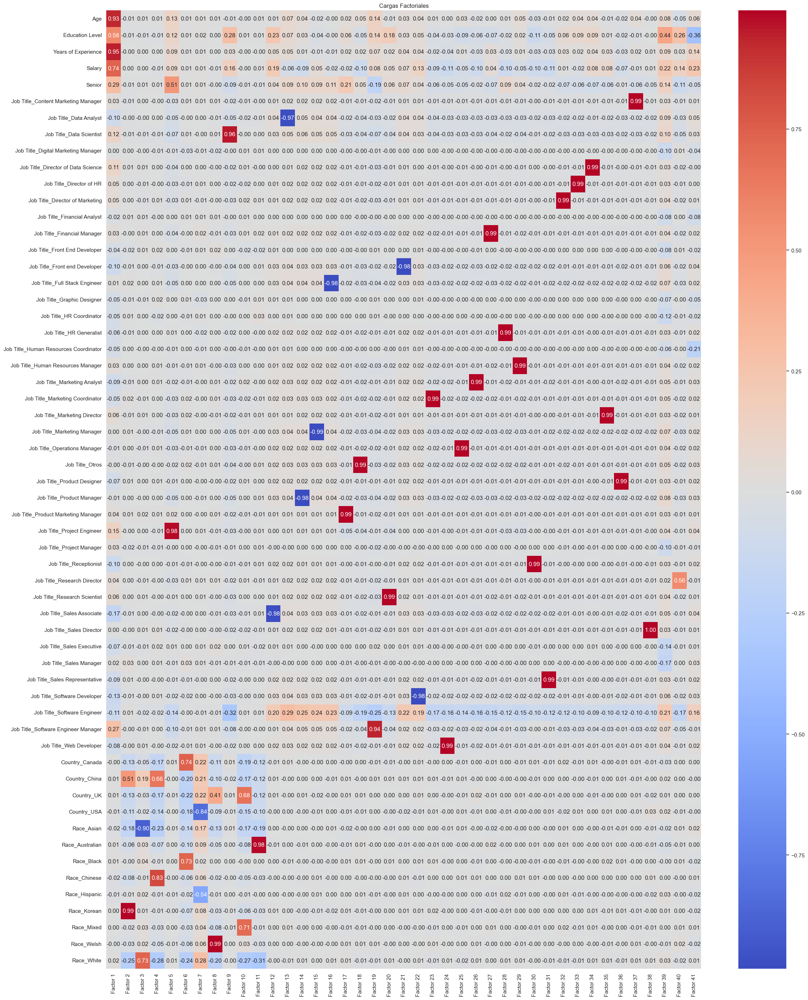

In [401]:
plt.figure(figsize=(27, 35))
sns.heatmap(df_cargas_rotadas, annot=True, cmap='coolwarm', fmt='.2f', cbar=True)
plt.title('Cargas Factoriales')
plt.savefig('varimax.png', dpi=300, bbox_inches='tight')
plt.show()

In [402]:
factor1_index = 0
factor2_index = 1

cargas_factoriales_rotadas_transpuesta = cargas_factoriales_rotadas.T

selected_factors = cargas_factoriales_rotadas_transpuesta[[factor1_index, factor2_index]]

table_cargas_vari = pd.DataFrame(selected_factors, columns=X_gender.columns, index=['Comp_1','Comp_2'])

table_cargas_vari

,Age,Education Level,Years of Experience,Salary,Senior,Job Title_Content Marketing Manager,Job Title_Data Analyst,Job Title_Data Scientist,Job Title_Digital Marketing Manager,Job Title_Director of Data Science,Job Title_Director of HR,Job Title_Director of Marketing,Job Title_Financial Analyst,Job Title_Financial Manager,Job Title_Front End Developer,Job Title_Front end Developer,Job Title_Full Stack Engineer,Job Title_Graphic Designer,Job Title_HR Coordinator,Job Title_HR Generalist,Job Title_Human Resources Coordinator,Job Title_Human Resources Manager,Job Title_Marketing Analyst,Job Title_Marketing Coordinator,Job Title_Marketing Director,Job Title_Marketing Manager,Job Title_Operations Manager,Job Title_Otros,Job Title_Product Designer,Job Title_Product Manager,Job Title_Product Marketing Manager,Job Title_Project Engineer,Job Title_Project Manager,Job Title_Receptionist,Job Title_Research Director,Job Title_Research Scientist,Job Title_Sales Associate,Job Title_Sales Director,Job Title_Sales Executive,Job Title_Sales Manager,Job Title_Sales Representative,Job Title_Software Developer,Job Title_Software Engineer,Job Title_Software Engineer Manager,Job Title_Web Developer,Country_Canada,Country_China,Country_UK,Country_USA,Race_Asian,Race_Australian,Race_Black,Race_Chinese,Race_Hispanic,Race_Korean,Race_Mixed,Race_Welsh,Race_White
Comp_1,0.933020,0.57651,0.948342,0.736564,0.294834,0.029798,-0.095627,0.117964,0.004424,0.108618,0.047049,0.048630,-0.023448,0.031276,-0.044352,-0.100380,0.013300,-0.050166,-0.053272,-0.058782,-0.051080,0.029743,-0.094935,-0.052199,0.058628,0.003119,-0.013104,-0.002535,-0.072190,-0.007494,0.035161,0.149601,0.028263,-0.103617,0.043079,0.058569,-0.167799,0.002954,-0.074604,0.018532,-0.08577,-0.128858,-0.109590,0.270357,-0.081891,-0.001386,0.007331,0.007504,-0.008515,-0.015298,0.007597,0.013055,-0.016343,-0.014687,0.001672,0.001866,-0.004927,0.017478
Comp_2,-0.007568,-0.00825,-0.001751,0.004813,-0.005415,-0.012046,-0.004452,-0.008445,0.002328,0.006682,0.000237,0.001253,0.008703,-0.001153,-0.019787,-0.008917,0.018648,-0.006418,0.009746,-0.010227,0.000529,0.003240,-0.011370,0.016928,-0.006483,0.013048,0.003011,-0.009906,0.012404,0.003076,0.007475,-0.002002,-0.019682,0.001336,0.002749,0.004934,-0.014089,-0.001334,-0.008761,0.034921,0.00543,-0.009472,0.014219,-0.003746,-0.004492,-0.127056,0.506245,-0.128512,-0.106308,-0.179003,-0.058348,-0.003811,-0.077653,-0.009147,0.988182,-0.017911,-0.033478,-0.246094


In [403]:
# Tabla de comunalidades y unicidades
comunalidades_obli = np.sum(table_cargas_obli**2, axis=0)

unicidad_obli = 1 - comunalidades_obli

comunalidades_unicidad_obli = pd.DataFrame({
    'Comunalidad (%)': 100*comunalidades_obli,
    'Unicidad (%)': 100*unicidad_obli
})

comunalidades_unicidad_obli

,Comunalidad (%),Unicidad (%)
Age,113.699529,-13.699529
Education Level,25.170553,74.829447
Years of Experience,109.316680,-9.316680
Salary,48.251445,51.748555
Senior,5.862473,94.137527
Job Title_Content Marketing Manager,0.647479,99.352521
Job Title_Data Analyst,2.940004,97.059996
Job Title_Data Scientist,166.862514,-66.862514
Job Title_Digital Marketing Manager,0.062000,99.938000
Job Title_Director of Data Science,2.197743,97.802257


In [404]:
comunalidades_vari = np.sum(table_cargas_vari**2, axis=0)

unicidad_vari = 1 - comunalidades_vari

comunalidades_unicidad_vari = pd.DataFrame({
    'Comunalidad (%)': 100*comunalidades_vari,
    'Unicidad (%)': 100*unicidad_vari
})

comunalidades_unicidad_vari

,Comunalidad (%),Unicidad (%)
Age,87.058361,12.941639
Education Level,33.243217,66.756783
Years of Experience,89.935565,10.064435
Salary,54.255001,45.744999
Senior,8.695614,91.304386
Job Title_Content Marketing Manager,0.103301,99.896699
Job Title_Data Analyst,0.916438,99.083562
Job Title_Data Scientist,1.398685,98.601315
Job Title_Digital Marketing Manager,0.002499,99.997501
Job Title_Director of Data Science,1.184254,98.815746


In [405]:
varimax_count = (comunalidades_unicidad_vari['Comunalidad (%)'] < 1).sum()
oblimin_count = (comunalidades_unicidad_obli['Comunalidad (%)'] < 1).sum()

print(f'Cantidades < 0 \n Varimax: {varimax_count} \n Promax: {oblimin_count}')

Cantidades < 0 
 Varimax: 37 
 Promax: 39


In [406]:
# Filtrado de variables para representación biplot
#Promax presenta una variable negativa cosa imposible por lo que se continuara usando varimax
pca_gender = table_cargas_vari.T

pca_gender

,Comp_1,Comp_2
Age,0.933020,-0.007568
Education Level,0.576510,-0.008250
Years of Experience,0.948342,-0.001751
Salary,0.736564,0.004813
Senior,0.294834,-0.005415
Job Title_Content Marketing Manager,0.029798,-0.012046
Job Title_Data Analyst,-0.095627,-0.004452
Job Title_Data Scientist,0.117964,-0.008445
Job Title_Digital Marketing Manager,0.004424,0.002328
Job Title_Director of Data Science,0.108618,0.006682


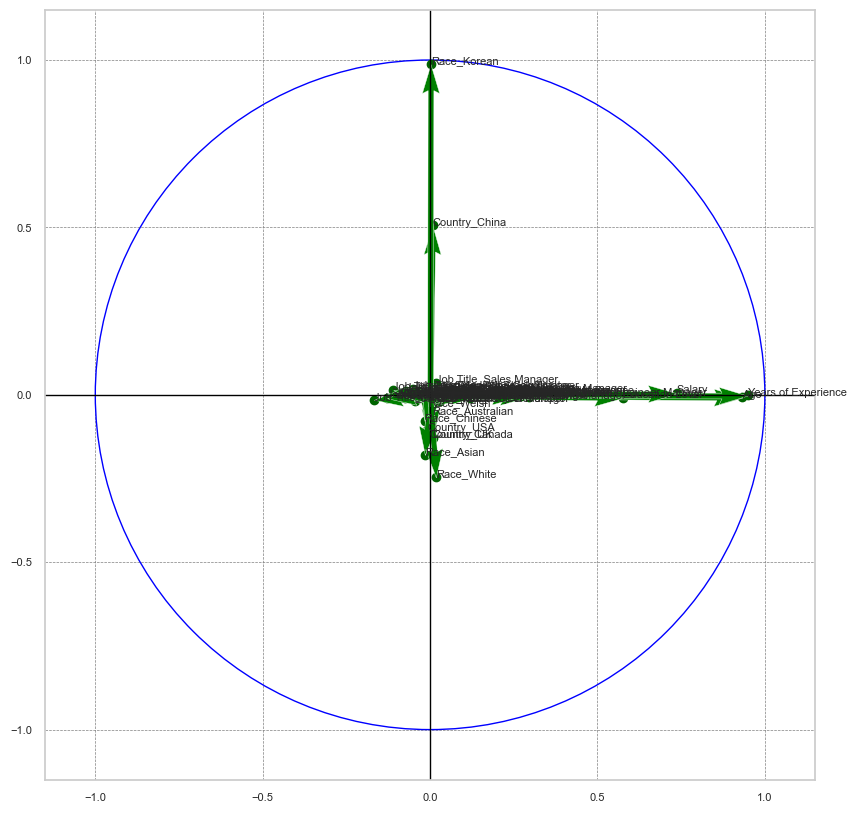

In [407]:
# Representación gráfica biplot de vectores de variables

# Crear figura y eje
fig, ax = plt.subplots(figsize=(10, 10))

# Pintamos un circulo de radio 1
circle = plt.Circle((0, 0), 1, color='blue', fill=False)
ax.add_artist(circle)

# Pintamos los puntos de los vectores de las variables según las saturaciones
plt.scatter(pca_gender['Comp_1'], pca_gender['Comp_2'], color='darkgreen')

# Añadir etiquetas a cada vector
for i in pca_gender.index:
    plt.text(pca_gender['Comp_1'][i], pca_gender['Comp_2'][i], str(i), fontsize=8, ha='left')

# Añadir las fechas de los vectores
for i in pca_gender.index:
    ax.quiver(0, 0, pca_gender['Comp_1'][i], pca_gender['Comp_2'][i],
              angles='xy', scale_units='xy', scale=1, color='green', linewidth=0.3)

ax.grid(True, which='both', color='gray', linestyle='--', linewidth=0.5)
ax.axhline(0, color='black', linewidth=1)
ax.axvline(0, color='black', linewidth=1)
ax.set_xlim(-1.15, 1.15)
ax.set_ylim(-1.15, 1.15)

# Asegurar relación de aspecto entre ejes de componentes 1 y 2
plt.gca().set_aspect('equal', adjustable='box')
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.show()

### Pregunta 15 ###
Según los resultados mostrados, ¿Qué interpretación podemos hacer de los porcentajes de comunalidades y unicidades? En caso de obtener unicidades por debajo de 0, ¿A qué se debe?. Analizando el diagrama biplot, ¿Qué podemos concluir acerca de las variables representadas?

***Respuesta:***

En si la mayoría de las variables presentan unicidad y pocas presentan comunalidad por lo que la mayoría de estas no están siendo explicadas de forma conjunta y se explican por si mismas, esto puede deberse a que faltan variables adicionales.

Usando el metodo de Promax existen varias unicidades por debajo de 0 esto se debe a que los factores estan sobre ajustando estás variables.

Según el biplot la mayoría de estás variables están cerca de 0 con 4 notables excepciones que pertenecen a Race Korean, Age, Years of Experience y Salary, por lo que la mayoría de variables tienen una relación debil entre los componentes. Adicionalmente la mayoria de las variables se encuentran en puntos 0 ya sea y o x

Seguimos con el diseño de nuestro modelo para intentar distinguir entre *Male* y *Female* para cada uno de los registros del conjunto de datos. Para ello vamos a tratar de modelar la regresión logística.

Vamos a tratar de reducir la dimensionalidad de nuestro conjunto de variables predictoras aplicando un método de regularización. De esta forma trataremos de diseñar un modelo de regresión logística con regularización que evite en la medida de lo posible la multicolinealidad y manteniendo la máxima información posible acerca de nuestra variable objetivo. 

En los siguientes bloques de código, se ha de terminar de transformar el conjunto de datos para que pueda ser utilizado en un modelo de regresión logística. Ya se realizó la binarización de la variable objetivo ***Gender*** pero ahora queda normalizar, estandarizar y demás operaciones que considere el alumno oportunas para este modelo.

In [412]:
factor_loadings = table_cargas_vari.T.values

Una vez preparados los datos, pasamos a modelar la regresión logísitica aplicando una regularización LASSO. Queda a discreción del alumno la configuración del algoritmo de optimización de la función de coste y la fuerza de la regularización. Se deberán mostrar como resultado del entrenamiento los coeficientes de la regresión con la desviación estandar de los errores en su estimación, el logaritmo de la verosimilitud, el de logaritmo de la verosimilitud del modelo nulo, el pseudo-R2 y las métricas AIC y BIC.

In [414]:
# Modelado con regularización LASSO

In [415]:
X_pca = X_gender.dot(factor_loadings)

In [416]:
X_train_pca, X_test_pca, y_train, y_test = train_test_split(
    X_pca, y_gender, test_size=0.3, random_state=42
)

X_train_pca_sm = sm.add_constant(X_train_pca)


lasso_model_balanced = LogisticRegression(
    penalty='l1',
    solver='liblinear',
    C=0.01,
    random_state=42
)
lasso_model_balanced.fit(X_train_pca, y_train)


coef_pca = result.params[1:] 
intercept = result.params[0]

In [417]:
print("Model Coefficients (PCA Components):\n", result.params)

Model Coefficients (PCA Components):
 const    0.228607
0        0.079533
1        0.001694
dtype: float64


In [418]:
# Map PCA coefficients to original 58 variables
coef_original_vars = factor_loadings @ coef_pca  # (58,)

# Create coefficient DataFrame
coefficients_df = pd.DataFrame({
    'Variable': X_gender.columns,
    'Coeficiente': coef_original_vars
})

coefficients_df['Odds'] = np.exp(coefficients_df['Coeficiente'])

coefficients_df.sort_values(by='Coeficiente', ascending=False)

,Variable,Coeficiente,Odds
2,Years of Experience,0.075422,1.078339
0,Age,0.074193,1.077015
3,Salary,0.058589,1.060340
1,Education Level,0.045838,1.046905
4,Senior,0.023440,1.023717
43,Job Title_Software Engineer Manager,0.021496,1.021729
31,Job Title_Project Engineer,0.011895,1.011966
7,Job Title_Data Scientist,0.009368,1.009412
9,Job Title_Director of Data Science,0.008650,1.008688
35,Job Title_Research Scientist,0.004667,1.004677


In [419]:
y_proba_train = lasso_model_balanced.predict_proba(X_train_pca)[:, 1]
y_pred_train = lasso_model_balanced.predict(X_train_pca)

# Compute metrics
accuracy = accuracy_score(y_train, y_pred_train)
roc_auc = roc_auc_score(y_train, y_proba_train)
report = classification_report(y_train, y_pred_train, zero_division=0)

print("Accuracy:", accuracy)
print("ROC AUC:", roc_auc)
print("Classification Report:\n", report)

Accuracy: 0.5410821643286573
ROC AUC: 0.5618218609006623
Classification Report:
               precision    recall  f1-score   support

           0       0.48      0.35      0.40      1993
           1       0.57      0.69      0.63      2498

    accuracy                           0.54      4491
   macro avg       0.52      0.52      0.52      4491
weighted avg       0.53      0.54      0.53      4491



In [420]:
print("Predicted Class Distribution:\n", pd.Series(y_pred_train).value_counts())
print("True Class Distribution:\n", pd.Series(y_train).value_counts())

Predicted Class Distribution:
 1    3021
0    1470
Name: count, dtype: int64
True Class Distribution:
 Gender_Male
1    2498
0    1993
Name: count, dtype: int64


In [421]:
print("Predicted Probabilities Range:", y_proba_train.min(), y_proba_train.max())

Predicted Probabilities Range: 0.4410738576281535 0.6871589932532773


In [422]:
# Resultados del entrenamiento

In [423]:
n_bootstraps = 500  # Reduce if slow
bootstrap_coefs = np.zeros((n_bootstraps, 58))

for i in range(n_bootstraps):
    # Resample data
    X_resampled, y_resampled = resample(X_pca, y_gender, random_state=i)
    X_resampled_sm = sm.add_constant(X_resampled)
    
    # Fit LASSO on resampled PCA data
    model_boot = sm.Logit(y_resampled, X_resampled_sm)
    result_boot = model_boot.fit_regularized(method='l1', alpha=1.0, trim_mode='auto')
    
    # Map coefficients to original variables
    coef_pca_boot = result_boot.params[1:]
    bootstrap_coefs[i] = factor_loadings @ coef_pca_boot

# Compute bootstrap standard errors
coefficients_df['Std. Error'] = np.std(bootstrap_coefs, axis=0)

Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6792783133481961
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6801998725278667
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.681084923056814
            Iterations: 18
            Function evaluations: 18
            Gradient evaluations: 18
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6804178359672027
            Iterations: 22
            Function evaluations: 22
            Gradient evaluations: 22
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6816224605567323
            Iterations: 21
            Function eval

C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:71: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:144: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming using trim_mode == 'size' will still work.
  warnings.warn(msg, ConvergenceWarning)
C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:71: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:144: ConvergenceWarning: Could not trim params automatically due to failed QC ch

Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6822282172864481
            Iterations: 17
            Function evaluations: 17
            Gradient evaluations: 17
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6830732070196844
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6780825468877697
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.681457294386467
            Iterations: 18
            Function evaluations: 18
            Gradient evaluations: 18
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6788157025692187
            Iterations: 16
            Function eval

C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:71: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:144: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming using trim_mode == 'size' will still work.
  warnings.warn(msg, ConvergenceWarning)
C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:71: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:144: ConvergenceWarning: Could not trim params automatically due to failed QC ch

Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6799325726771989
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6869113077800876
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6798623313920957
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6798323749163776
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6795551768926886
            Iterations: 24
            Function eva

C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:71: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:144: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming using trim_mode == 'size' will still work.
  warnings.warn(msg, ConvergenceWarning)
C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:71: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:144: ConvergenceWarning: Could not trim params automatically due to failed QC ch

Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6816256158437444
            Iterations: 16
            Function evaluations: 16
            Gradient evaluations: 16
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6834861780834622
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6801775237709355
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6816725410082656
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.682300466363082
            Iterations: 20
            Function eval

C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:71: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:144: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming using trim_mode == 'size' will still work.
  warnings.warn(msg, ConvergenceWarning)
C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:71: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:144: ConvergenceWarning: Could not trim params automatically due to failed QC ch

Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6772058517715203
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6807732377711166
            Iterations: 23
            Function evaluations: 23
            Gradient evaluations: 23
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6797735651194313
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6814654115479278
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6794984222236622
            Iterations: 19
            Function eva

C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:71: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:144: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming using trim_mode == 'size' will still work.
  warnings.warn(msg, ConvergenceWarning)
C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:71: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:144: ConvergenceWarning: Could not trim params automatically due to failed QC ch

Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6807310799145305
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.683390679275143
            Iterations: 17
            Function evaluations: 17
            Gradient evaluations: 17
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6820359315467778
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6811945693017554
            Iterations: 19
            Function evaluations: 20
            Gradient evaluations: 19
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6763775123112924
            Iterations: 20
            Function eval

C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:71: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:144: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming using trim_mode == 'size' will still work.
  warnings.warn(msg, ConvergenceWarning)
C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:71: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:144: ConvergenceWarning: Could not trim params automatically due to failed QC ch

Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6799725410982282
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6831018591002038
            Iterations: 16
            Function evaluations: 17
            Gradient evaluations: 16
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.682138302061544
            Iterations: 25
            Function evaluations: 26
            Gradient evaluations: 25
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.681402976505037
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6821210452414045
            Iterations: 22
            Function evalu

C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:71: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:144: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming using trim_mode == 'size' will still work.
  warnings.warn(msg, ConvergenceWarning)
C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:71: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:144: ConvergenceWarning: Could not trim params automatically due to failed QC ch

Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6804283907771183
            Iterations: 16
            Function evaluations: 16
            Gradient evaluations: 16
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6782224011936518
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6776965765944479
            Iterations: 21
            Function evaluations: 22
            Gradient evaluations: 21
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6809453683692354
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6813481783874016
            Iterations: 19
            Function eva

C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:71: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:144: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming using trim_mode == 'size' will still work.
  warnings.warn(msg, ConvergenceWarning)
C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:71: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:144: ConvergenceWarning: Could not trim params automatically due to failed QC ch

Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6809919303489614
            Iterations: 22
            Function evaluations: 22
            Gradient evaluations: 22
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6815312318870421
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6802084967996906
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6782065217923225
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.683569299069354
            Iterations: 16
            Function eval

C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:71: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:144: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming using trim_mode == 'size' will still work.
  warnings.warn(msg, ConvergenceWarning)
C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:71: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:144: ConvergenceWarning: Could not trim params automatically due to failed QC ch

Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6811450051763935
            Iterations: 16
            Function evaluations: 16
            Gradient evaluations: 16
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6777808360329763
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6834776967565602
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6827556272669812
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6815300494650012
            Iterations: 25
            Function eva

C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:71: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:144: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming using trim_mode == 'size' will still work.
  warnings.warn(msg, ConvergenceWarning)


Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6758236552052928
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6777745726870713
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6820303568392521
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6810102666184421
            Iterations: 16
            Function evaluations: 16
            Gradient evaluations: 16
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6817490275468671
            Iterations: 20
            Function eva

C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:71: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:144: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming using trim_mode == 'size' will still work.
  warnings.warn(msg, ConvergenceWarning)
C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:71: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
C:\Users\swart\anaconda3\Lib\site-packages\statsmodels\base\l1_solvers_common.py:144: ConvergenceWarning: Could not trim params automatically due to failed QC ch

Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.675365868280089
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6813426719523185
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6824346948465313
            Iterations: 22
            Function evaluations: 22
            Gradient evaluations: 22
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6817742709331017
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6799292352918022
            Iterations: 22
            Function eval

In [424]:
log_likelihood = result.llf

# Null model (intercept only)
null_model = sm.Logit(y_gender, np.ones((len(y_gender), 1)))
null_result = null_model.fit(disp=0)
log_likelihood_null = null_result.llf

# Compute metrics
pseudo_r2 = 1 - (log_likelihood / log_likelihood_null)
aic = result.aic
bic = result.bic

print("="*50)
print("Mapped Coefficients with Bootstrapped SEs:")
print(coefficients_df)
print("\nLog-Likelihood:", log_likelihood)
print("Null Log-Likelihood:", log_likelihood_null)
print("McFadden’s Pseudo R²:", pseudo_r2)
print("AIC:", aic)
print("BIC:", bic)
print("="*50)

Mapped Coefficients with Bootstrapped SEs:
                                 Variable  Coeficiente      Odds  Std. Error
0                                     Age     0.074193  1.077015    0.031592
1                         Education Level     0.045838  1.046905    0.019528
2                     Years of Experience     0.075422  1.078339    0.032102
3                                  Salary     0.058589  1.060340    0.024927
4                                  Senior     0.023440  1.023717    0.009990
5     Job Title_Content Marketing Manager     0.002349  1.002352    0.001186
6                  Job Title_Data Analyst    -0.007613  0.992416    0.003239
7                Job Title_Data Scientist     0.009368  1.009412    0.004025
8     Job Title_Digital Marketing Manager     0.000356  1.000356    0.000187
9      Job Title_Director of Data Science     0.008650  1.008688    0.003684
10               Job Title_Director of HR     0.003742  1.003749    0.001592
11        Job Title_Director of M

### Pregunta 16 ###
En vista de las métricas y resultados obtenidos, ¿qué tal ha predicho los valores del conjunto de entrenamiento? A partir de los coeficientes estimados, ¿Qué interpretación hacemos de los odds de la categoría *Mixed* de la variable ***Race*** y las categorías *Receptionist* y *Front End Developer* de la variable ***Job Title***? ¿Qué interpretamos del valor obtenido de la métrica Pseudo-R2?

***Respuesta:***

El modelo es extremadamente malo ya que todo indica a que esta adivinando si es o no es hombre, con Accuracy cerca del 50% basicamente adivinando si es hombre o mujer. Lo mismo sucede con ROC y un modelo de clasificación extremadamente debil.

Mixed tiene odds un poco mayores a 1 por lo que se puede decir que aporta de forma negativa a gender. Lo mismo sucede para receptionist y Front End Developer.

Con mi valor de 0.3078 sugiere que las variables predictoras aportan moderadamenta en explicar la variabilidad en la variable gender_male

Para el conjunto de validación, utilizar el modelo entrenado para validarlo a través de métricas de validación como la precisión, exactitud, sensibilidad, etc., obtenidas a partir de la matriz de confusión. Mostrar la gráfica de la curva ROC y calcular el area bajo la curva.

In [429]:
# Clasificar los registros del conjunto de validación aplicando el modelo entrenado
X_test_pca_sm = sm.add_constant(X_test_pca)

y_proba_test = lasso_model_balanced.predict_proba(X_test_pca)[:, 1]
y_pred_test = lasso_model_balanced.predict(X_test_pca)

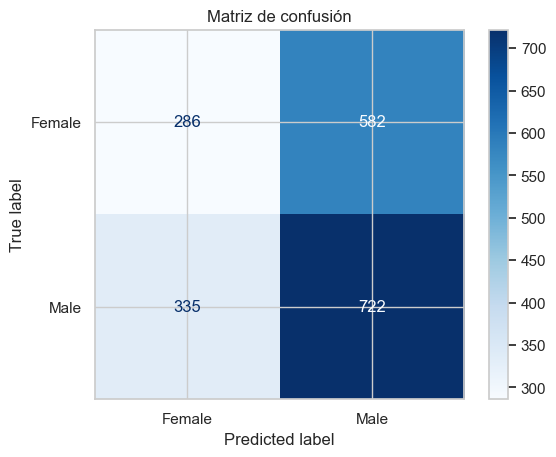

In [430]:
# Calcular la matriz de confusión y sus métricas
# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred_test)

# Plot with labels
disp = ConfusionMatrixDisplay(
    confusion_matrix=cm, 
    display_labels=['Female', 'Male']  # Adjust labels based on your encoding
)
disp.plot(cmap='Blues', values_format='d')
plt.title('Matriz de confusión')
plt.show()

In [431]:
# Convertir la matriz de confusión a porcentajes
cm_percentage = cm.astype('float') / cm.sum() * 100

# Imprimir la matriz en porcentajes con formato legible
print("Matriz de confusión en porcentajes:")
print(np.round(cm_percentage, 2))

Matriz de confusión en porcentajes:
[[14.86 30.23]
 [17.4  37.51]]


In [432]:
# Calculate metrics
accuracy_test = accuracy_score(y_test, y_pred_test)
roc_auc_test = roc_auc_score(y_test, y_proba_test)
report_test = classification_report(y_test, y_pred_test, zero_division=0)
print("\nMetricas de evaluacion:")
print("Accuracy:", accuracy_test)
print("ROC AUC:", roc_auc_test)
print("Classification Report:\n", report_test)


Metricas de evaluacion:
Accuracy: 0.5236363636363637
ROC AUC: 0.543976082208145
Classification Report:
               precision    recall  f1-score   support

           0       0.46      0.33      0.38       868
           1       0.55      0.68      0.61      1057

    accuracy                           0.52      1925
   macro avg       0.51      0.51      0.50      1925
weighted avg       0.51      0.52      0.51      1925




AUC-ROC: 0.544


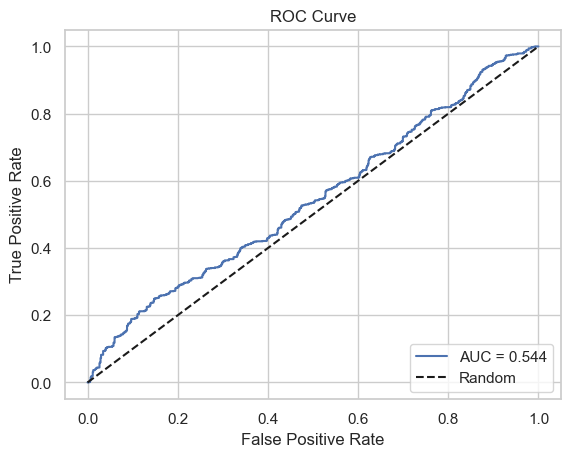

In [433]:
# Mostrar la curva ROC y calcular el area bajo la curva.

auc = roc_auc_score(y_test, y_proba_test)
print(f"\nAUC-ROC: {auc:.3f}")

# Curva ROC
fpr, tpr, thresholds = roc_curve(y_test, y_proba_test)
plt.plot(fpr, tpr, label=f'AUC = {auc:.3f}')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()

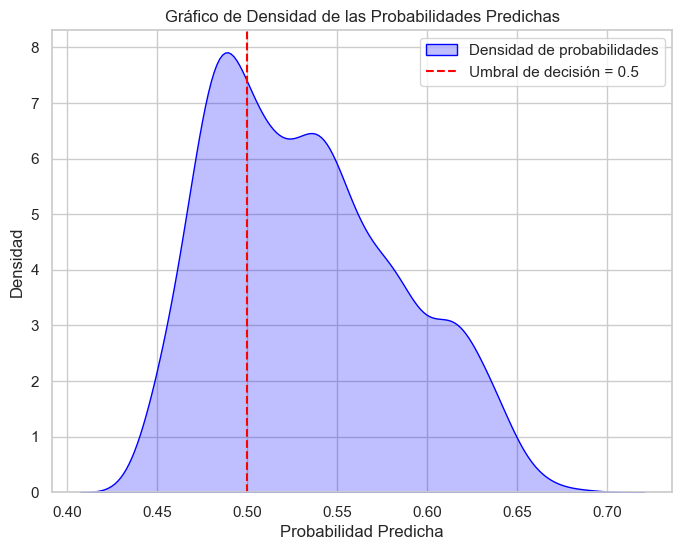

In [434]:
plt.figure(figsize=(8, 6))
sns.kdeplot(y_proba_test, fill=True, color="blue", label="Densidad de probabilidades")
plt.title('Gráfico de Densidad de las Probabilidades Predichas')
plt.xlabel('Probabilidad Predicha')
plt.ylabel('Densidad')
plt.axvline(x=0.5, color='red', linestyle='--', label="Umbral de decisión = 0.5")
plt.legend()
plt.grid(True)
plt.show()

### Pregunta 17 ###
Realizar una interpretación de los resultados obtenidos en las métricas: accuracy y recall (para ambas categorías 0 y 1). ¿Cuál es el valor del area bajo la curva obtenido? ¿Qué conclusión sobre el modelo obtenemos a partir de este valor? ¿Y cual sería la conclusión general del modelo en base a todos los resultados obtenidos?

***Respuesta:***

Con respecto a accuracy el modelo tiene una probabilidad de acertar cerca del 50%, y con recall el modelo tiene muchos falsos negativos o en otras palabras no selecciona correctamente cuando es mujer, pero adivina correctamente cuando es hombre.

El Valor de AUC es de 0.543 es bastante cercano a la linea random, por lo que es apenas un poco mejor que adivinar si es hombre o mujer el genero.

En si este modelo parece seleccionar al azar si es hombre o mujer, pero casi siempre acierta a hombres.

En conclusión estan sucediendo 3 cosas. 
1. Hay muy pocos datos/variables para poder predecir de manera correcta si es hombre o mujer.
2. Las variables actuales no se relacionan lo suficiente para predecir el genero.
3. Los datos presentados parecen indicar un sesgo a seleccionar hombre.

Cambiamos de tercio y pasamos ahora a trabajar con todo el conjunto de datos completo (incluyendo la variable ***Gender***) ya que vamos a realizar un clustering sobre todo el conjunto para ver qué grupos o segmentos encontramos más representativos en los datos. Empezaremos cargando un fichero nuevo que contiene los mismos datos pero sin la necesidad de tratar o trabajar nulos y outliers. El fichero se llama *Salary.csv*.

El clustering que vamos a realizar sobre estos datos es un clustering jerarquico aglomerativo. Para ello prepararemos los datos categorizando algunas variables según se considere oportuno, agruparemos categorías de variables categóricas si procede, normalizaremos y/o estandarizaremos, codificaremos variables categóricas, etc. Muchos de estos pasos son comunes con los ejercicios anteriores por lo que será sencillo repetir algunos de estos pasos. Otros podrán añadirse en función de lo que el alumno considere teniendo en cuenta el ejercicio de clusterización que vamos a llevar a cabo.

Las siguientes lineas de código deben llevar a cabo estas transformaciones.

Por sencillez a la hora de interpretar resultados, se recomienda trabajar sobre una copia del conjunto de datos original para poder extraer métricas a partir de los datos sin transformar.

In [439]:
data_parte2 = pd.read_csv('Salary.csv')

data_parte2.head()

,Age,Gender,Education Level,Job Title,Years of Experience,Salary,Country,Race,Senior
0,32.0,Male,1,Software Engineer,5.0,90000.0,UK,White,0
1,28.0,Female,2,Data Analyst,3.0,65000.0,USA,Hispanic,0
2,45.0,Male,3,Manager,15.0,150000.0,Canada,White,1
3,36.0,Female,1,Sales Associate,7.0,60000.0,USA,Hispanic,0
4,52.0,Male,2,Director,20.0,200000.0,USA,Asian,0


In [440]:
# Categorización de variables numericas
data_parte2.describe()

,Age,Education Level,Years of Experience,Salary,Senior
count,6684.000000,6684.000000,6684.000000,6684.000000,6684.000000
mean,33.610563,1.622382,8.077723,115307.175194,0.143477
std,7.595994,0.880474,6.029305,52806.810881,0.350585
min,21.000000,0.000000,0.000000,350.000000,0.000000
25%,28.000000,1.000000,3.000000,70000.000000,0.000000
50%,32.000000,1.000000,7.000000,115000.000000,0.000000
75%,38.000000,2.000000,12.000000,160000.000000,0.000000
max,62.000000,3.000000,34.000000,250000.000000,1.000000


In [441]:
cluster_sucio = data_parte2.copy()

In [442]:
bins = [21, 28, 32, 38, 62]  # Definir los cortes
labels = ["Joven Adulto", "Adulto", "Adulto Mayor", "Tercer Edad"]
cluster_sucio["Age"] = pd.cut(cluster_sucio["Age"], bins=bins, labels=labels)

In [443]:
bins = [0, 3, 7, 12, 34]
labels = ["Sin experiencia","Experimentado", "Experiencia Media", "Alta Experiencia"]
cluster_sucio["Years of Experience"] = pd.cut(cluster_sucio["Years of Experience"], bins=bins, labels=labels)

In [444]:
cluster_sucio["Salary"] = pd.qcut(cluster_sucio["Salary"], q=3, labels=["Bajo", "Medio", "Alto"])

In [445]:
cluster_sucio.head()

,Age,Gender,Education Level,Job Title,Years of Experience,Salary,Country,Race,Senior
0,Adulto,Male,1,Software Engineer,Experimentado,Medio,UK,White,0
1,Joven Adulto,Female,2,Data Analyst,Sin experiencia,Bajo,USA,Hispanic,0
2,Tercer Edad,Male,3,Manager,Alta Experiencia,Alto,Canada,White,1
3,Adulto Mayor,Female,1,Sales Associate,Experimentado,Bajo,USA,Hispanic,0
4,Tercer Edad,Male,2,Director,Alta Experiencia,Alto,USA,Asian,0


In [446]:
# Codificación de categóricas
cluster_categorico = cluster_sucio.copy()


In [447]:
cluster_categorico['Age'] = cluster_categorico['Age'].cat.codes
cluster_categorico['Years of Experience'] = cluster_categorico['Years of Experience'].cat.codes
cluster_categorico['Salary'] = cluster_categorico['Salary'].cat.codes

In [448]:
cluster_categorico.head()

,Age,Gender,Education Level,Job Title,Years of Experience,Salary,Country,Race,Senior
0,1,Male,1,Software Engineer,1,1,UK,White,0
1,0,Female,2,Data Analyst,0,0,USA,Hispanic,0
2,3,Male,3,Manager,3,2,Canada,White,1
3,2,Female,1,Sales Associate,1,0,USA,Hispanic,0
4,3,Male,2,Director,3,2,USA,Asian,0


In [449]:
categorical_data = cluster_categorico.select_dtypes(include=['object']).columns
cluster_categorico = pd.get_dummies(cluster_categorico, columns=categorical_data, drop_first=True)

In [450]:
cluster_categorico.head()

,Age,Education Level,Years of Experience,Salary,Senior,Gender_Male,Job Title_Account Manager,Job Title_Accountant,Job Title_Administrative Assistant,Job Title_Advertising Coordinator,Job Title_Back end Developer,Job Title_Business Analyst,Job Title_Business Development Associate,Job Title_Business Development Manager,Job Title_Business Intelligence Analyst,Job Title_Business Operations Analyst,Job Title_CEO,Job Title_Chief Data Officer,Job Title_Chief Technology Officer,Job Title_Consultant,Job Title_Content Marketing Manager,Job Title_Copywriter,Job Title_Creative Director,Job Title_Customer Service Manager,Job Title_Customer Service Rep,Job Title_Customer Service Representative,Job Title_Customer Success Manager,Job Title_Customer Success Rep,Job Title_Customer Support Specialist,Job Title_Data Analyst,Job Title_Data Engineer,Job Title_Data Entry Clerk,Job Title_Data Scientist,Job Title_Delivery Driver,Job Title_Designer,Job Title_Developer,Job Title_Digital Content Producer,Job Title_Digital Marketing Manager,Job Title_Digital Marketing Specialist,Job Title_Director,Job Title_Director of Business Development,Job Title_Director of Data Science,Job Title_Director of Engineering,Job Title_Director of Finance,Job Title_Director of HR,Job Title_Director of Human Capital,Job Title_Director of Human Resources,Job Title_Director of Marketing,Job Title_Director of Operations,Job Title_Director of Product Management,Job Title_Director of Sales,Job Title_Director of Sales and Marketing,Job Title_Engineer,Job Title_Event Coordinator,Job Title_Financial Advisor,Job Title_Financial Analyst,Job Title_Financial Manager,Job Title_Front End Developer,Job Title_Front end Developer,Job Title_Full Stack Engineer,Job Title_Graphic Designer,Job Title_HR Coordinator,Job Title_HR Generalist,Job Title_HR Manager,Job Title_HR Specialist,Job Title_Help Desk Analyst,Job Title_Human Resources Coordinator,Job Title_Human Resources Director,Job Title_Human Resources Manager,Job Title_Human Resources Specialist,Job Title_IT Consultant,Job Title_IT Manager,Job Title_IT Project Manager,Job Title_IT Support,Job Title_IT Support Specialist,Job Title_Juniour HR Coordinator,Job Title_Juniour HR Generalist,Job Title_Manager,Job Title_Marketing Analyst,Job Title_Marketing Coordinator,Job Title_Marketing Director,Job Title_Marketing Manager,Job Title_Marketing Specialist,Job Title_Network Engineer,Job Title_Office Manager,Job Title_Operations Analyst,Job Title_Operations Coordinator,Job Title_Operations Director,Job Title_Operations Manager,Job Title_Principal Engineer,Job Title_Principal Scientist,Job Title_Product Designer,Job Title_Product Development Manager,Job Title_Product Manager,Job Title_Product Marketing Manager,Job Title_Project Coordinator,Job Title_Project Engineer,Job Title_Project Manager,Job Title_Public Relations Manager,Job Title_Quality Assurance Analyst,Job Title_Receptionist,Job Title_Recruiter,Job Title_Research Director,Job Title_Research Scientist,Job Title_Researcher,Job Title_Sales Associate,Job Title_Sales Director,Job Title_Sales Executive,Job Title_Sales Manager,Job Title_Sales Operations Manager,Job Title_Sales Representative,Job Title_Scientist,Job Title_Social Media Man,Job Title_Social Media Manager,Job Title_Social Media Specialist,Job Title_Software Architect,Job Title_Software Developer,Job Title_Software Engineer,Job Title_Software Engineer Manager,Job Title_Software Manager,Job Title_Software Project Manager,Job Title_Strategy Consultant,Job Title_Supply Chain Analyst,Job Title_Supply Chain Manager,Job Title_Technical Recruiter,Job Title_Technical Support Specialist,Job Title_Technical Writer,Job Title_Training Specialist,Job Title_UX Designer,Job Title_UX Researcher,Job Title_VP of Finance,Job Title_VP of Operations,Job Title_Web Designer,Job Title_Web Developer,Country_Canada,Country_China,Country_UK,Country_USA,Race_Asian,Race_Australian,Race_Black,Race_Chinese,Race_Hispanic,Race_Korean,Race_Mixed,Race_Welsh,Race_White
0,1,

In [451]:
booleano = cluster_categorico.select_dtypes(include='bool').columns
cluster_categorico[booleano] = cluster_categorico[booleano].astype(int)

cluster_categorico = cluster_categorico.apply(pd.to_numeric, errors='coerce')

cluster_categorico.head()

,Age,Education Level,Years of Experience,Salary,Senior,Gender_Male,Job Title_Account Manager,Job Title_Accountant,Job Title_Administrative Assistant,Job Title_Advertising Coordinator,Job Title_Back end Developer,Job Title_Business Analyst,Job Title_Business Development Associate,Job Title_Business Development Manager,Job Title_Business Intelligence Analyst,Job Title_Business Operations Analyst,Job Title_CEO,Job Title_Chief Data Officer,Job Title_Chief Technology Officer,Job Title_Consultant,Job Title_Content Marketing Manager,Job Title_Copywriter,Job Title_Creative Director,Job Title_Customer Service Manager,Job Title_Customer Service Rep,Job Title_Customer Service Representative,Job Title_Customer Success Manager,Job Title_Customer Success Rep,Job Title_Customer Support Specialist,Job Title_Data Analyst,Job Title_Data Engineer,Job Title_Data Entry Clerk,Job Title_Data Scientist,Job Title_Delivery Driver,Job Title_Designer,Job Title_Developer,Job Title_Digital Content Producer,Job Title_Digital Marketing Manager,Job Title_Digital Marketing Specialist,Job Title_Director,Job Title_Director of Business Development,Job Title_Director of Data Science,Job Title_Director of Engineering,Job Title_Director of Finance,Job Title_Director of HR,Job Title_Director of Human Capital,Job Title_Director of Human Resources,Job Title_Director of Marketing,Job Title_Director of Operations,Job Title_Director of Product Management,Job Title_Director of Sales,Job Title_Director of Sales and Marketing,Job Title_Engineer,Job Title_Event Coordinator,Job Title_Financial Advisor,Job Title_Financial Analyst,Job Title_Financial Manager,Job Title_Front End Developer,Job Title_Front end Developer,Job Title_Full Stack Engineer,Job Title_Graphic Designer,Job Title_HR Coordinator,Job Title_HR Generalist,Job Title_HR Manager,Job Title_HR Specialist,Job Title_Help Desk Analyst,Job Title_Human Resources Coordinator,Job Title_Human Resources Director,Job Title_Human Resources Manager,Job Title_Human Resources Specialist,Job Title_IT Consultant,Job Title_IT Manager,Job Title_IT Project Manager,Job Title_IT Support,Job Title_IT Support Specialist,Job Title_Juniour HR Coordinator,Job Title_Juniour HR Generalist,Job Title_Manager,Job Title_Marketing Analyst,Job Title_Marketing Coordinator,Job Title_Marketing Director,Job Title_Marketing Manager,Job Title_Marketing Specialist,Job Title_Network Engineer,Job Title_Office Manager,Job Title_Operations Analyst,Job Title_Operations Coordinator,Job Title_Operations Director,Job Title_Operations Manager,Job Title_Principal Engineer,Job Title_Principal Scientist,Job Title_Product Designer,Job Title_Product Development Manager,Job Title_Product Manager,Job Title_Product Marketing Manager,Job Title_Project Coordinator,Job Title_Project Engineer,Job Title_Project Manager,Job Title_Public Relations Manager,Job Title_Quality Assurance Analyst,Job Title_Receptionist,Job Title_Recruiter,Job Title_Research Director,Job Title_Research Scientist,Job Title_Researcher,Job Title_Sales Associate,Job Title_Sales Director,Job Title_Sales Executive,Job Title_Sales Manager,Job Title_Sales Operations Manager,Job Title_Sales Representative,Job Title_Scientist,Job Title_Social Media Man,Job Title_Social Media Manager,Job Title_Social Media Specialist,Job Title_Software Architect,Job Title_Software Developer,Job Title_Software Engineer,Job Title_Software Engineer Manager,Job Title_Software Manager,Job Title_Software Project Manager,Job Title_Strategy Consultant,Job Title_Supply Chain Analyst,Job Title_Supply Chain Manager,Job Title_Technical Recruiter,Job Title_Technical Support Specialist,Job Title_Technical Writer,Job Title_Training Specialist,Job Title_UX Designer,Job Title_UX Researcher,Job Title_VP of Finance,Job Title_VP of Operations,Job Title_Web Designer,Job Title_Web Developer,Country_Canada,Country_China,Country_UK,Country_USA,Race_Asian,Race_Australian,Race_Black,Race_Chinese,Race_Hispanic,Race_Korean,Race_Mixed,Race_Welsh,Race_White
0,1,

In [452]:
cluster_categorico.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6684 entries, 0 to 6683
Columns: 147 entries, Age to Race_White
dtypes: int32(142), int64(2), int8(3)
memory usage: 3.7 MB


In [453]:
cluster_limpio = cluster_categorico.copy()

A continuación procedemos a definir la función de enlace para el algoritmo jerarquico aglomerativo. Se requiere porbar al menos 2 funciones de enlace y hacer todo el proceso de clusterización completo para dichas funciones. Crear las matrices de distancias basadas en dichas funciones y mostrar los dendogramas de la clusterización, a ser posible indicando con colores selección de clusters.

In [455]:
# Crear las matrices de distancias para lsa funciones de enlace escogidas
distance_matrix = ssd.pdist(cluster_limpio, metric='euclidean')

distance_subsample_square = ssd.squareform(distance_matrix)

In [457]:
Z_complete = sch.linkage(cluster_limpio, method='complete')

In [459]:
Z_ward = sch.linkage(cluster_limpio, method='ward', metric='euclidean')

In [461]:
columns = ['Índice 1', 'Índice 2', 'Distancia', 'Número de elementos en el clúster']
df_complete = pd.DataFrame(Z_complete, columns=columns)
df_ward = pd.DataFrame(Z_ward, columns=columns)

In [463]:
print("🔹 Matriz de distancias - Enlace Completo:")
print(df_complete)


🔹 Matriz de distancias - Enlace Completo:
      Índice 1  Índice 2  Distancia  Número de elementos en el clúster
0       1235.0    1384.0   0.000000                                2.0
1       1467.0    6684.0   0.000000                                3.0
2       1475.0    1601.0   0.000000                                2.0
3       1788.0    6686.0   0.000000                                3.0
4       1952.0    6687.0   0.000000                                4.0
...        ...       ...        ...                                ...
6678   13355.0   13357.0   4.690416                             2334.0
6679   13339.0   13359.0   4.898979                             1292.0
6680   13361.0   13363.0   5.196152                             2877.0
6681   13362.0   13364.0   5.830952                             5211.0
6682   13360.0   13365.0   7.280110                             6684.0

[6683 rows x 4 columns]


In [465]:
print("\n🔹 Matriz de distancias - Enlace Ward:")
print(df_ward)


🔹 Matriz de distancias - Enlace Ward:
      Índice 1  Índice 2   Distancia  Número de elementos en el clúster
0       1235.0    1384.0    0.000000                                2.0
1       1467.0    6684.0    0.000000                                3.0
2       2459.0    2527.0    0.000000                                2.0
3       2598.0    6686.0    0.000000                                3.0
4       1475.0    1601.0    0.000000                                2.0
...        ...       ...         ...                                ...
6678   13306.0   13350.0   35.495175                              711.0
6679   13361.0   13362.0   43.949211                             2156.0
6680   13353.0   13359.0   44.851043                             2719.0
6681   13360.0   13363.0   67.152234                             3965.0
6682   13364.0   13365.0  180.422999                             6684.0

[6683 rows x 4 columns]


In [467]:
cluster_limpio_copy = cluster_limpio.copy()

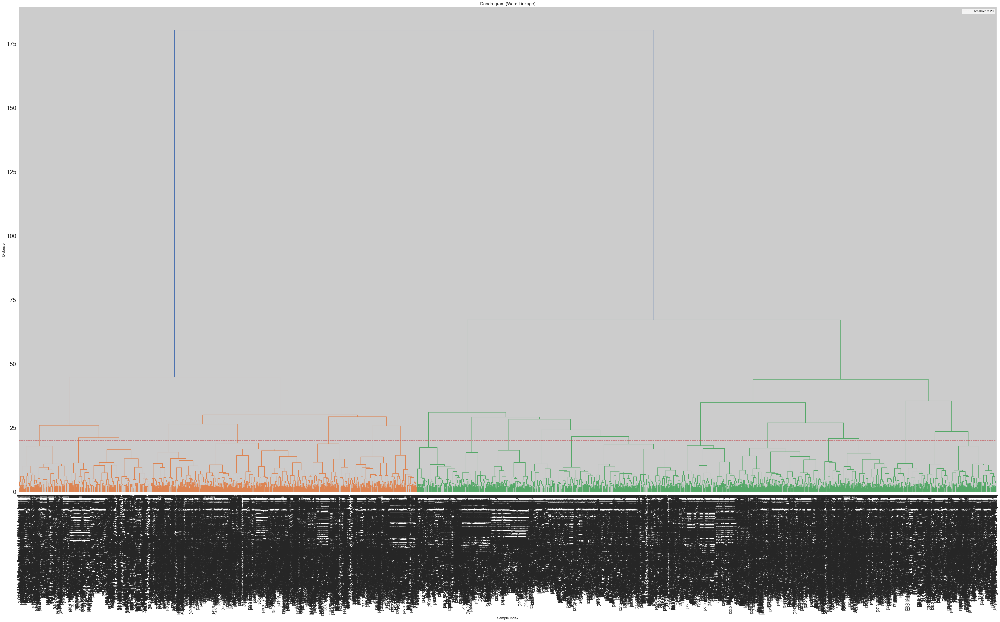

In [471]:
# Mostrar los dendogramas
plt.figure(figsize=(60, 30))
sch.dendrogram(Z_ward, labels=data_parte2.values, leaf_rotation=90, leaf_font_size=6)

plt.axhline(y=20, color='r', linestyle='--', alpha=0.7, label=f'Threshold = {20}')
plt.legend()

plt.title('Dendrogram (Ward Linkage)', fontsize=15)
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.xticks(fontsize=12)
plt.yticks(fontsize=20)


plt.show()

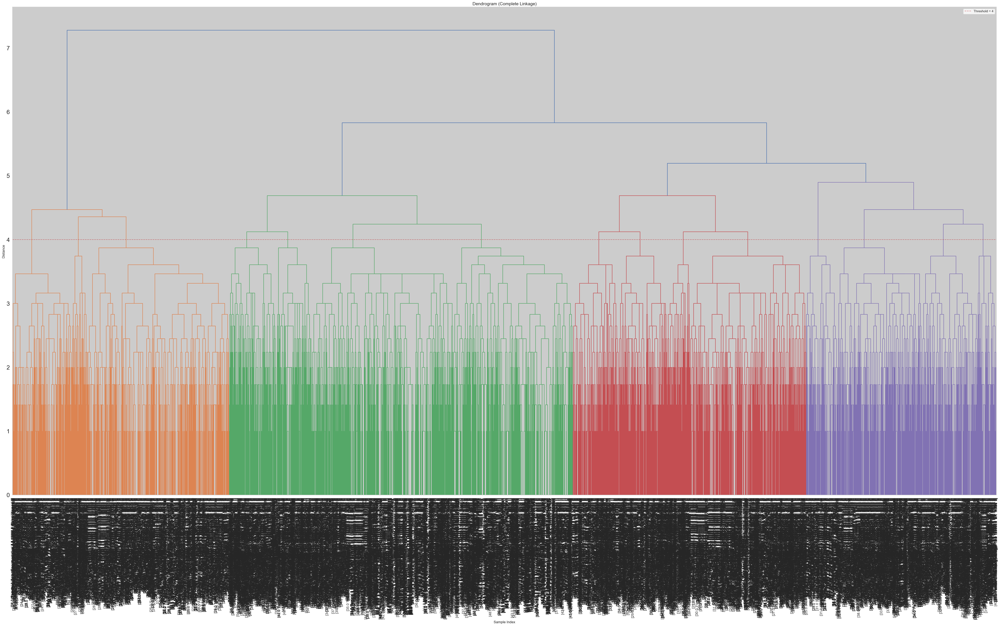

In [472]:
plt.figure(figsize=(60, 30))
sch.dendrogram(Z_complete, labels=data_parte2.values, leaf_rotation=90, leaf_font_size=6)

plt.axhline(y=4, color='r', linestyle='--', alpha=0.7, label=f'Threshold = {4}')
plt.legend()

plt.title('Dendrogram (Complete Linkage)', fontsize=15)
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.xticks(fontsize=12)
plt.yticks(fontsize=20)


plt.show()

In [477]:
threshold = 4
clusters_complete = sch.fcluster(Z_complete, threshold, criterion='distance')

# Agregar los clústeres al dataframe
cluster_limpio_copy['Cluster'] = clusters_complete

cluster_limpio_copy['Cluster'].value_counts()

Cluster
3     964
6     964
7     811
11    788
13    570
1     406
14    379
9     326
4     325
8     315
5     234
12    216
10    156
15    127
2     103
Name: count, dtype: int64

In [479]:
threshold = 20
clusters_ward = sch.fcluster(Z_ward, threshold, criterion='distance')

# Agregar los clústeres al dataframe
cluster_limpio_copy['Cluster'] = clusters_ward

cluster_limpio_copy['Cluster'].value_counts()

Cluster
5     703
14    584
16    580
3     407
15    385
4     368
1     350
18    341
21    314
6     312
9     305
13    265
11    262
7     249
19    229
10    204
12    189
8     185
20    168
2     145
17    139
Name: count, dtype: int64

### Pregunta 18 ###
A la vista de los resultados, para cada función de enlace escogida, ¿En cuántos clusters se ha decidido agrupar los datos?

***Respuesta:***

Se escogio el enlace complete con 15 clusters. Para el enlace de ward se escogieron 21 clusters

A continuación crear varias columnas nuevas sobre el dataframe original (una por cada función de enlace con que se haya decidido trabajar) y almacenar en ellas para cada registro el número de cluster que le corresponde según la clusterización realizada. Después realizar una serie de agrupaciones y métricas que permitan entender o interpretar la naturaleza de cada cluster.

In [481]:
# Agregar columnas al dataframe original

data_parte2['Cluster_Complete'] = clusters_complete
data_parte2['Cluster_Ward'] = clusters_ward

In [483]:
data_parte2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6684 entries, 0 to 6683
Data columns (total 11 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Age                  6684 non-null   float64
 1   Gender               6684 non-null   object 
 2   Education Level      6684 non-null   int64  
 3   Job Title            6684 non-null   object 
 4   Years of Experience  6684 non-null   float64
 5   Salary               6684 non-null   float64
 6   Country              6684 non-null   object 
 7   Race                 6684 non-null   object 
 8   Senior               6684 non-null   int64  
 9   Cluster_Complete     6684 non-null   int32  
 10  Cluster_Ward         6684 non-null   int32  
dtypes: float64(3), int32(2), int64(2), object(4)
memory usage: 522.3+ KB


In [485]:
# Obtener métricas para interpretar los clustering obtenidos

numeric_cols = data_parte2.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Group by cluster and compute metrics for numeric columns only
cluster_summary_complete = (
    data_parte2[numeric_cols + ['Cluster_Complete']]
    .groupby('Cluster_Complete')
    .agg(['mean', 'median', 'std'])
    .transpose()
    .reset_index()
    .rename(columns={'level_0': 'Feature', 'level_1': 'Metric'})
)

categorical_cols = data_parte2.select_dtypes(include=['object', 'category']).columns.tolist()  # Replace with your actual categorical columns

cluster_summary_categorical = (
    data_parte2[categorical_cols + ['Cluster_Complete']]
    .groupby('Cluster_Complete')
    .agg(lambda x: x.mode()[0])  # Most frequent category
)

cluster_pivot_complete = cluster_summary_complete.pivot(
    index='Feature', 
    columns='Metric'
)

In [487]:
cluster_pivot_complete

Cluster_Complete                1                                   2  \
Metric                       mean   median          std          mean   
Feature                                                                 
Age                     25.997537     26.0     2.729355     26.155340   
Education Level          0.078818      0.0     0.269787      2.213592   
Salary               32776.091133  30000.0  9614.118679  78953.708738   
Senior                   0.004926      0.0     0.070100      0.019417   
Years of Experience      1.140394      1.0     0.887495      1.970874   

Cluster_Complete                                       3           \
Metric                median           std          mean   median   
Feature                                                             
Age                     27.0      1.824438     26.314315     26.0   
Education Level          2.0      0.498045      1.030083      1.0   
Salary               70000.0  34321.462130  65151.624481  60000.0   
Senior                   0.0      0.138662      0.009336      0.0   
Years of Experience      2.0      1.102193      2.200207      2.0   

Cluster_Complete                               4                          \
Metric                        std           mean    median           std   
Feature                                                                    
Age                      1.785415      35.741538      35.0      3.045078   
Education Level          0.322451       1.470769       1.0      0.499915   
Salary               23152.840835  146918.526154  146075.0  37371.621962   
Senior                   0.096221       0.249231       0.0      0.433235   
Years of Experience      1.029351      10.209231      10.0      2.167217   

Cluster_Complete                 5                                      6  \
Metric                        mean    median           std           mean   
Feature                                                                     
Age                      42.888889      42.0      4.454400      41.533195   
Education Level           1.239316       1.0      0.466004       2.650415   
Salary               160619.175214  167015.0  35022.362433  164544.594398   
Senior                    0.282051       0.0      0.450963       0.200207   
Years of Experience      16.594017      16.0      4.675951      14.591286   

Cluster_Complete                                         7            \
Metric                 median           std           mean    median   
Feature                                                                
Age                      41.0      6.463729      44.378545      44.0   
Education Level           3.0      0.477086       2.545006       3.0   
Salary               170000.0  27368.016901  172034.171393  180000.0   
Senior                    0.0      0.400363       0.458693       0.0   
Years of Experience      14.0      4.614637      16.044390      16.0   

Cluster_Complete                               8                          \
Metric                        std           mean    median           std   
Feature                                                                    
Age                      5.115793      29.177778      29.0      1.958197   
Education Level          0.580663       1.152381       1.0      0.417323   
Salary               27122.252540  132115.619048  140000.0  30806.189372   
Senior                   0.498598       0.241270       0.0      0.428534   
Years of Experience      4.276032       5.533333       5.0      1.478508   

Cluster_Complete                9                                   10  \
Metric                       mean   median           std          mean   
Feature                                                                  
Age                     31.095092     30.0      2.154103     29.032051   
Education Level          1.015337      1.0      0.327805      2.314103   
Salary               68235.736196  70000.0  16449.517755  93422.205128   
Senior

In [489]:
cluster_summary_categorical

,Gender,Job Title,Country,Race
Cluster_Complete,,,,
1,Female,Sales Associate,Australia,White
2,Female,Back end Developer,USA,Asian
3,Male,Software Engineer,China,White
4,Male,Product Manager,China,White
5,Male,Financial Manager,China,White
6,Male,Software Engineer Manager,China,White
7,Male,Project Engineer,Canada,Asian
8,Male,Software Engineer,USA,White
9,Male,Marketing Coordinator,USA,White


In [491]:
cluster_summary_ward = (
    data_parte2[numeric_cols + ['Cluster_Ward']]
    .groupby('Cluster_Ward')
    .agg(['mean', 'median', 'std'])
    .transpose()
    .reset_index()
    .rename(columns={'level_0': 'Feature', 'level_1': 'Metric'})
)
cluster_categorical_ward = (
    data_parte2[categorical_cols + ['Cluster_Ward']]
    .groupby('Cluster_Ward')
    .agg(lambda x: x.mode()[0])  # Most frequent category
)

cluster_pivot_ward = cluster_summary_ward.pivot(
    index='Feature', 
    columns='Metric'
)

In [493]:
cluster_pivot_ward

Cluster_Ward                     1                                      2  \
Metric                        mean    median           std           mean   
Feature                                                                     
Age                      44.988571      45.0      3.968340      45.579310   
Education Level           2.668571       3.0      0.483404       2.503448   
Salary               176472.502857  182506.0  17928.738148  176888.662069   
Senior                    0.994286       1.0      0.075485       0.303448   
Years of Experience      16.262857      16.0      4.184778      17.420690   

Cluster_Ward                                             3            \
Metric                 median           std           mean    median   
Feature                                                                
Age                      45.0      4.802588      46.734644      46.0   
Education Level           3.0      0.708325       2.877150       3.0   
Salary               180000.0  23883.813917  181046.380835  185000.0   
Senior                    0.0      0.461341       0.014742       0.0   
Years of Experience      16.0      3.934655      17.646192      17.0   

Cluster_Ward                                   4                          \
Metric                        std           mean    median           std   
Feature                                                                    
Age                      5.151723      42.576087      42.0      4.489124   
Education Level          0.328669       1.654891       2.0      0.565038   
Salary               21747.463017  168932.823370  170000.0  27537.815574   
Senior                   0.120667       0.154891       0.0      0.362294   
Years of Experience      4.198009      16.201087      14.0      4.213356   

Cluster_Ward                     5                                      6  \
Metric                        mean    median           std           mean   
Feature                                                                     
Age                      36.100996      35.0      3.383770      39.532051   
Education Level           1.783784       2.0      0.457815       2.166667   
Salary               130349.274538  125000.0  32124.656951  146860.179487   
Senior                    0.267425       0.0      0.442931       0.173077   
Years of Experience      10.088193       9.0      2.603015      12.846154   

Cluster_Ward                                             7            \
Metric                 median           std           mean    median   
Feature                                                                
Age                      37.5      6.312770      35.734940      35.0   
Education Level           2.0      0.759365       2.975904       3.0   
Salary               140000.0  35616.735641  151967.871486  160000.0   
Senior                    0.0      0.378921       0.265060       0.0   
Years of Experience      12.0      4.959844      11.261044      11.0   

Cluster_Ward                                   8                          \
Metric                        std           mean    median           std   
Feature                                                                    
Age                      2.885242      40.448649      40.0      6.209111   
Education Level          0.153657       2.270270       2.0      0.731610   
Salary               25545.322071  158305.286486  160000.0  32917.209222   
Senior                   0.442254       0.232432       0.0      0.423529   
Years of Experience      1.593880      13.464865      12.0      4.356418   

Cluster_Ward                    9                                  10  \
Metric                       mean   median          std          mean   
Feature                                                                 
Age                     26.029508     26.0     2.927150     28.348039   
Education Level          0.013115      0.0     0.113953      1.117647   
Salary               30657.83

In [495]:
cluster_categorical_ward

,Gender,Job Title,Country,Race
Cluster_Ward,,,,
1,Male,Project Engineer,Australia,White
2,Male,Software Engineer Manager,UK,Mixed
3,Male,Software Engineer Manager,Australia,White
4,Male,Financial Manager,Australia,White
5,Female,Marketing Manager,UK,White
6,Male,Software Engineer Manager,China,Korean
7,Male,Research Scientist,UK,White
8,Male,Data Scientist,Canada,Black
9,Female,Sales Associate,Australia,White


### Pregunta 19 ###
Hacer una interpretación de los resultados para cada función de enlace indicando el sentido que pueda tener cada uno de los clusters.

***Respuesta:***

Enlace Complete:
    1. El enlace completo prioriza la máxima distancia entre clusters, creando grupos más compactos y bastante separados. Esto resulta en menos 
    clusters (15) pero con diferencias marcadas entre ellos.
    2. El Cluster 1 son personas jovenes 26 años, con un nivel educativo bajo, salarios promedio bajos 32k dolares, sin roles senior. Segun la moda
    parece estar formado, por mujeres de Australia, blancas y que trabajan como Sales Associate.
    3. El Cluster 4 tiene una edad media 32 años, con un nivel educativo medio, salario promedio alto de 146k dolares, con un 25% de roles senior.
    Segun la moda parece estar formado, por hombres de China, blancos y que trabajan como Project Management.
    4. El Cluster 7 tiene una edad avanzada media de 44 años, salarios muy altos 172k dolares, con 45% de roles senior. Segun la moda esta conformado
    por hombres de Canada, asiaticos y que trabajan como Project Engineer.
    5. El patrón general de los clusters es una diferenciacion por edad, experiencia y salario, con roles y ubicaciones geograficas especificas.

Enlace Ward:
    1. Minimiza la varianza interna, generando clusters más homogéneos y numerosos (21). Es útil para identificar subgrupos detallados, aunque con
    posibles sobreposiciones.
    2. El Cluster 1 son mas de 16 años de experiencia y con edad media de 45 años, educación alta, salarios altos 176k dolares, 99% en roles seniors. 
    Segun la moda esta conformado por hombres de Australia, blancos y trabajan como Project Engineer.
    3. El Cluster 9 son Jóvenes promedio de 26 años, educación muy baja, salarios mínimos promedio de 30k dolares, sin seniors. Segun la moda esta 
    conformado por mujeres de Australia, blancas y trabajan como Sales Associate.
    4. El Cluster 16 son de Edad media promedio 31 años, educación moderada, salarios medios promedio de 81k dolares. Segun la moda esta conformado por 
    hombres de Australia, blancos y trabajan como Marketing Coordinator.
    5. El Cluster 20 son de Edad joven promedio de 28 años, educación técnica, salarios altos promediando 159k dolares. Segun la moda esta conformado 
    por mujeres de Estados Unidos, asiaticas y trabajan como Software Engineer.
    6. El patrón general de los clusters Mayor granularidad en nivel educativo y roles especializados. También se observa diversidad étnica en clusters 
    específicos